In [1]:
PATH_ = "C:\\Users\\ICN_admin\\Dropbox (Brain Modulation Lab)\\Shared Lab Folders\\CRCNS\\MOVEMENT DATA\\derivatives\\Int_old_grid\\"

In [2]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn import linear_model, metrics
from sklearn.model_selection import cross_val_score
import os 
from matplotlib import pyplot as plt
import pickle
import seaborn as sb
import pandas as pd
import numpy as np
from scipy import stats
import sys
sys.path.append('C:\\Users\\ICN_admin\\Documents\\icn\\icn_stats\\')
import icn_permutation_test

In [3]:
def append_time_dim(arr, y_, time_stamps):
    """
    apply added time dimension for the data array and label given time_stamps (with downsample_rate=100) in 100ms / need to check with 1375Hz
    """
    time_arr = np.zeros([arr.shape[0]-time_stamps, int(time_stamps*arr.shape[1])])
    for time_idx, time_ in enumerate(np.arange(time_stamps, arr.shape[0])):
        for time_point in range(time_stamps):
            time_arr[time_idx, time_point*arr.shape[1]:(time_point+1)*arr.shape[1]] = arr[time_-time_point,:]
    return time_arr, y_[time_stamps:]

In [4]:
def evalerror(preds, dtrain):
        """
        Custom defined r^2 evaluation function
        """
        labels = dtrain.get_label()
        # return a pair metric_name, result. The metric name must not contain a
        # colon (:) or a space since preds are margin(before logistic
        # transformation, cutoff at 0)

        r2 = metrics.r2_score(labels, preds)

        if r2 < 0:
            r2 = 0

        return 'r2', r2

000
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
000
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
000
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
000
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


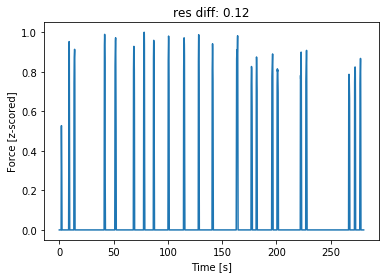

0.42269033333333333


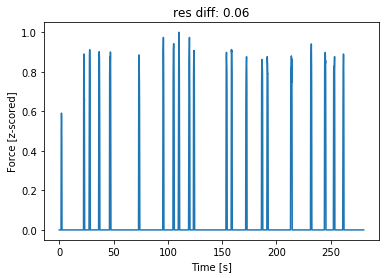

0.17122433333333334


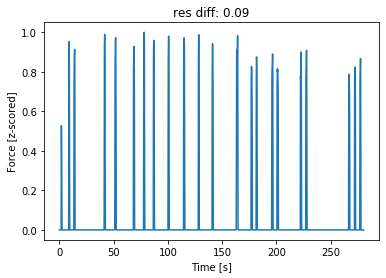

0.6432570000000001


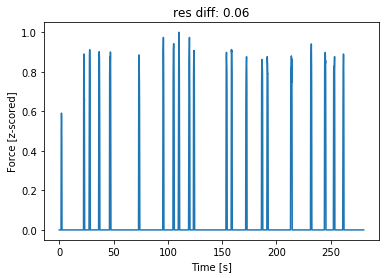

0.03319833333333334


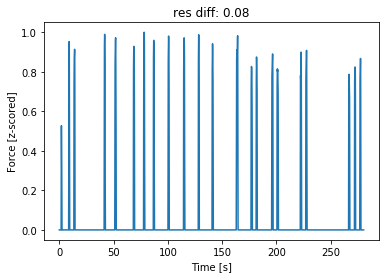

0.5974119999999999


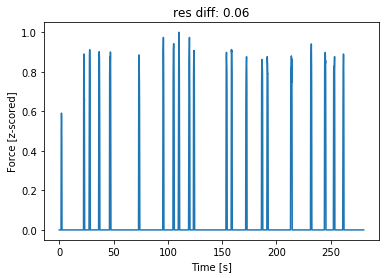

0.45378300000000005


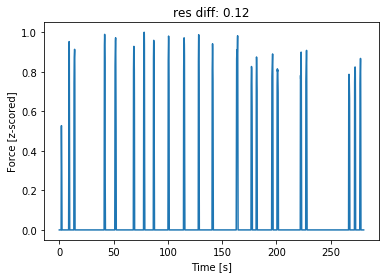

0.8036583333333334


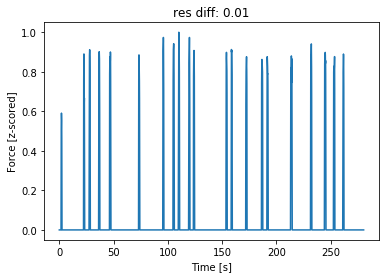

0.5354450000000001


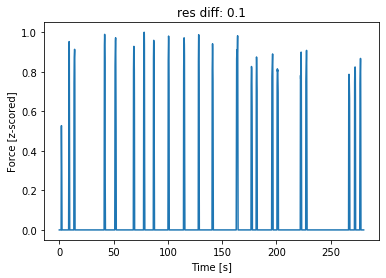

0.6964053333333333


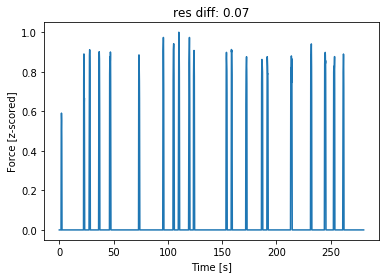

0.39733233333333334


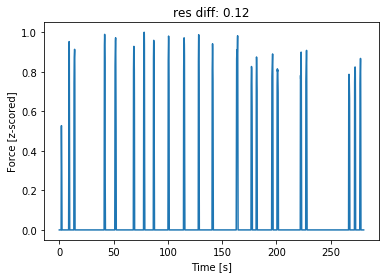

0.7038266666666667


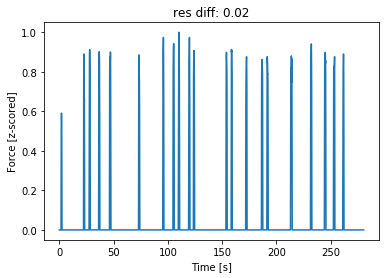

0.30828099999999997


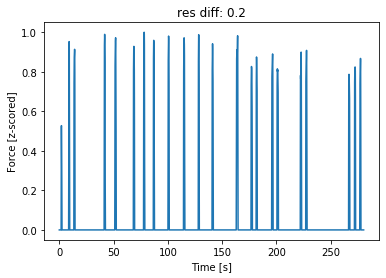

0.7045253333333333


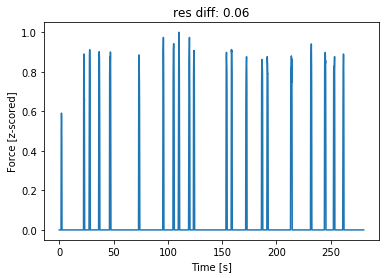

0.26795566666666665


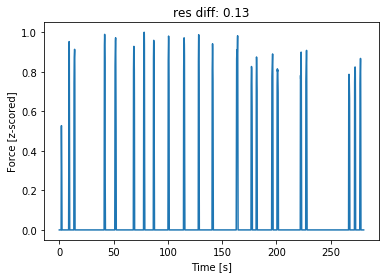

0.6523736666666666


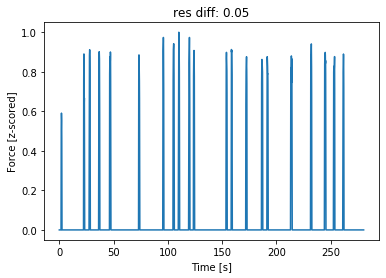

0.22397266666666668


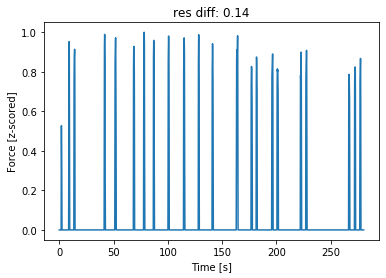

0.575561


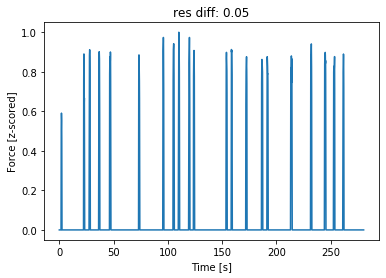

001
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'ECOG_LEFT_8', 'ECOG_LEFT_9', 'ECOG_LEFT_10', 'ECOG_LEFT_11', 'ECOG_LEFT_12', 'ECOG_LEFT_13', 'ECOG_LEFT_14', 'ECOG_LEFT_15', 'ECOG_LEFT_16', 'ECOG_LEFT_17', 'ECOG_LEFT_18', 'ECOG_LEFT_19', 'ECOG_LEFT_20', 'ECOG_LEFT_21', 'ECOG_LEFT_22', 'ECOG_LEFT_23', 'ECOG_LEFT_24', 'ECOG_LEFT_25', 'ECOG_LEFT_26', 'ECOG_LEFT_27', 'MOV_RIGHT', 'MOV_LEFT']
001
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'ECOG_LEFT_8', 'ECOG_LEFT_9', 'ECOG_LEFT_10', 'ECOG_LEFT_11', 'ECOG_LEFT_12', 'ECOG_LEFT_13', 'ECOG_LEFT_14', 'ECOG_LEFT_15', 'ECOG_LEFT_16', 'ECOG_LEFT_17', 'ECOG_LEFT_18', 'ECOG_LEFT_19', 'ECOG_LEFT_20', 'ECOG_LEFT_21', 'ECOG_LEFT_22', 'ECOG_LEFT_23', 'ECOG_LEFT_24', 'ECOG_LEFT_25', 'ECOG_LEFT_26', 'ECOG_LEFT_27', 'MOV_RIGHT', 'MOV_LEFT']
001
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3',

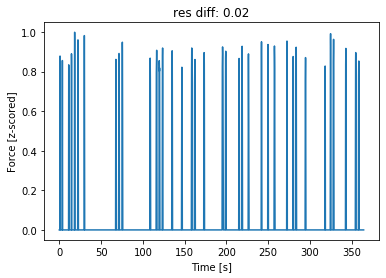

0.117402


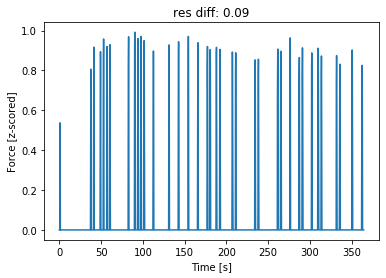

0.015161666666666665


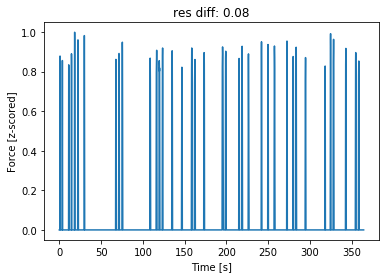

0.020810333333333333


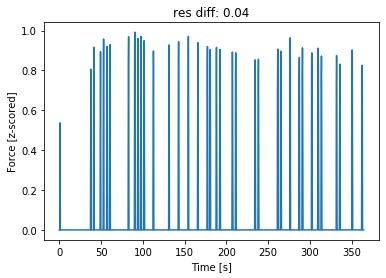

0.0038036666666666666


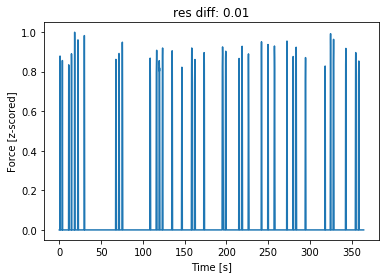

0.0


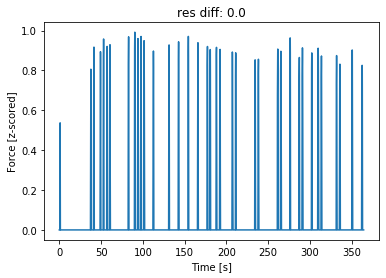

0.11839733333333334


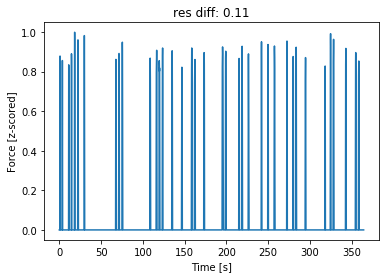

0.04435366666666667


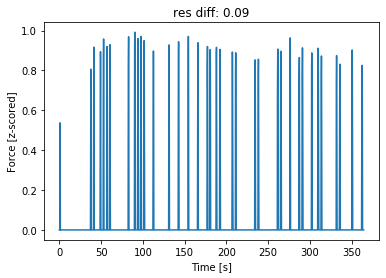

0.2790606666666667


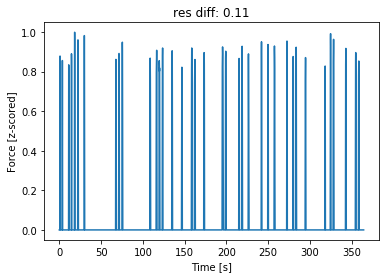

0.039571999999999996


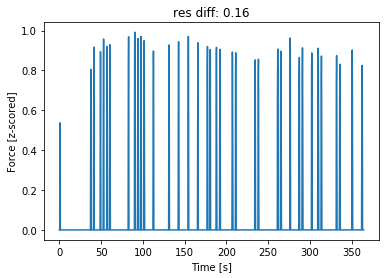

0.3052996666666667


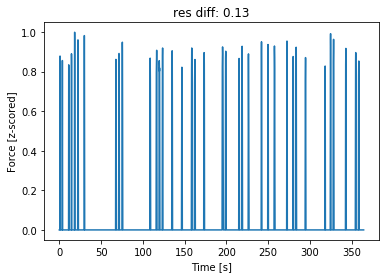

0.11901533333333332


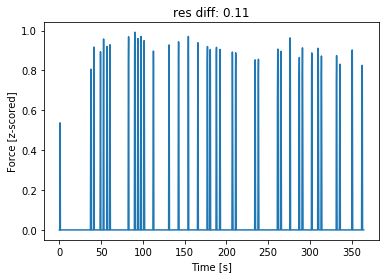

0.16743166666666667


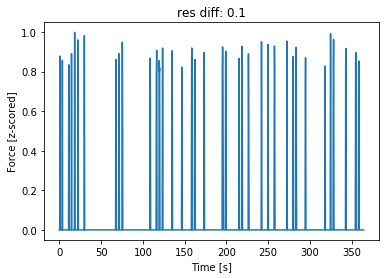

0.020517999999999998


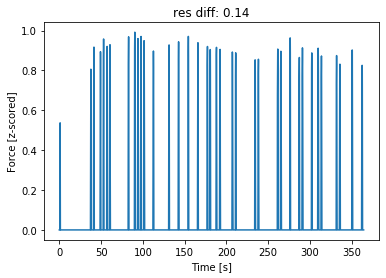

0.3375316666666666


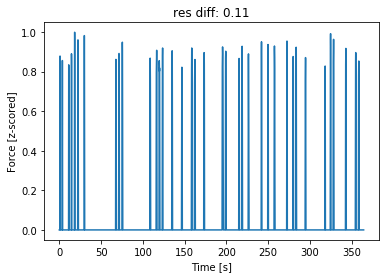

0.07404466666666666


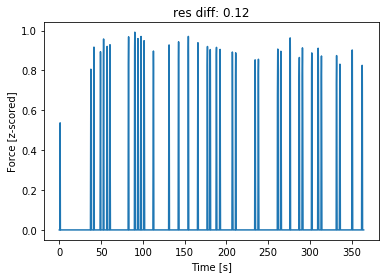

0.3734383333333333


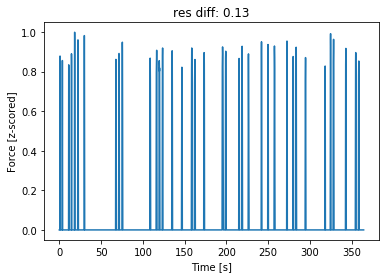

0.16643133333333335


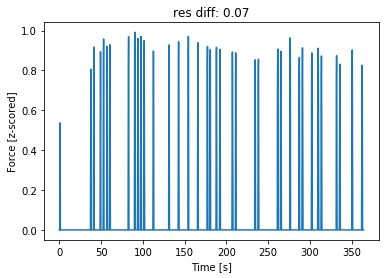

0.48322933333333334


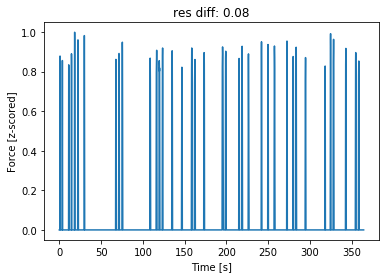

0.19615733333333332


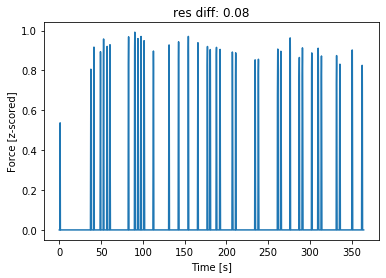

0.35481199999999996


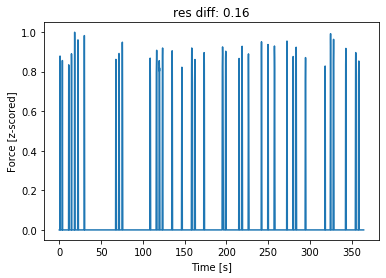

0.158656


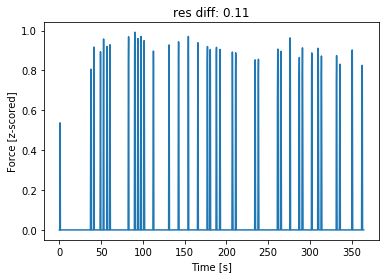

0.32854466666666665


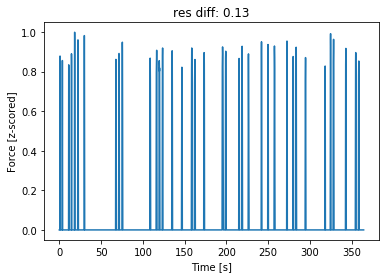

0.10066766666666667


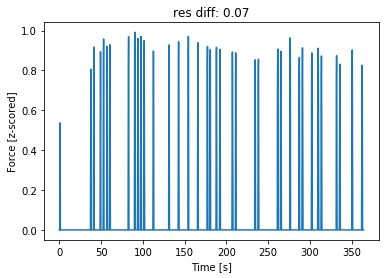

0.3683066666666667


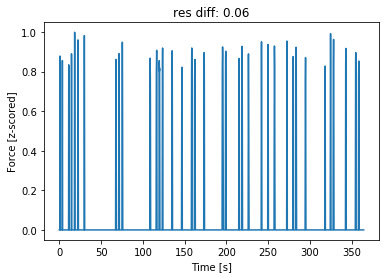

0.16138299999999997


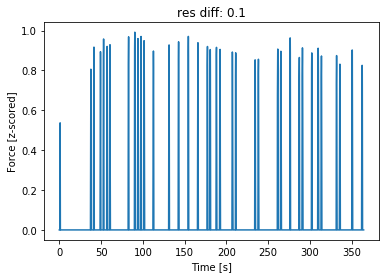

0.28947666666666666


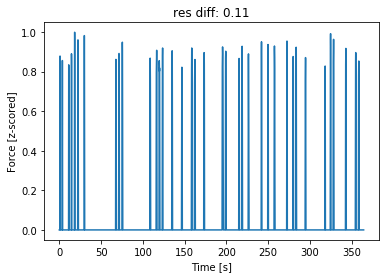

0.14706633333333333


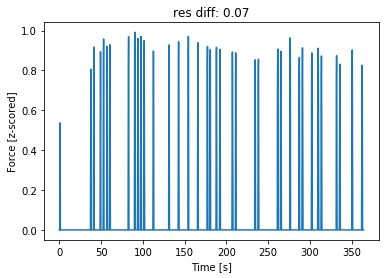

0.1326436666666667


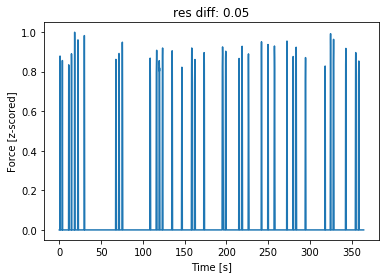

0.119299


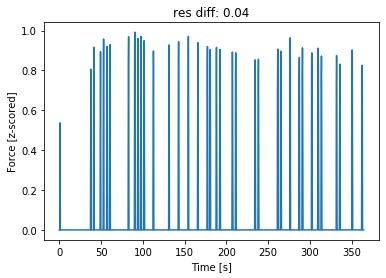

0.06056


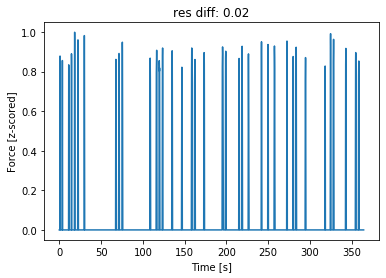

0.0


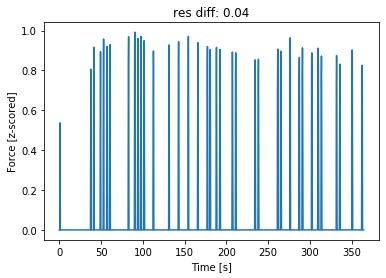

0.09677433333333334


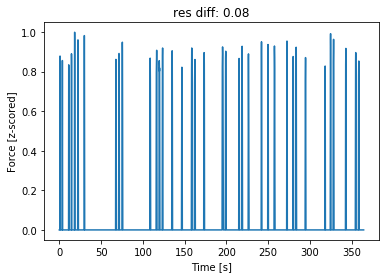

0.06989533333333332


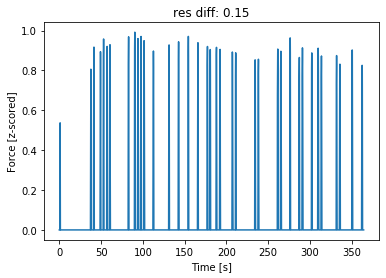

0.16868400000000003


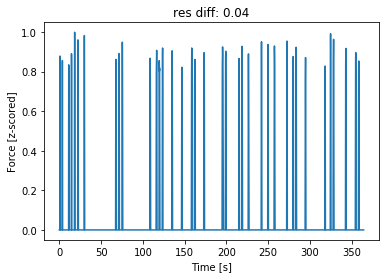

0.04135766666666667


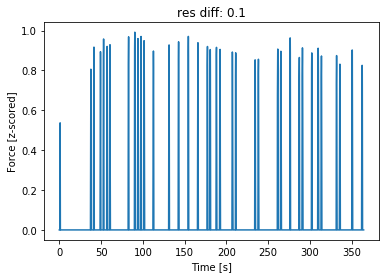

0.2524296666666667


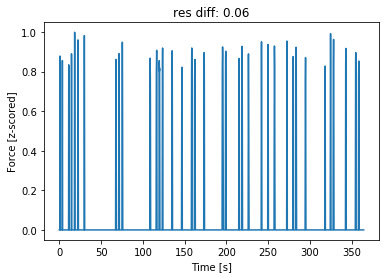

0.018451333333333333


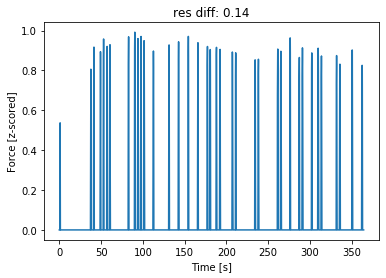

0.3480856666666667


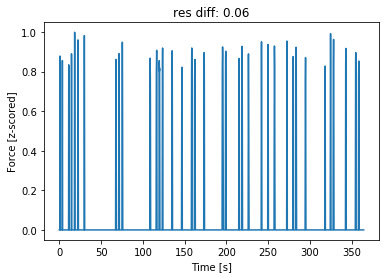

0.05188399999999999


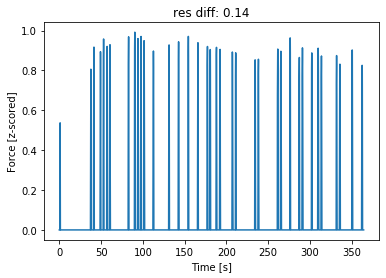

0.22328333333333336


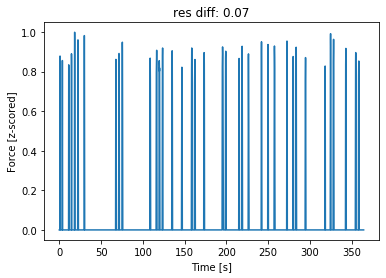

0.044626


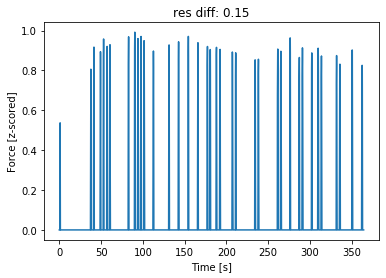

0.20964233333333335


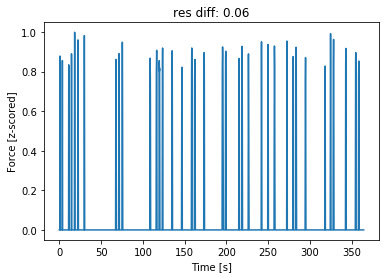

0.025048


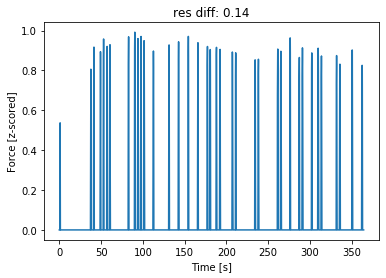

0.133315


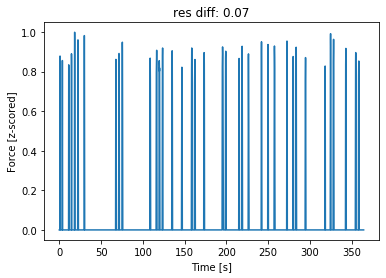

0.005677333333333333


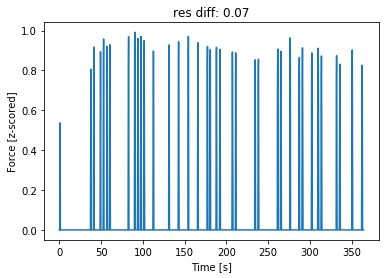

0.31429266666666666


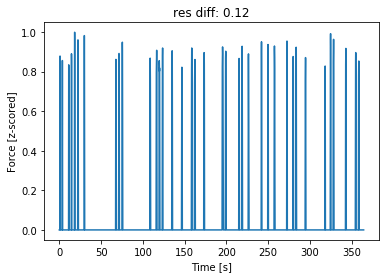

0.15414033333333335


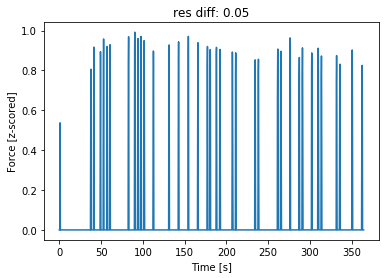

0.291375


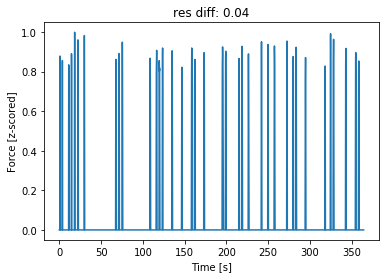

0.017234


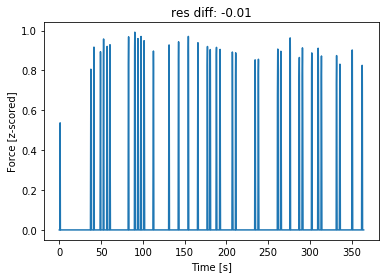

0.4402966666666666


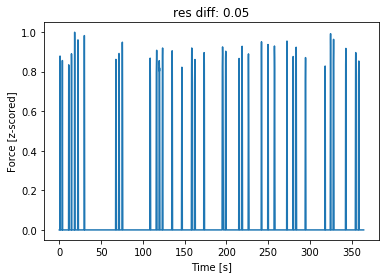

0.07636766666666667


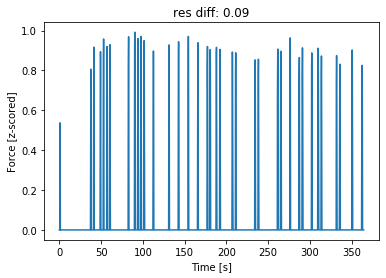

0.5377123333333333


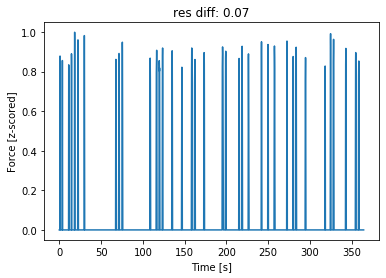

0.18225733333333335


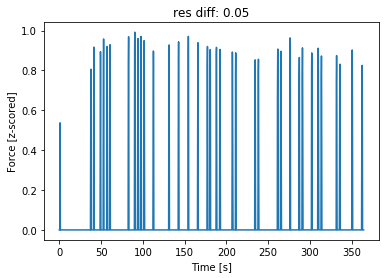

0.396842


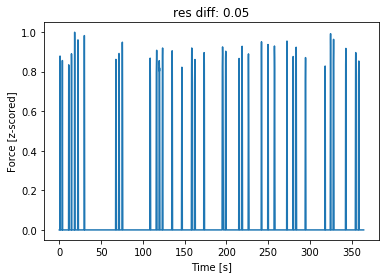

0.052224333333333324


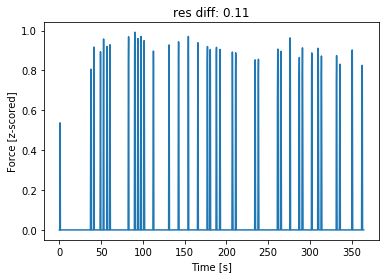

0.124929


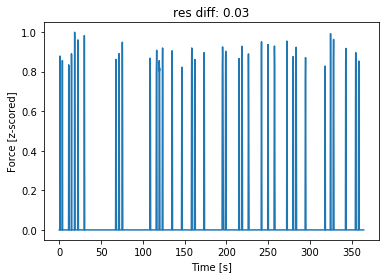

0.08921066666666666


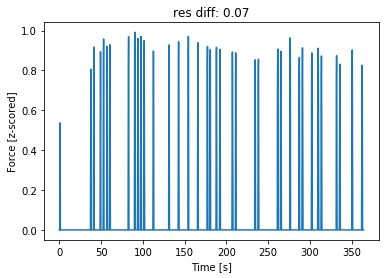

0.026598333333333335


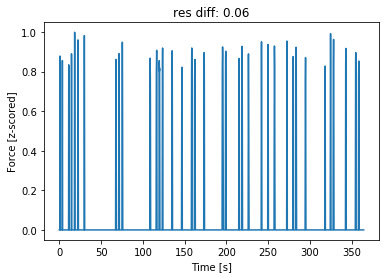

0.059108


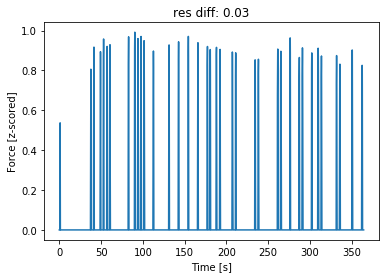

0.0


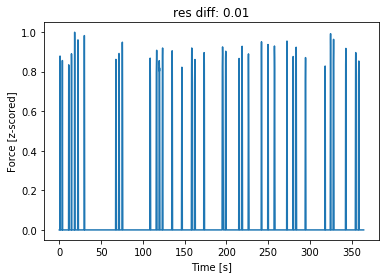

0.006866333333333333


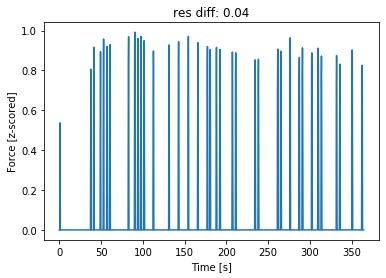

001
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.010004333333333334


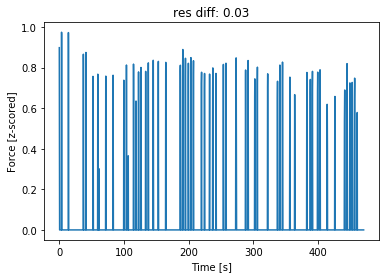

0.017921333333333334


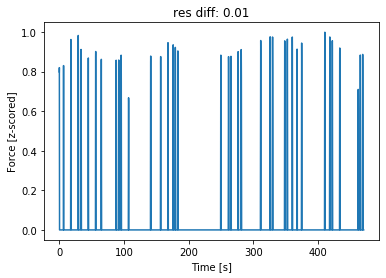

0.0037023333333333335


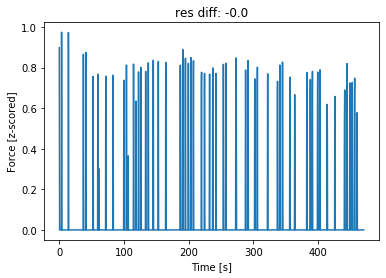

0.0


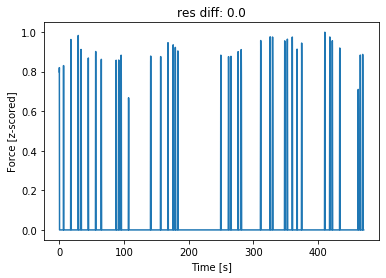

0.0


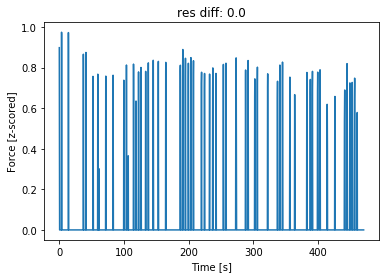

0.0


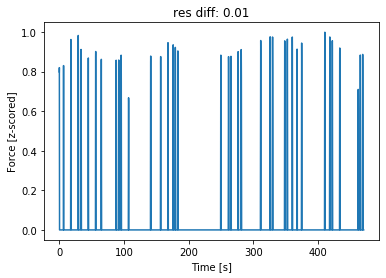

0.012853999999999999


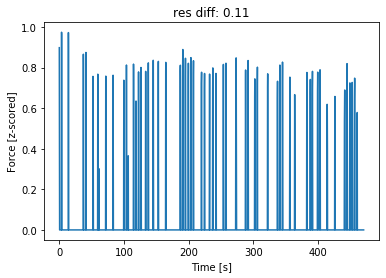

0.15772366666666665


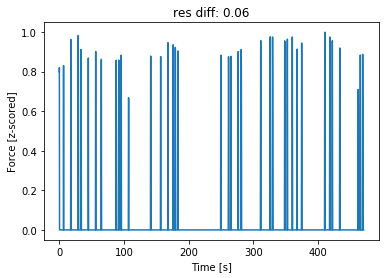

0.014349333333333334


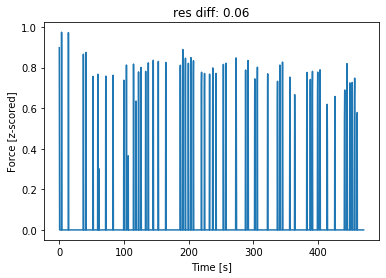

0.06373166666666667


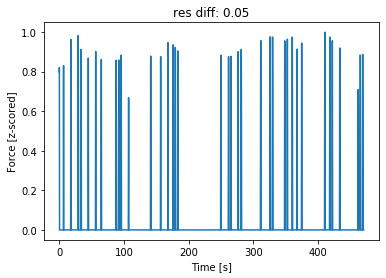

0.04930466666666666


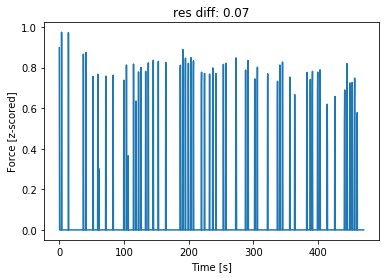

0.19008566666666668


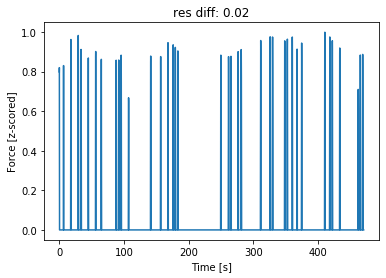

0.04736933333333334


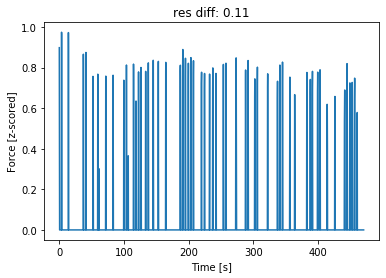

0.20947833333333332


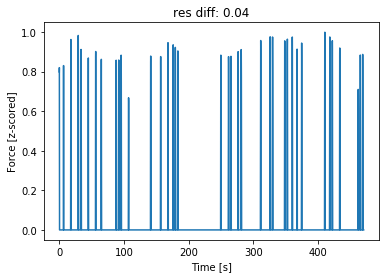

0.021941666666666665


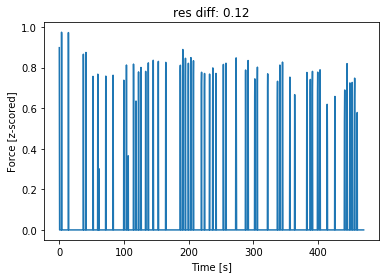

0.308979


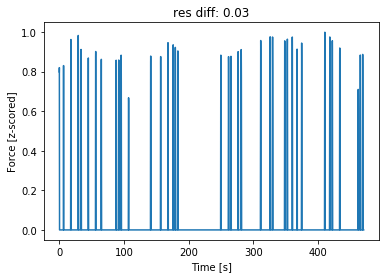

0.08380833333333333


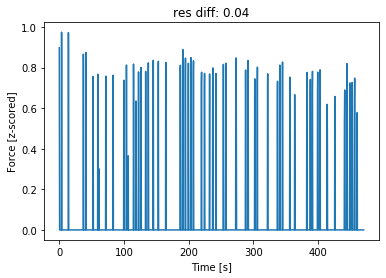

0.4918113333333333


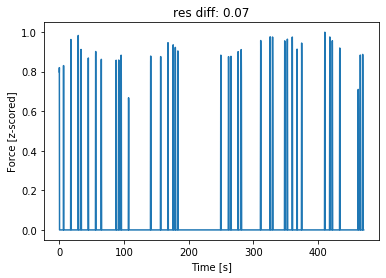

0.05058933333333334


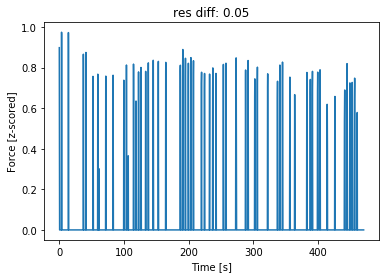

0.525811


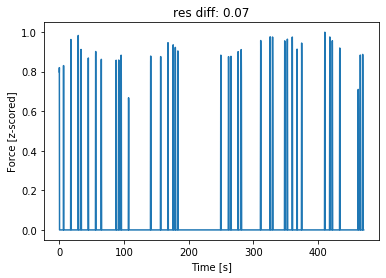

0.005915


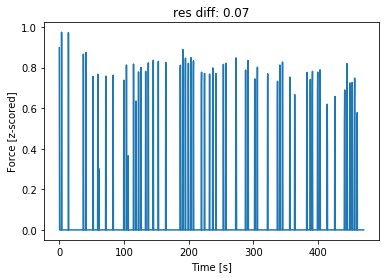

0.30135633333333334


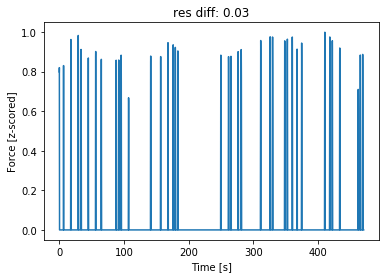

0.039722


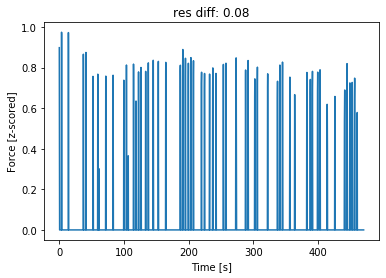

0.024626333333333333


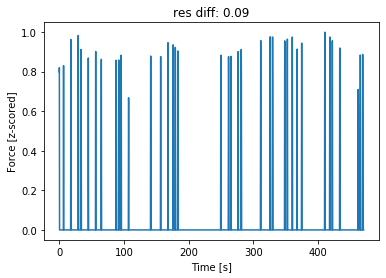

0.028784333333333332


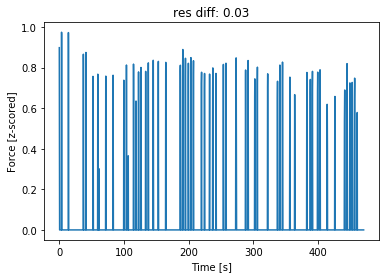

0.04982266666666666


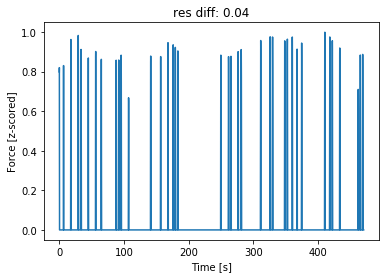

0.049064666666666666


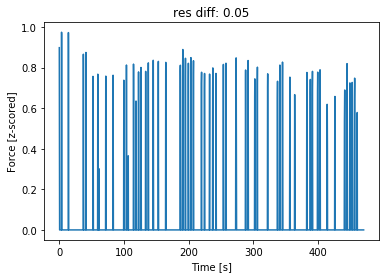

0.0


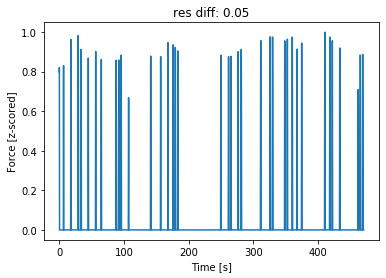

0.06533033333333334


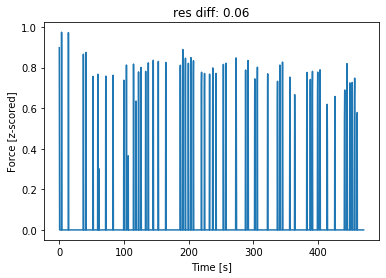

0.0


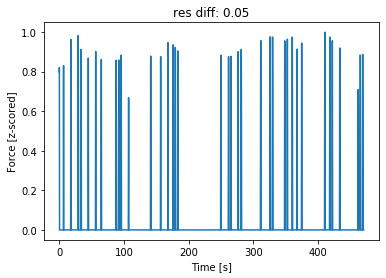

0.037917


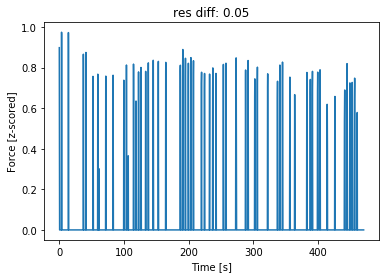

0.0


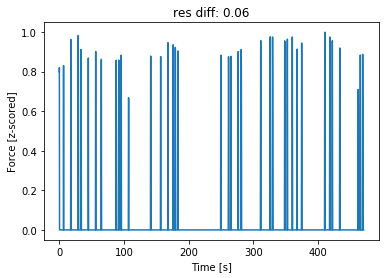

0.021613999999999998


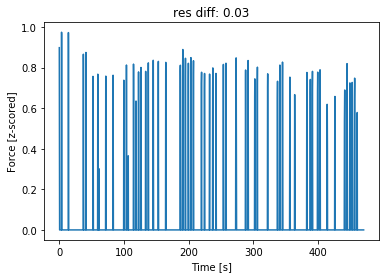

0.012448666666666665


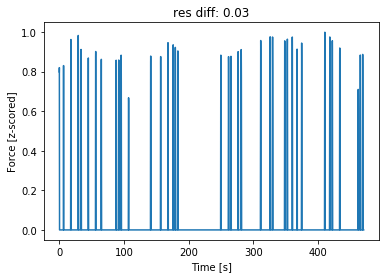

0.040024


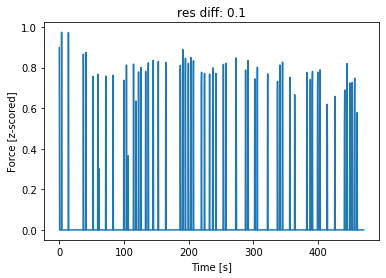

0.137189


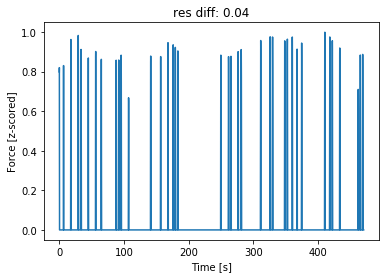

0.002742333333333333


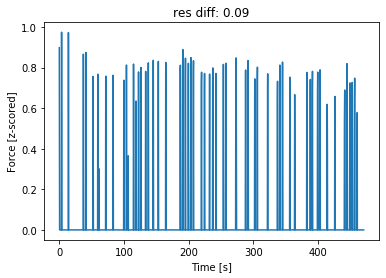

0.07945566666666666


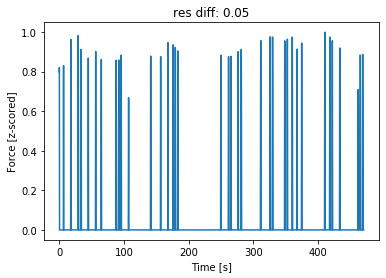

0.006871666666666667


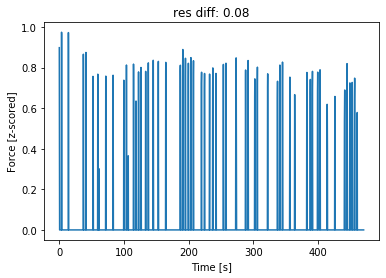

0.231522


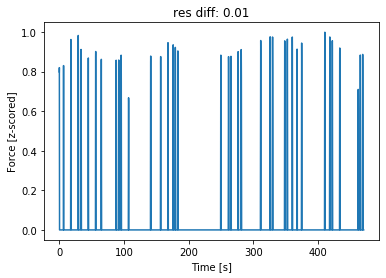

0.049285


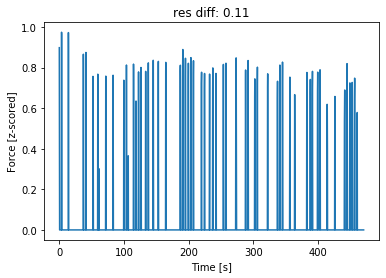

0.34385233333333337


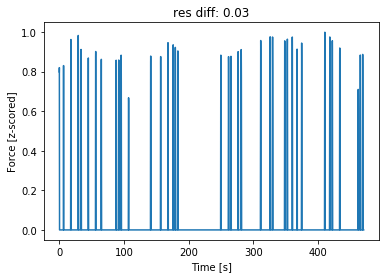

0.009402333333333334


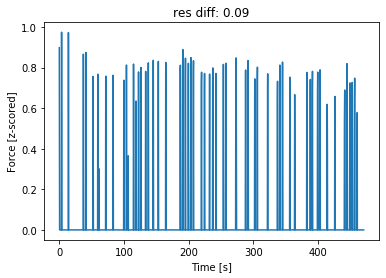

0.267684


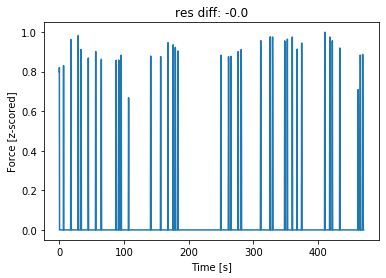

0.09557933333333334


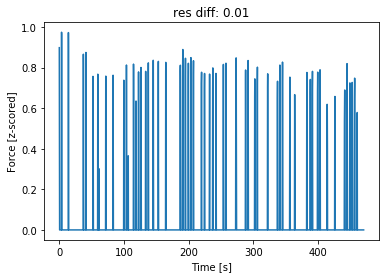

0.4760039999999999


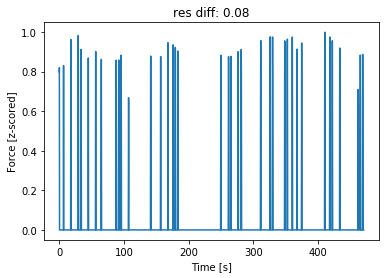

0.05130199999999999


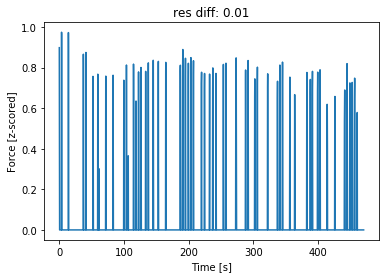

0.42591566666666664


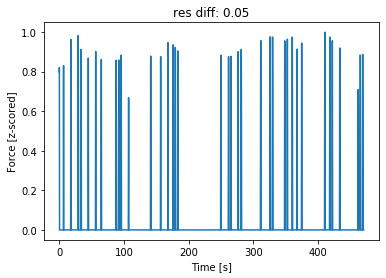

0.03332733333333333


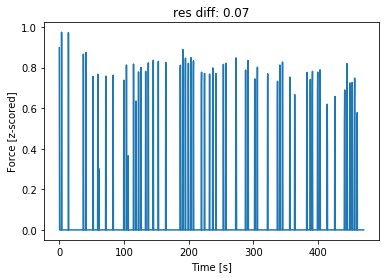

0.3895283333333333


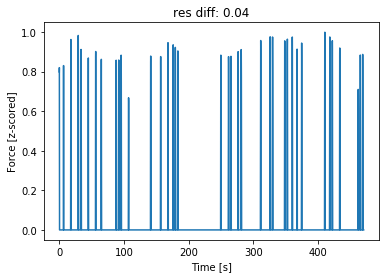

0.064002


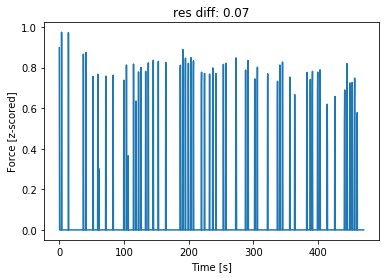

0.029450666666666667


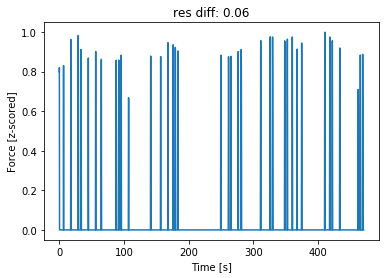

0.04738566666666666


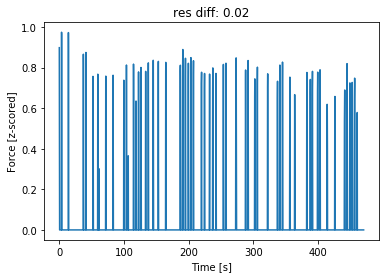

0.042224333333333336


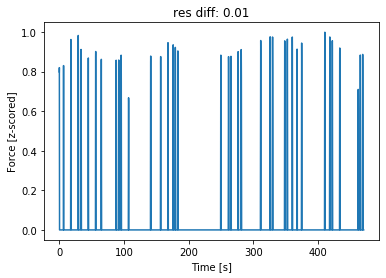

0.11563233333333334


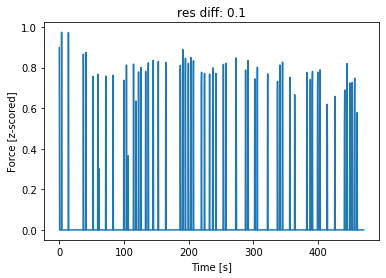

0.027910333333333332


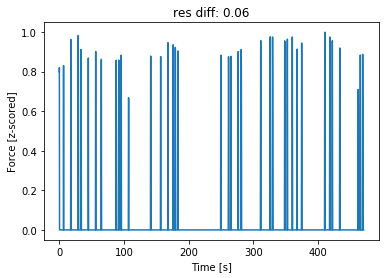

0.05436133333333334


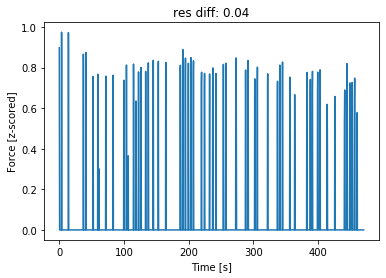

0.027231666666666668


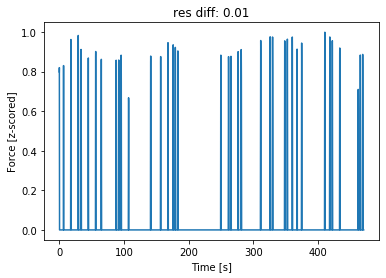

0.029560666666666666


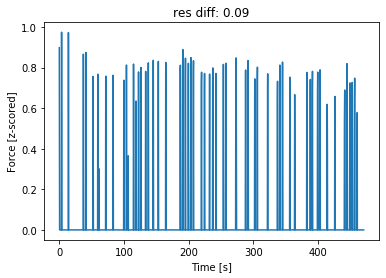

0.004463


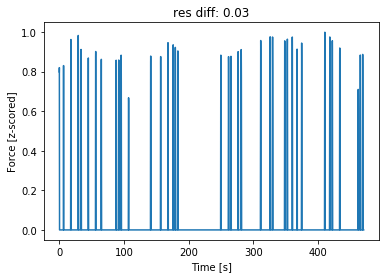

0.0


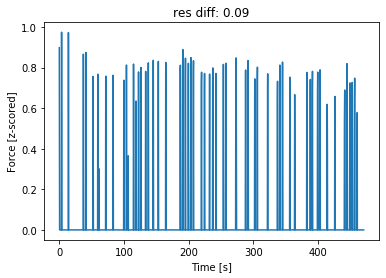

0.0


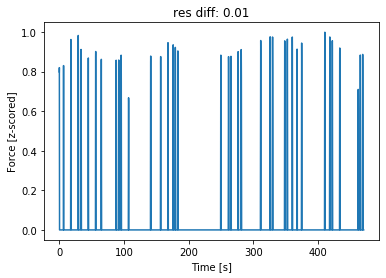

001
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
001
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
004
['ST

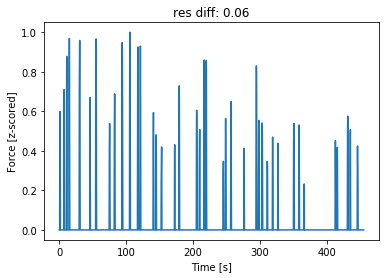

0.005696666666666667


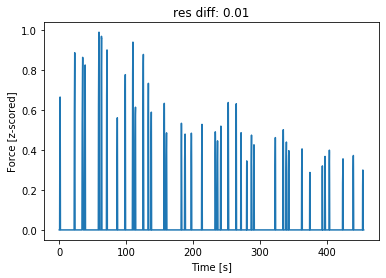

0.02868966666666667


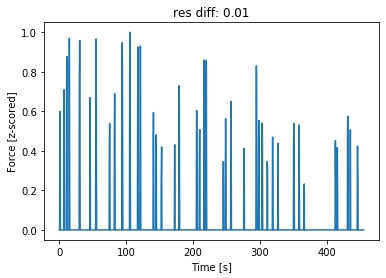

0.035368000000000004


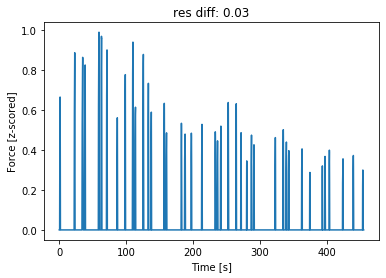

0.010296333333333333


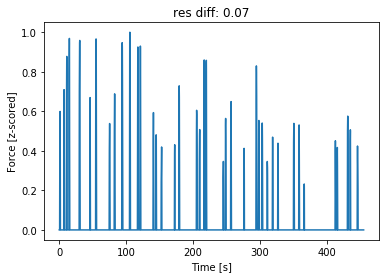

0.07943133333333334


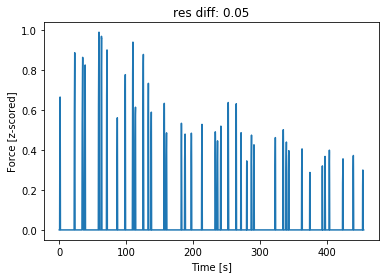

0.03359


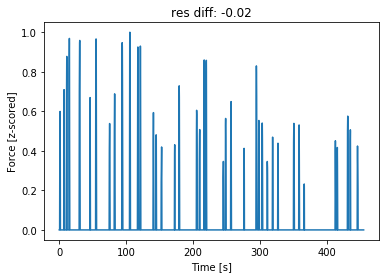

0.16156299999999998


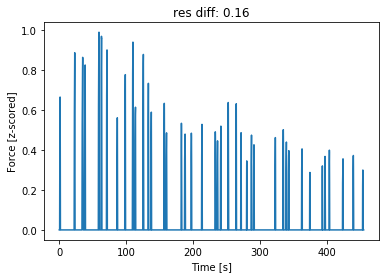

0.014475333333333333


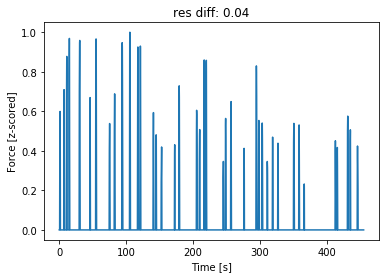

0.07719966666666667


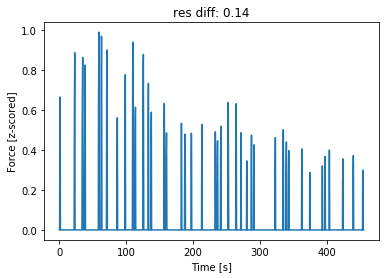

0.024913333333333332


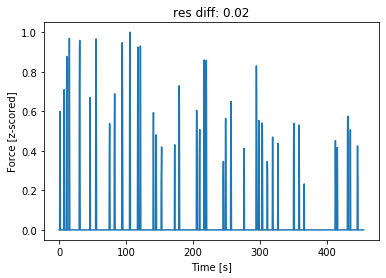

0.12029166666666667


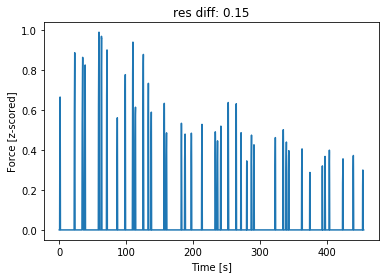

0.013033666666666666


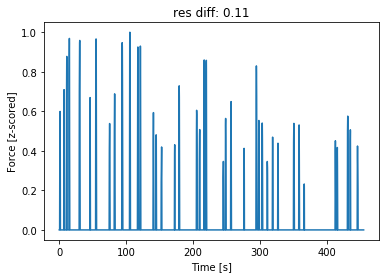

0.09110033333333334


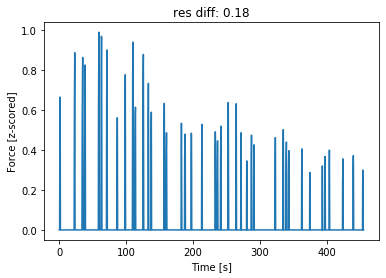

0.013289


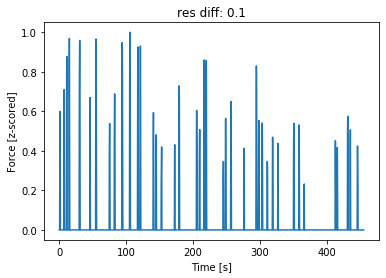

0.159328


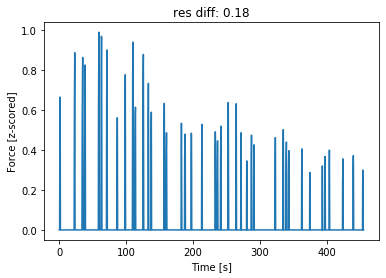

0.011590666666666666


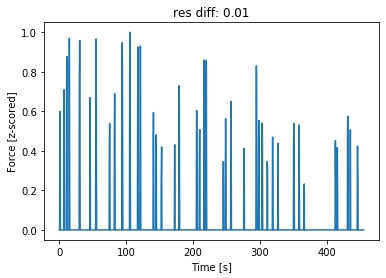

0.08692666666666667


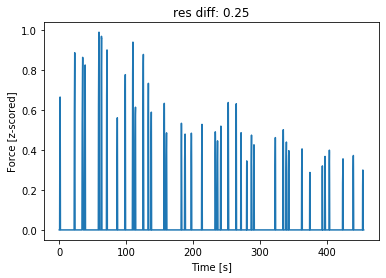

0.03989


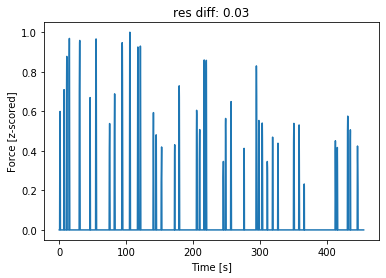

0.203582


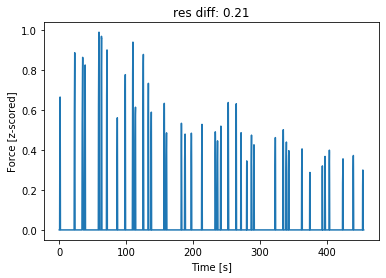

0.022076333333333333


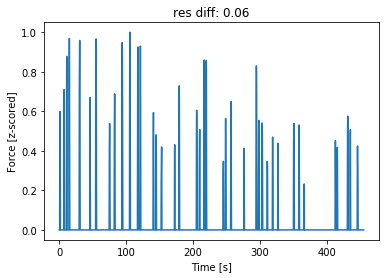

0.037336


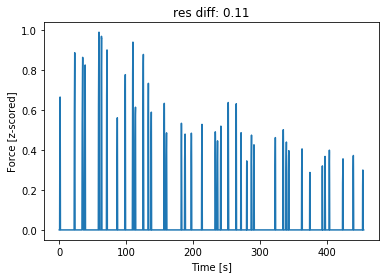

004
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'MOV_RIGHT', 'MOV_LEFT']
004
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.016146999999999998


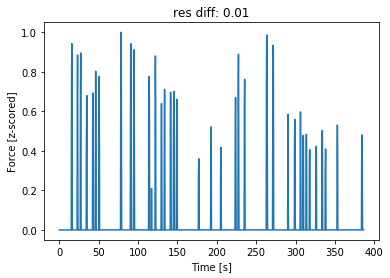

0.0


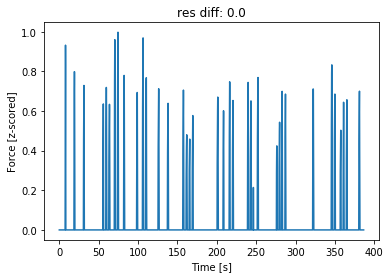

0.011887333333333333


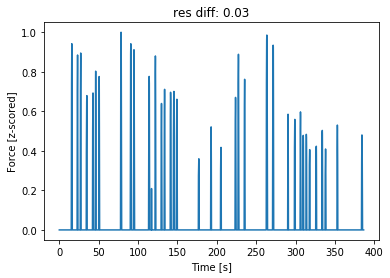

0.023423


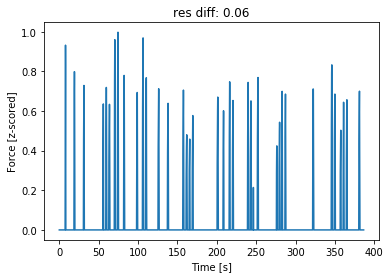

0.217058


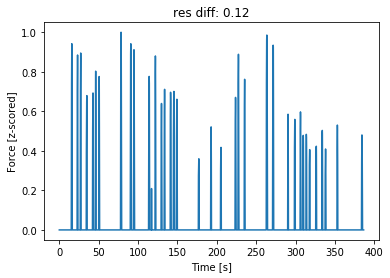

0.035657666666666664


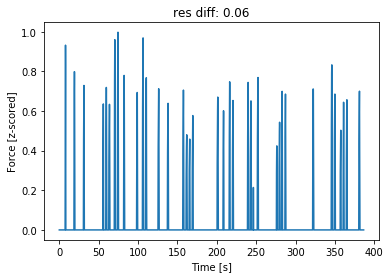

0.120303


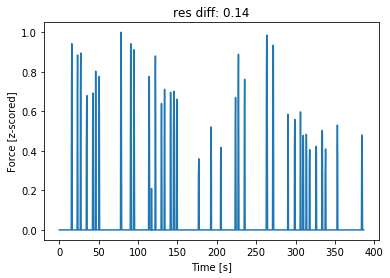

0.002232


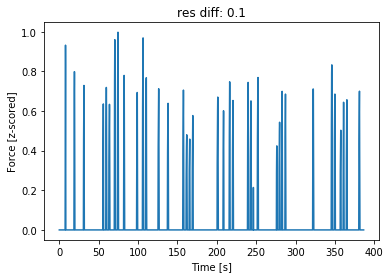

0.195543


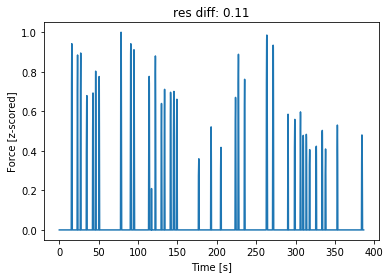

0.055535


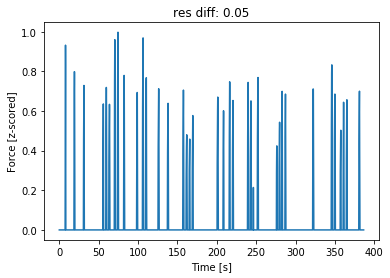

0.06794866666666667


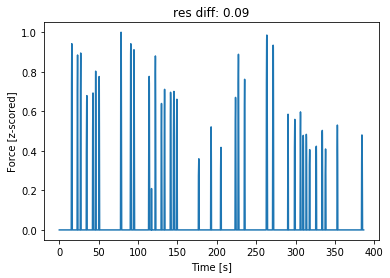

0.0


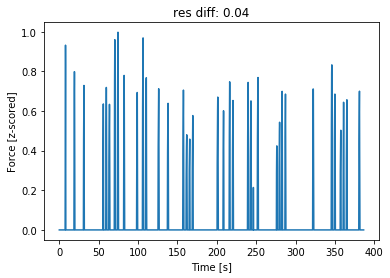

0.283529


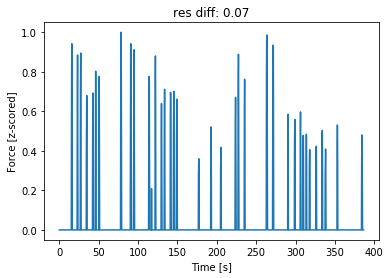

0.007199333333333333


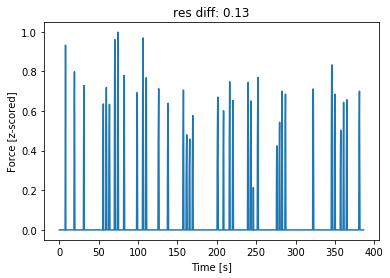

0.255082


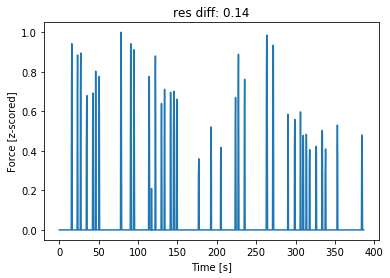

0.131907


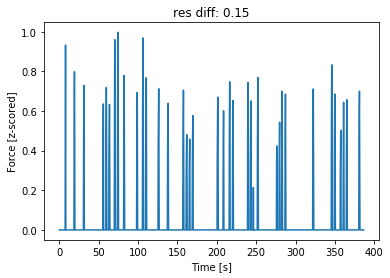

0.35925366666666675


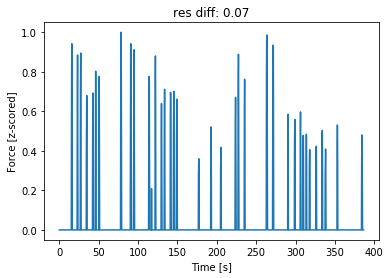

0.147112


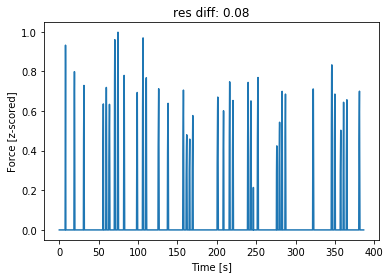

0.026629666666666666


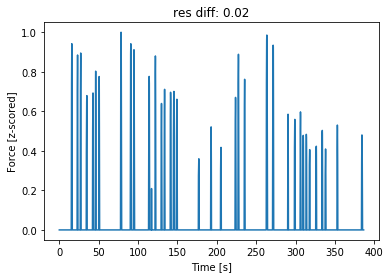

0.007814


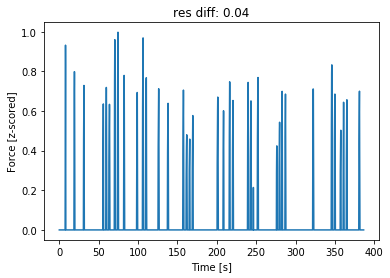

0.015138333333333332


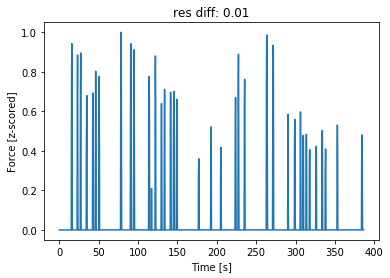

0.0


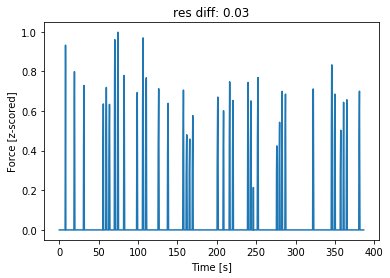

005
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'MOV_RIGHT', 'MOV_LEFT']
005
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.07799466666666667


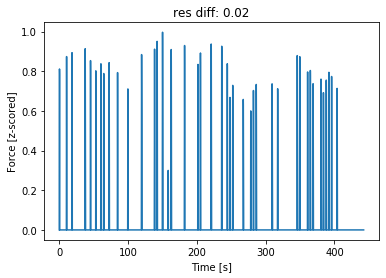

0.013581333333333334


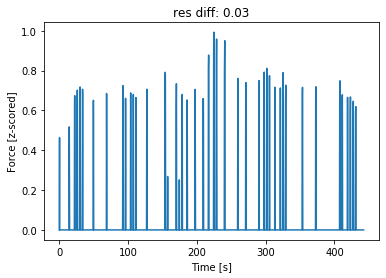

0.031934


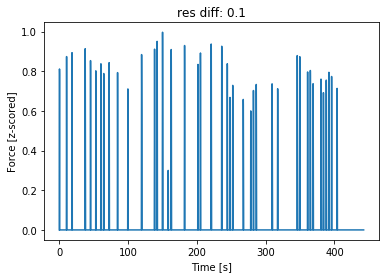

0.017238666666666666


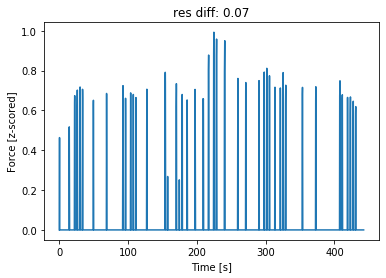

0.059992333333333335


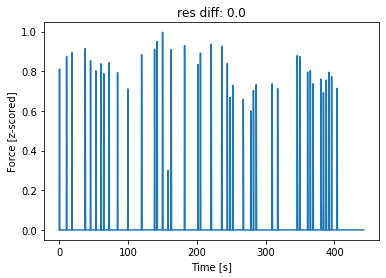

0.0


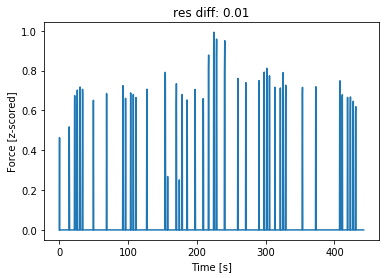

0.04842966666666667


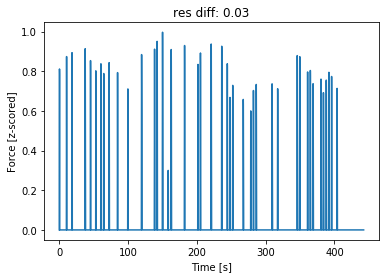

0.0


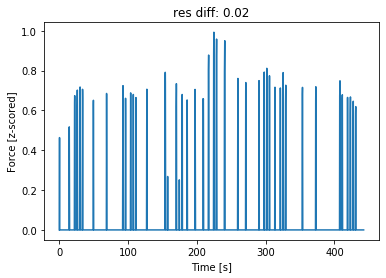

0.02304233333333333


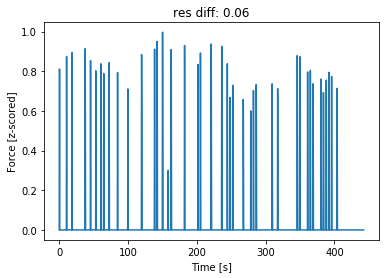

0.0


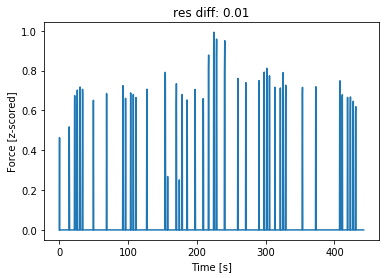

0.008367666666666667


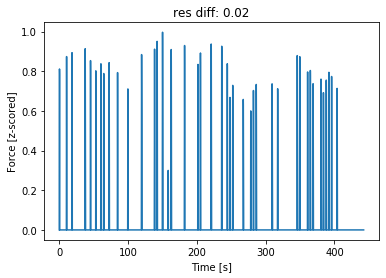

0.0


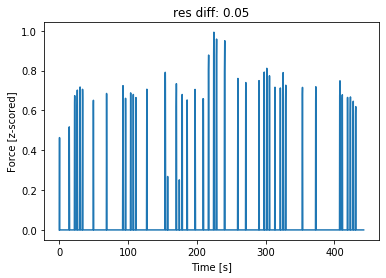

0.013110333333333333


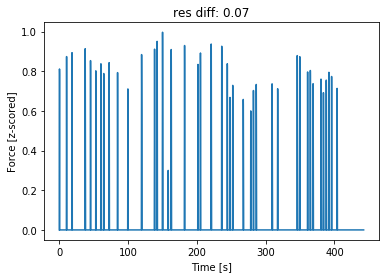

0.0


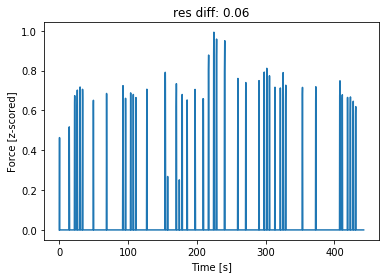

0.028863333333333335


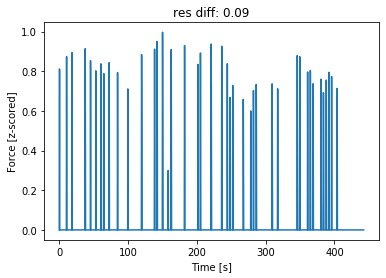

0.016190666666666666


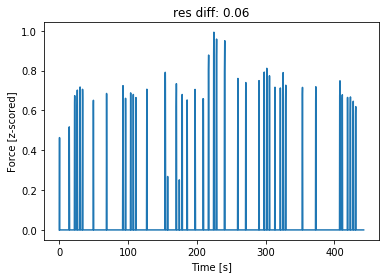

0.24564666666666668


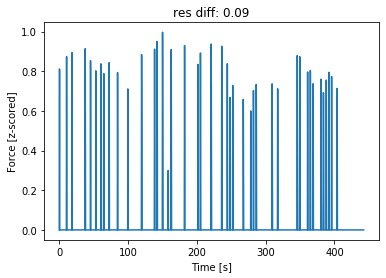

0.09765866666666667


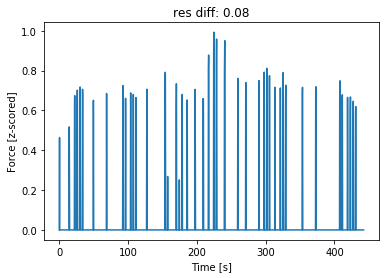

0.23265666666666665


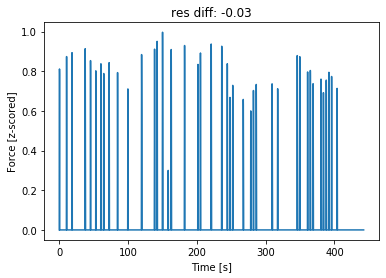

0.07264566666666666


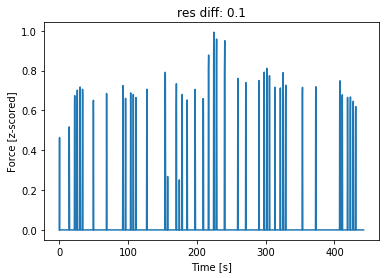

0.005874


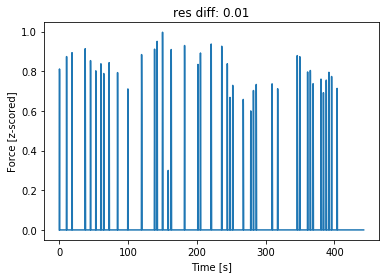

0.004742333333333334


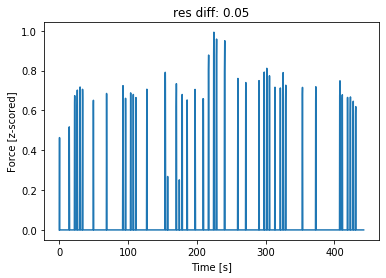

005
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'MOV_RIGHT', 'MOV_LEFT']
005
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'MOV_RIGHT', 'MOV_LEFT']
005
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


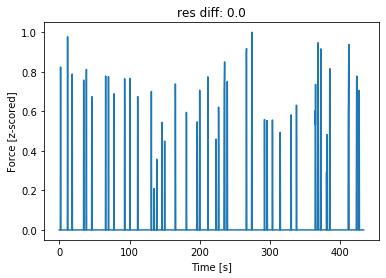

0.036848


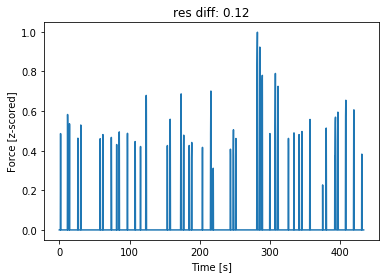

0.0


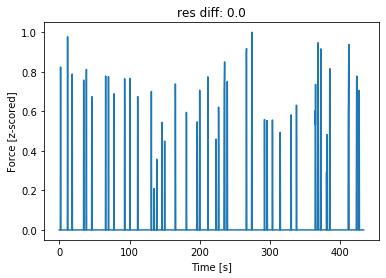

0.0


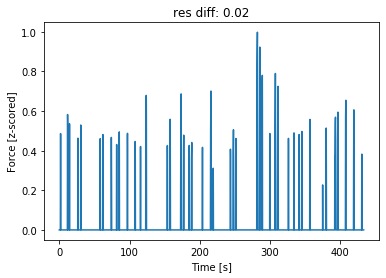

0.0


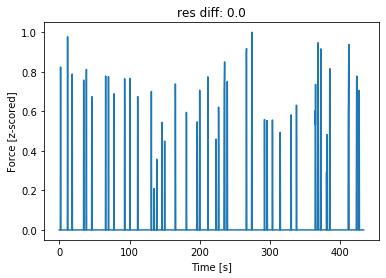

0.004489666666666667


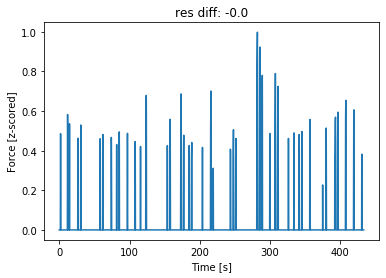

0.0


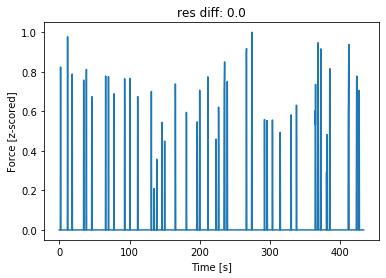

0.02600066666666667


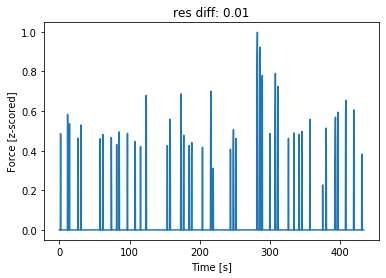

0.0


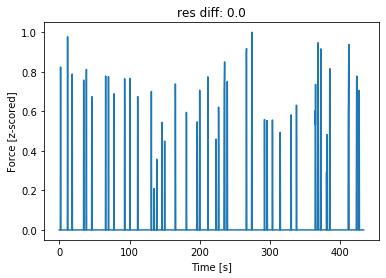

0.018989


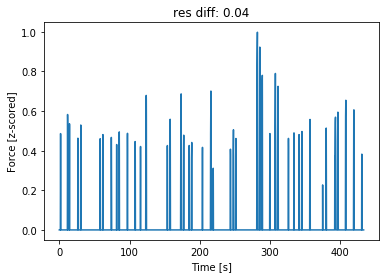

0.0


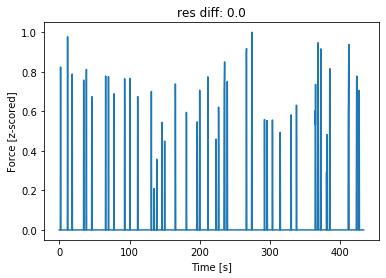

0.006399666666666667


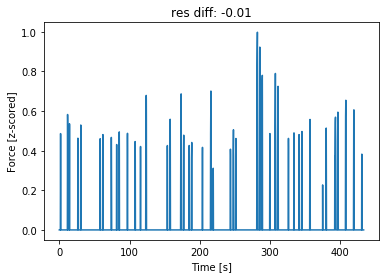

0.0


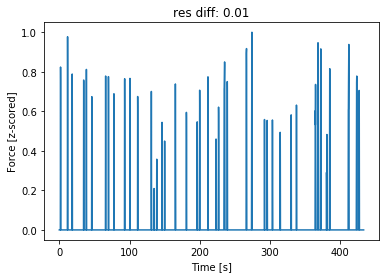

0.014725333333333333


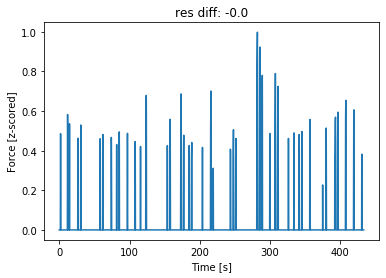

0.0


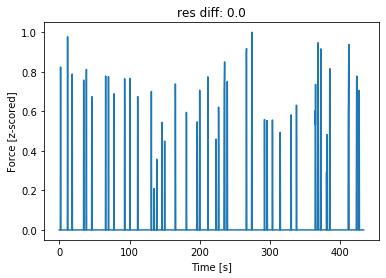

0.0


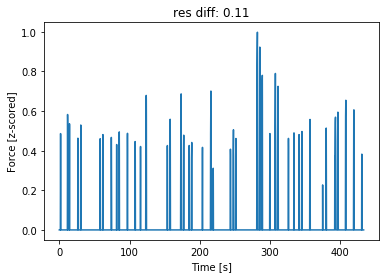

0.0


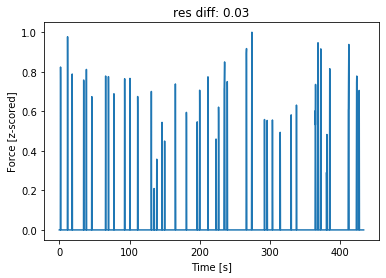

0.025125333333333333


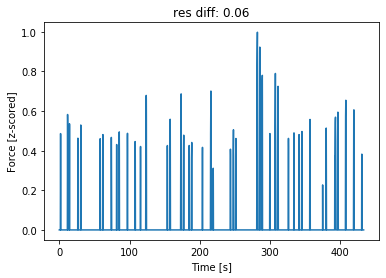

0.0


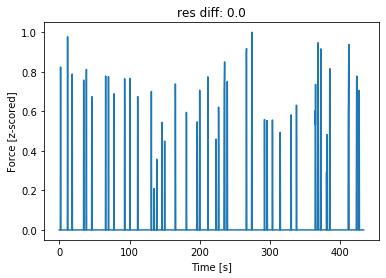

0.0


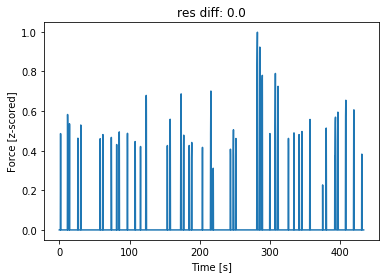

0.0


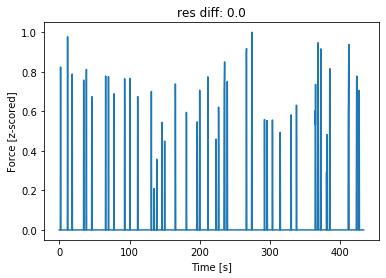

0.0


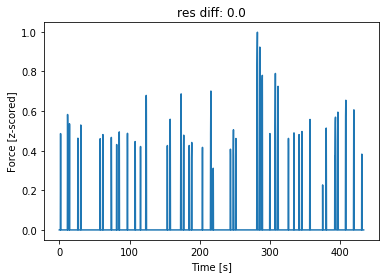

006
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'ECOG_LEFT_8', 'ECOG_LEFT_9', 'ECOG_LEFT_10', 'ECOG_LEFT_11', 'ECOG_LEFT_12', 'ECOG_LEFT_13', 'ECOG_LEFT_14', 'ECOG_LEFT_15', 'ECOG_LEFT_16', 'ECOG_LEFT_17', 'ECOG_LEFT_18', 'ECOG_LEFT_19', 'ECOG_LEFT_20', 'ECOG_LEFT_21', 'ECOG_LEFT_22', 'ECOG_LEFT_23', 'ECOG_LEFT_24', 'ECOG_LEFT_25', 'ECOG_LEFT_26', 'ECOG_LEFT_27', 'ECOG_LEFT_28', 'ECOG_LEFT_29', 'ECOG_LEFT_30', 'ECOG_LEFT_31', 'ECOG_LEFT_32', 'ECOG_LEFT_33', 'ECOG_LEFT_34', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


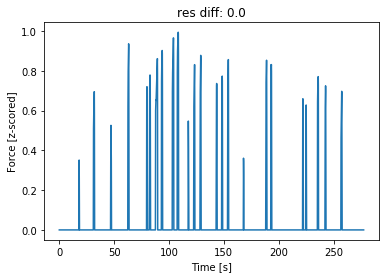

0.0


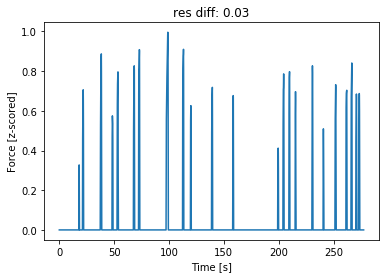

0.029036000000000003


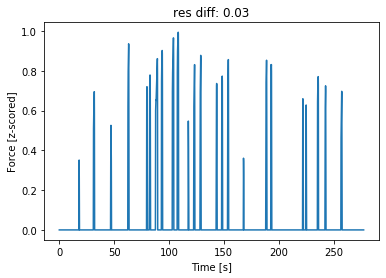

0.05923133333333333


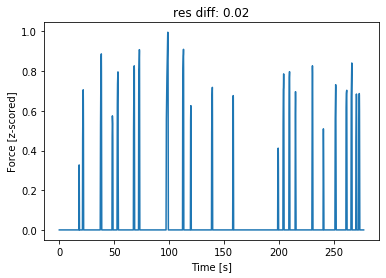

0.0


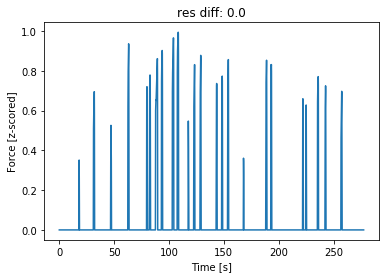

0.003577


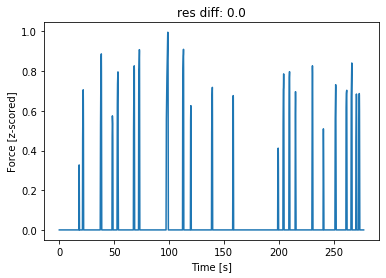

0.0


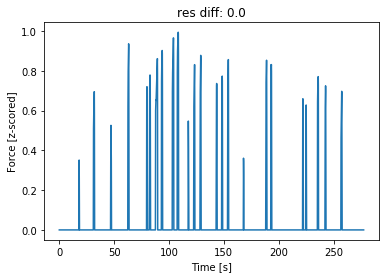

0.0


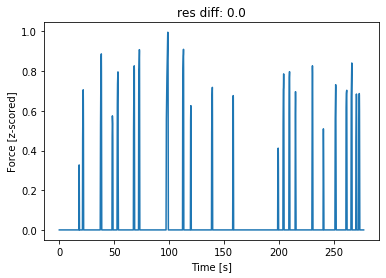

0.0


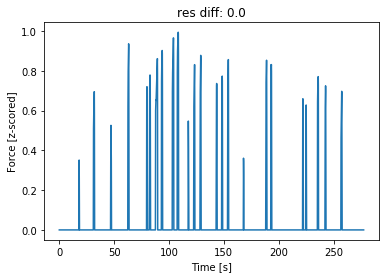

0.0


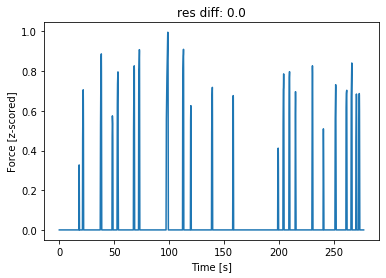

0.0


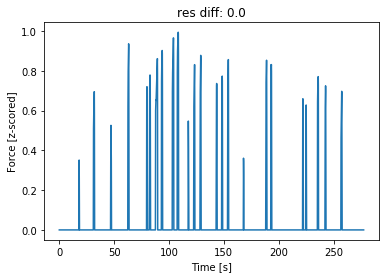

0.0


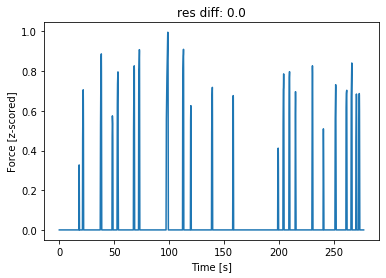

0.0


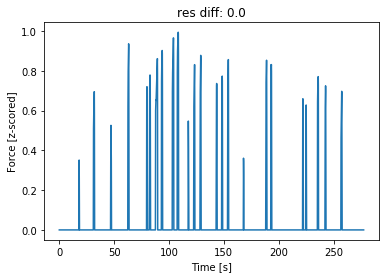

0.0


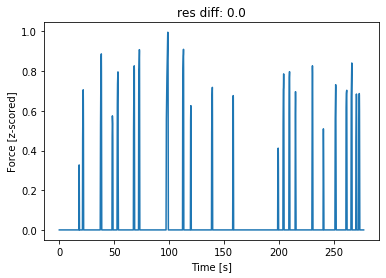

0.0


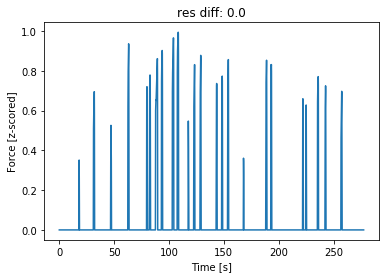

0.0


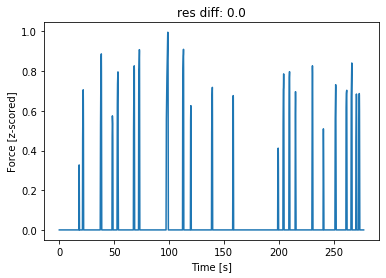

0.0


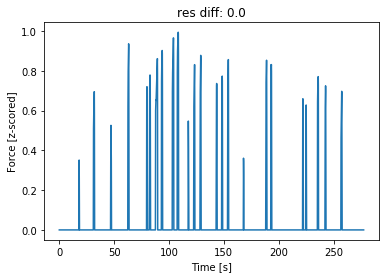

0.0


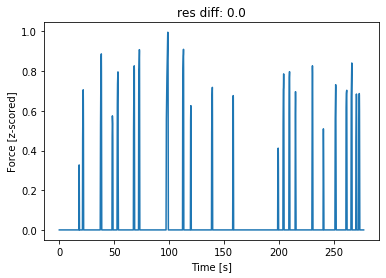

0.0


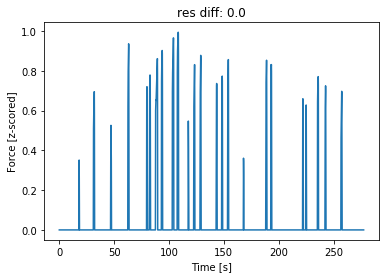

0.0


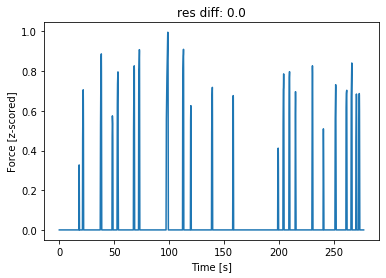

0.005555333333333333


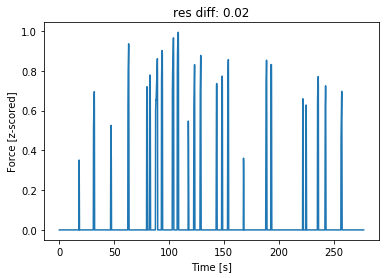

0.14870966666666666


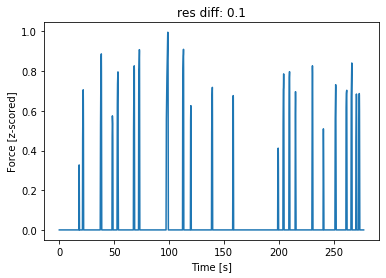

0.0


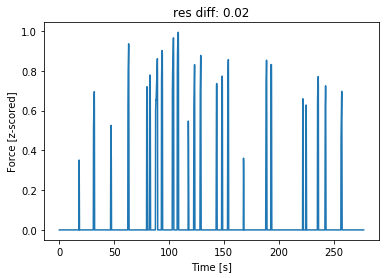

0.16989633333333332


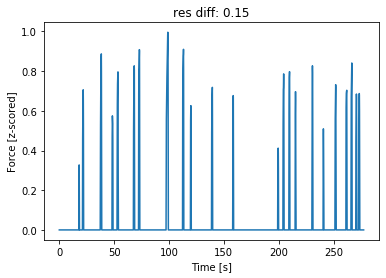

0.0


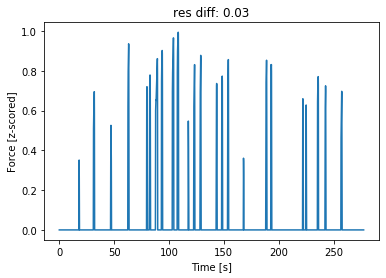

0.03928533333333333


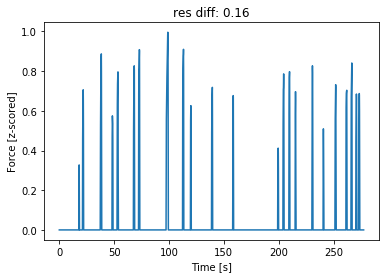

0.0


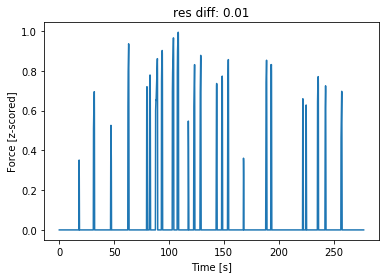

0.003842


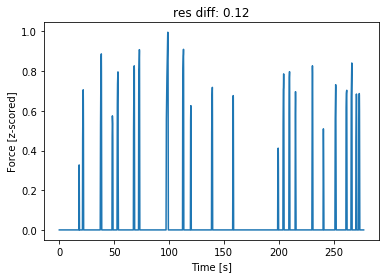

0.0


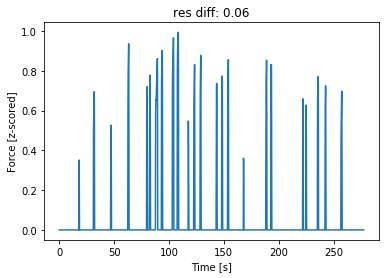

0.015053333333333333


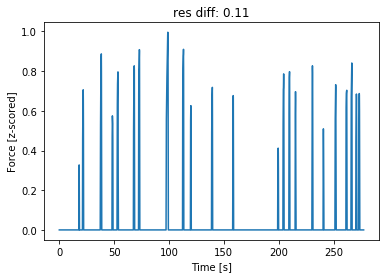

0.0


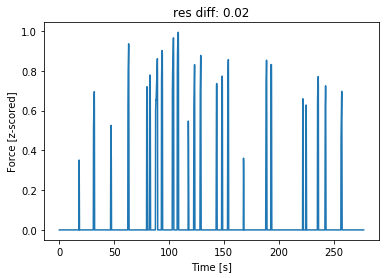

0.047323000000000004


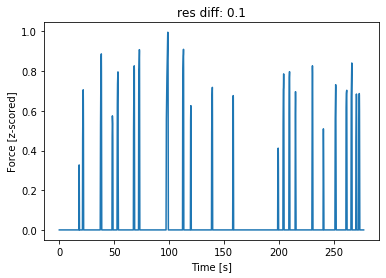

0.0


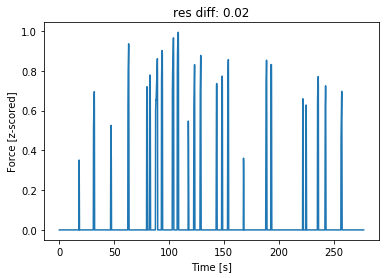

0.06733633333333333


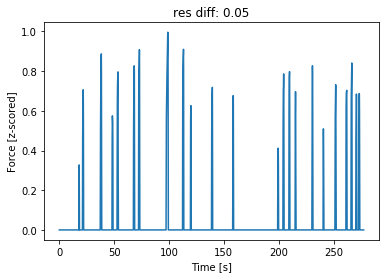

0.0


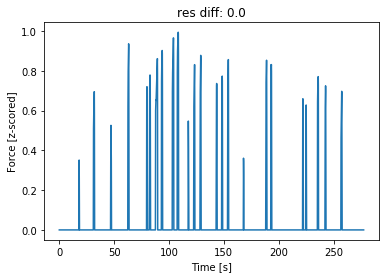

0.0


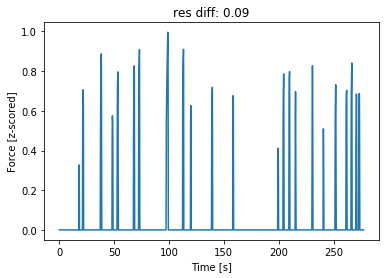

0.0


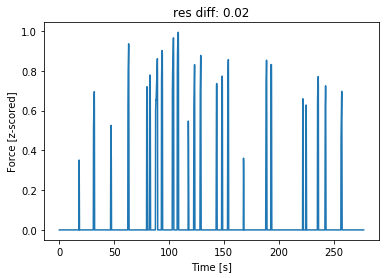

0.0


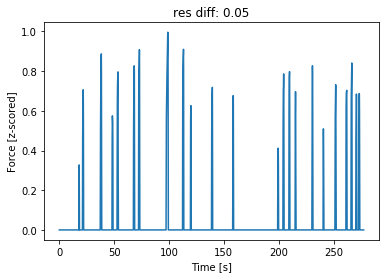

0.0


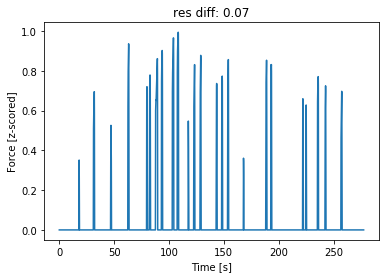

0.0


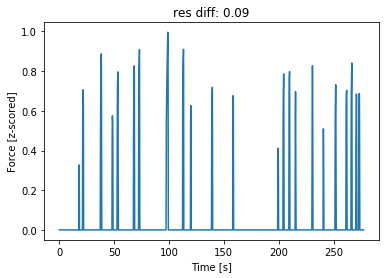

0.0


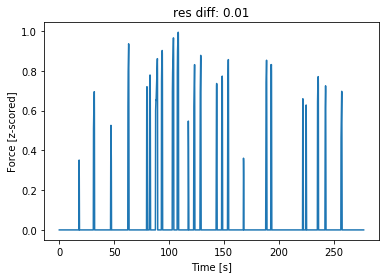

0.001386666666666667


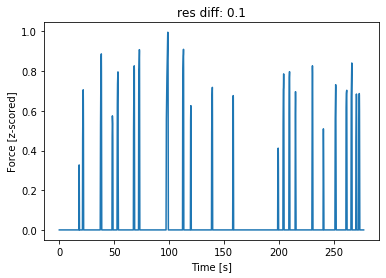

0.0


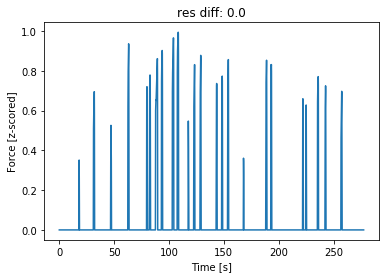

0.12837066666666666


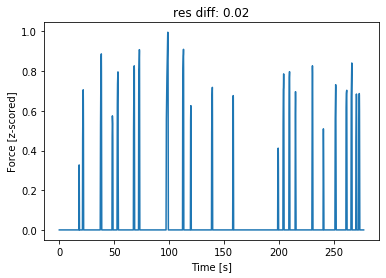

0.0


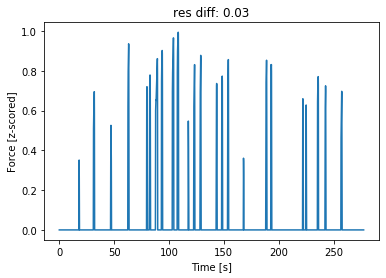

0.06692066666666667


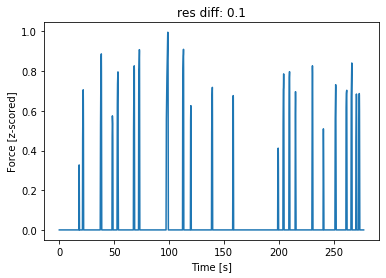

0.0


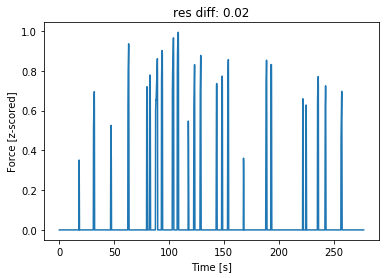

0.0076493333333333335


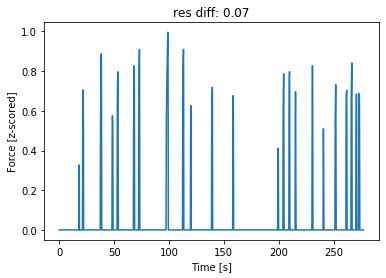

0.0


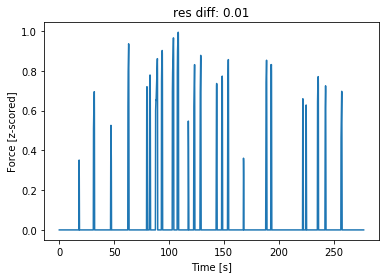

0.027128666666666666


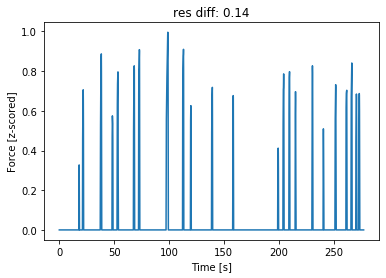

0.0


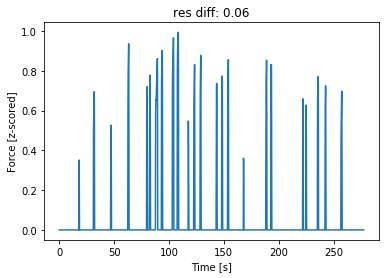

0.04887466666666666


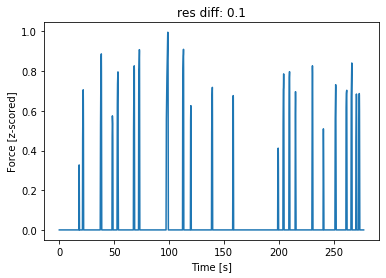

0.0


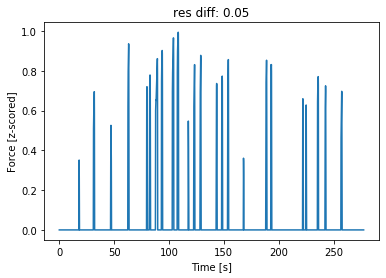

0.069019


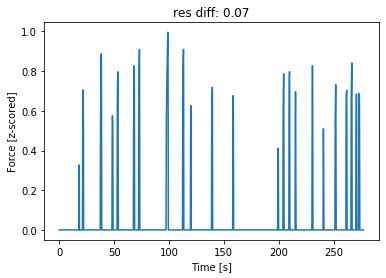

0.0


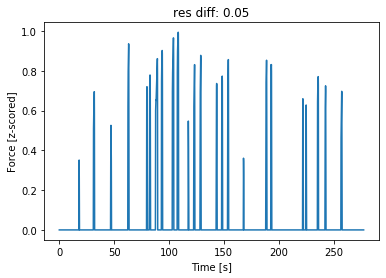

0.24593433333333334


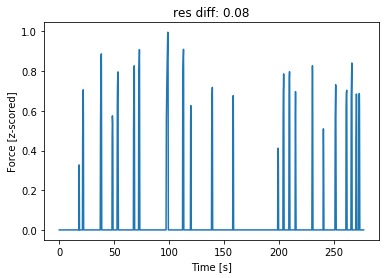

0.0


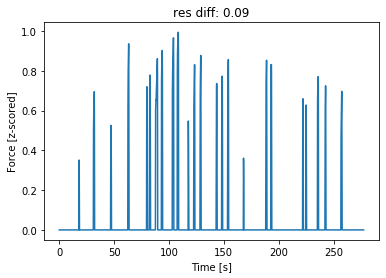

0.5141693333333334


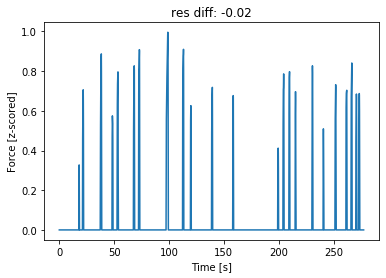

0.0


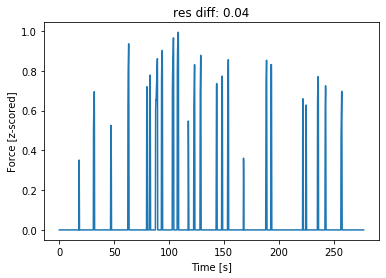

0.38470066666666664


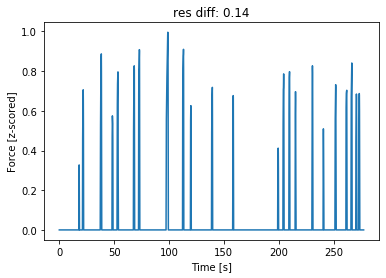

0.0


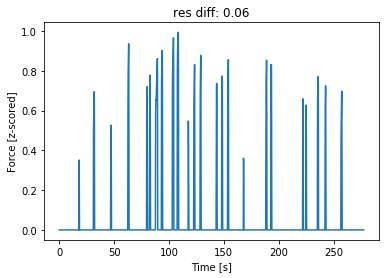

0.16587933333333335


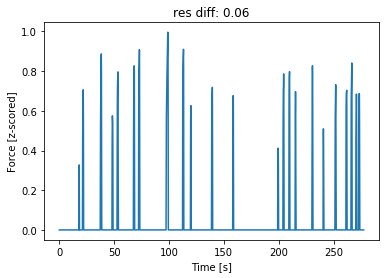

0.0


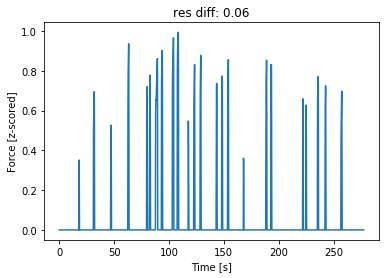

0.04218533333333333


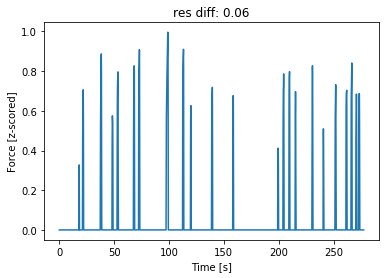

0.0


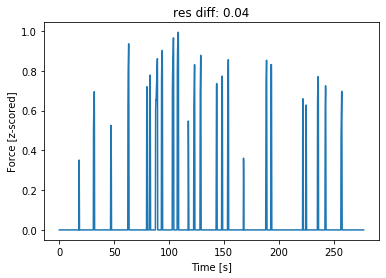

0.0


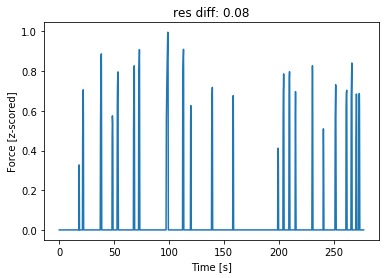

0.0


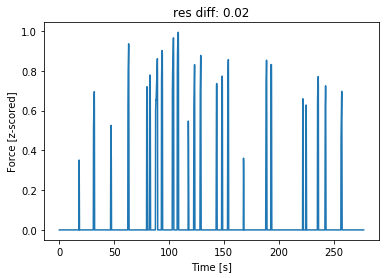

0.0


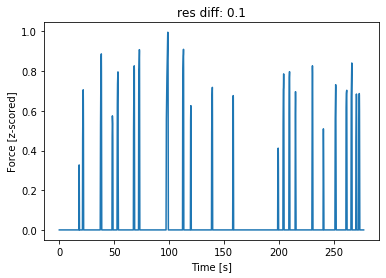

0.0009956666666666666


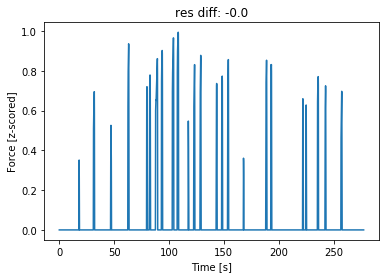

0.026239


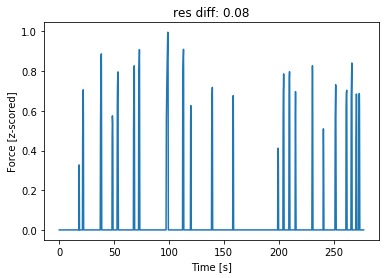

0.0


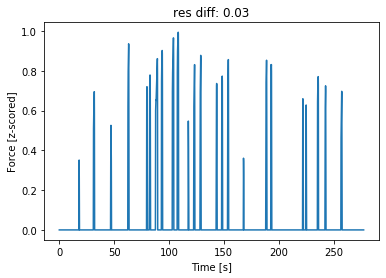

0.07200433333333334


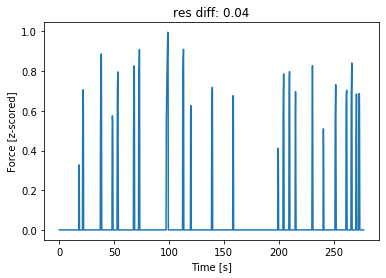

0.0


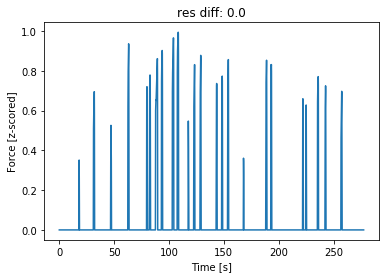

0.05583833333333333


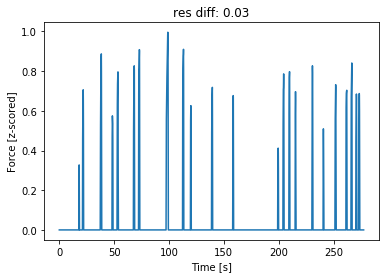

0.0


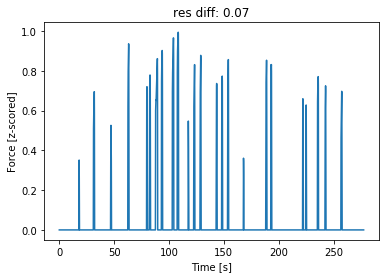

0.0005546666666666666


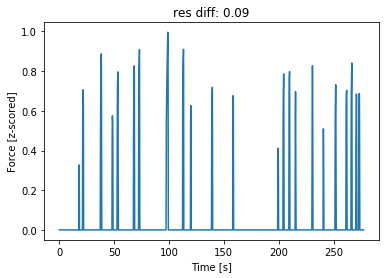

006
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'ECOG_LEFT_8', 'ECOG_LEFT_9', 'ECOG_LEFT_10', 'ECOG_LEFT_11', 'ECOG_LEFT_12', 'ECOG_LEFT_13', 'ECOG_LEFT_14', 'ECOG_LEFT_15', 'ECOG_LEFT_16', 'ECOG_LEFT_17', 'ECOG_LEFT_18', 'ECOG_LEFT_19', 'ECOG_LEFT_20', 'ECOG_LEFT_21', 'ECOG_LEFT_22', 'ECOG_LEFT_23', 'ECOG_LEFT_24', 'ECOG_LEFT_25', 'ECOG_LEFT_26', 'ECOG_LEFT_27', 'ECOG_LEFT_28', 'ECOG_LEFT_29', 'ECOG_LEFT_30', 'ECOG_LEFT_31', 'ECOG_LEFT_32', 'ECOG_LEFT_33', 'ECOG_LEFT_34', 'ECOG_LEFT_35', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.043560999999999996


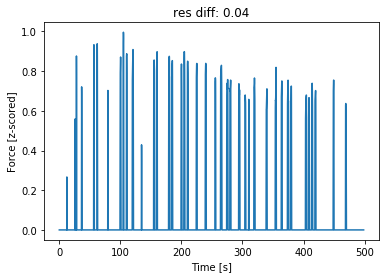

0.012663


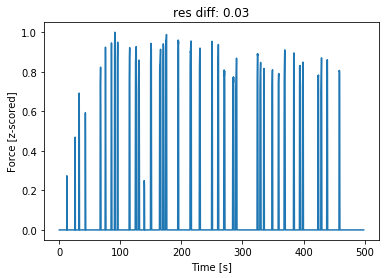

0.009587


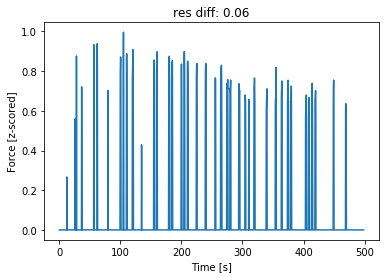

0.0


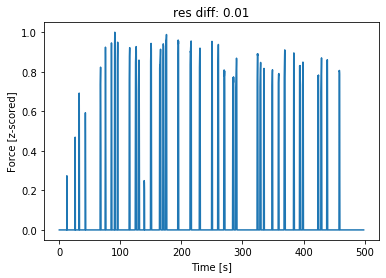

0.020718


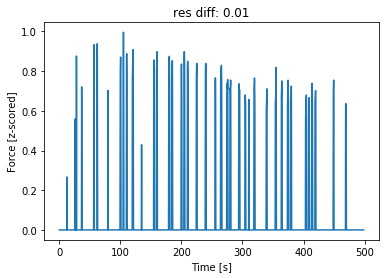

0.0


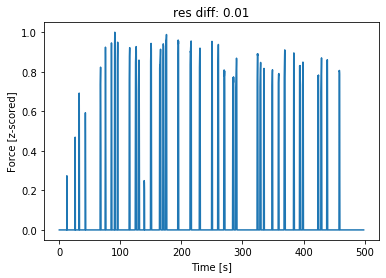

0.0


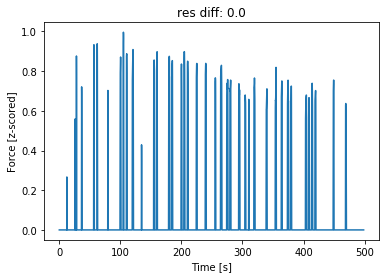

0.0


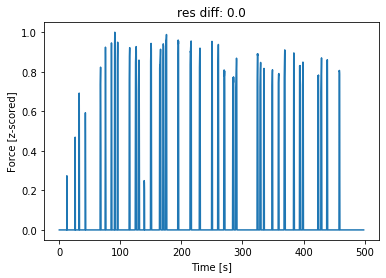

0.0


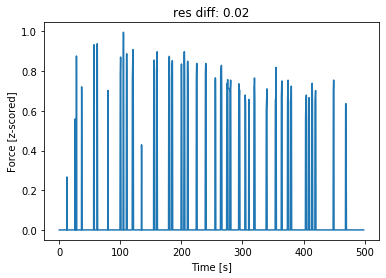

0.0


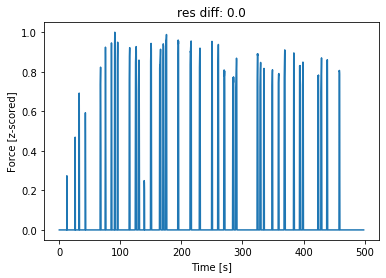

0.0


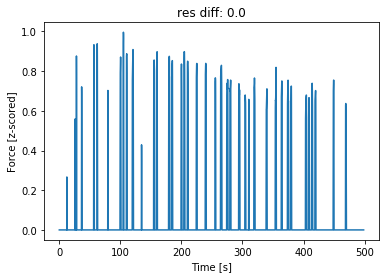

0.0


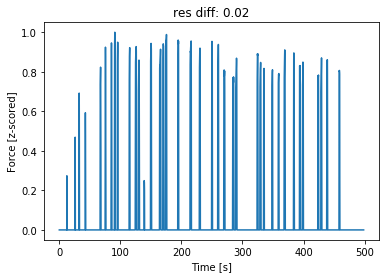

0.0


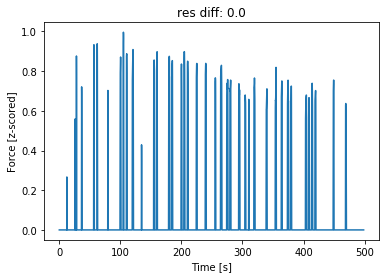

0.0


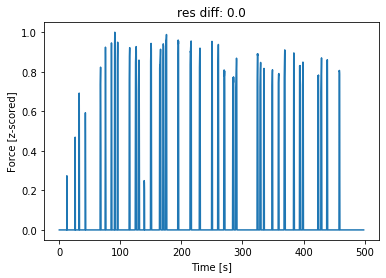

0.0


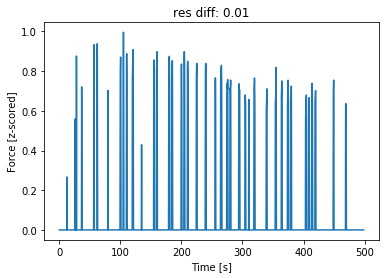

0.0


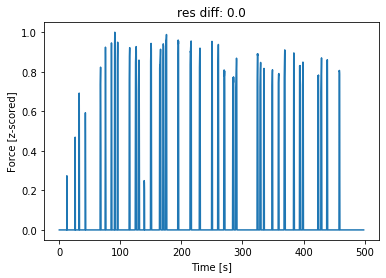

0.0


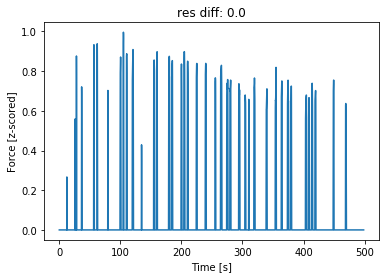

0.0


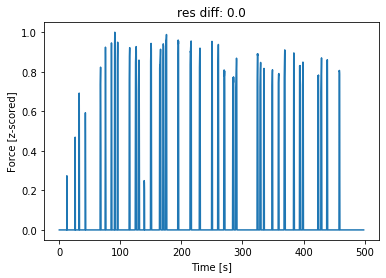

0.0


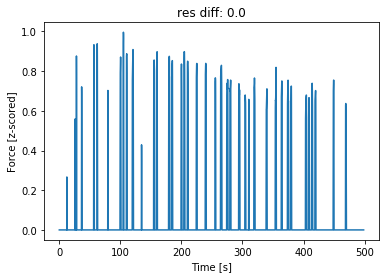

0.0


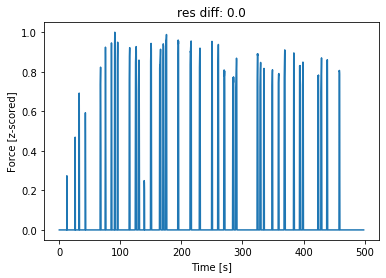

0.0


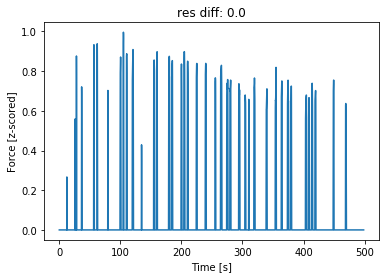

0.0


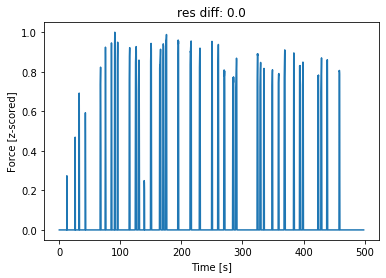

0.03965966666666667


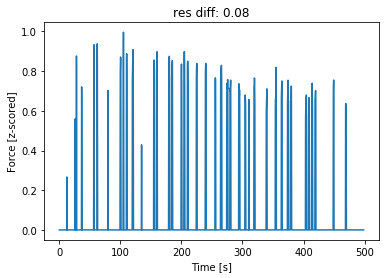

0.023980666666666667


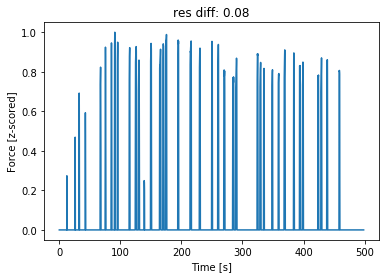

0.04862966666666666


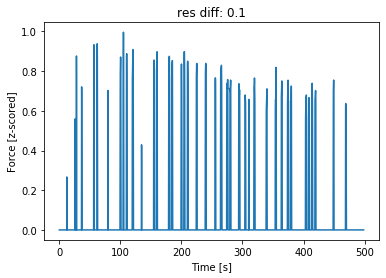

0.03300366666666666


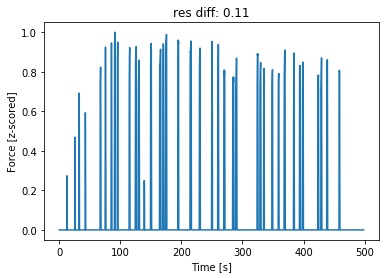

0.028967666666666666


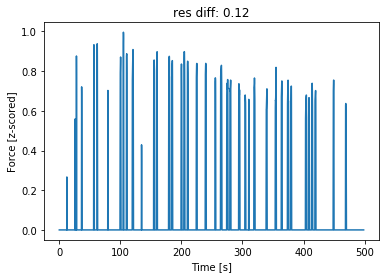

0.060703


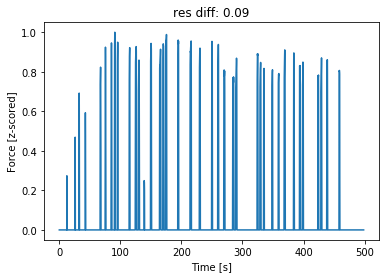

0.06259466666666667


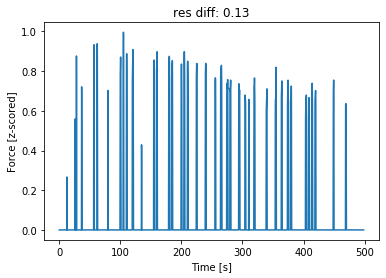

0.04615266666666667


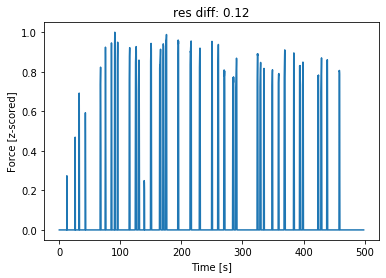

0.096728


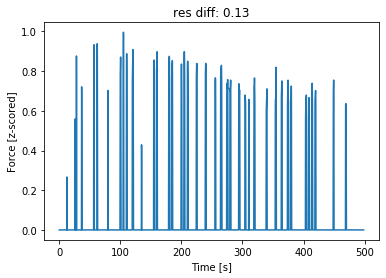

0.03589633333333333


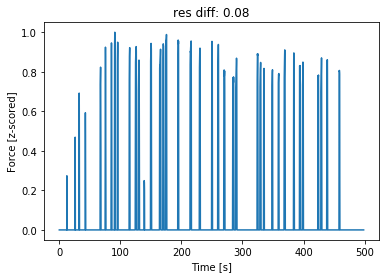

0.160751


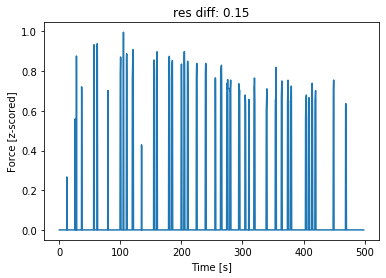

0.07397733333333333


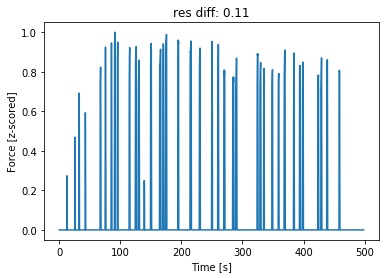

0.19533266666666668


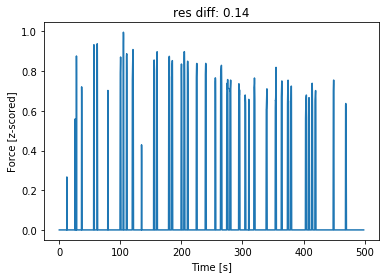

0.06079366666666667


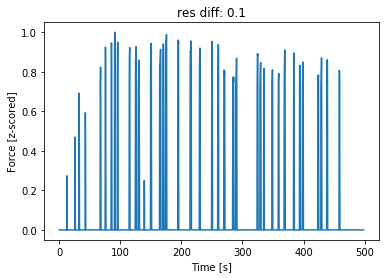

0.09145666666666667


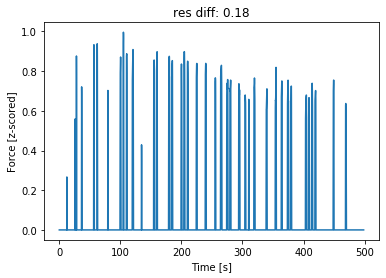

0.019319666666666666


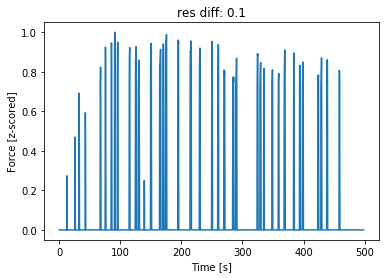

0.20800566666666667


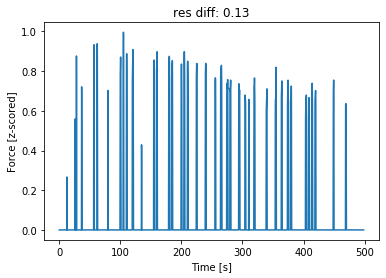

0.012872333333333333


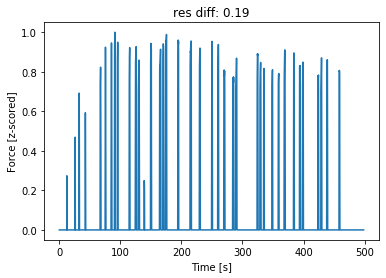

0.138692


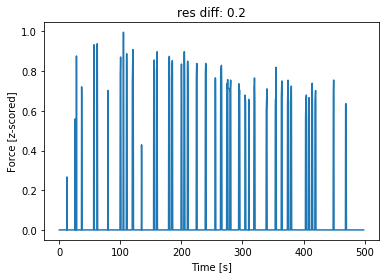

0.026767666666666665


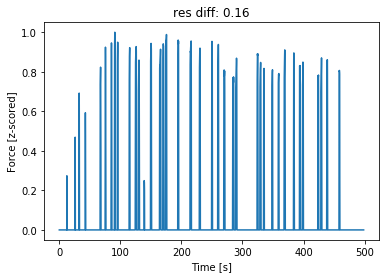

0.12960266666666667


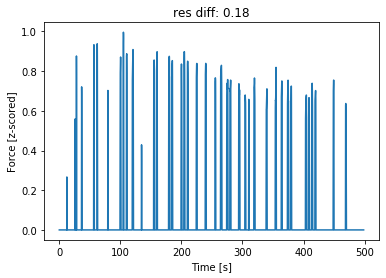

0.019987666666666667


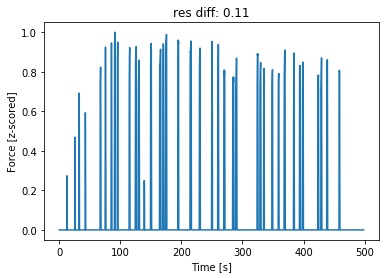

0.18302366666666667


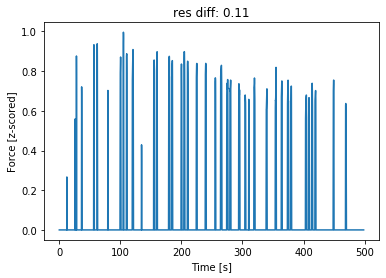

0.013235333333333333


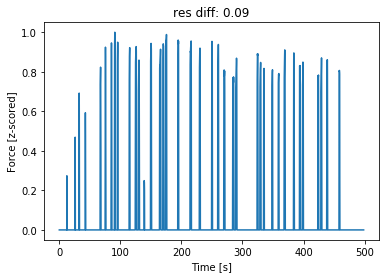

0.058333666666666666


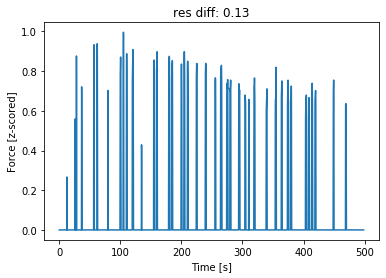

0.008041333333333333


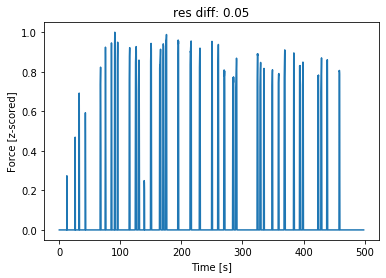

0.03282366666666667


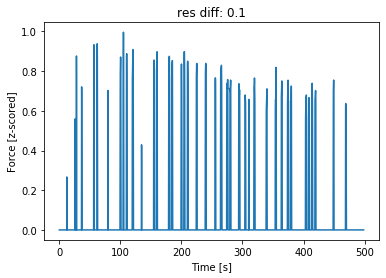

0.006532


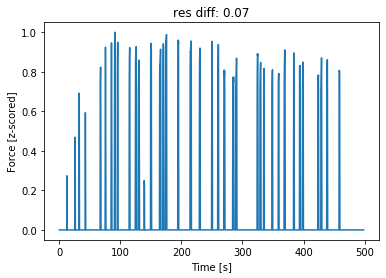

0.02643733333333333


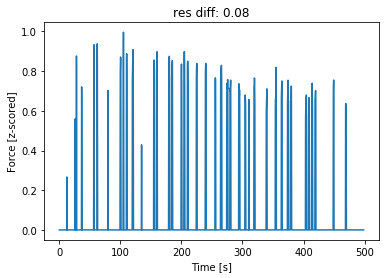

0.002524666666666667


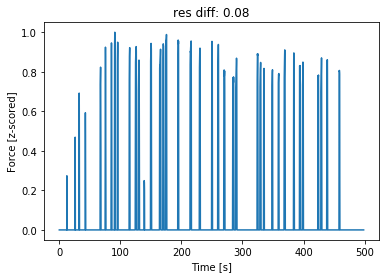

0.040322000000000004


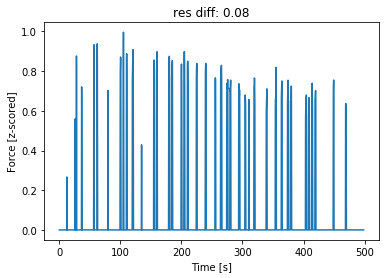

0.0


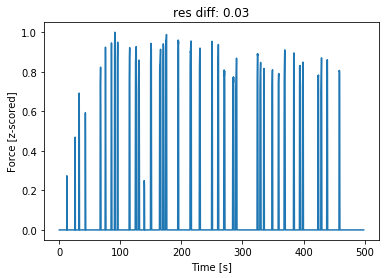

0.020448


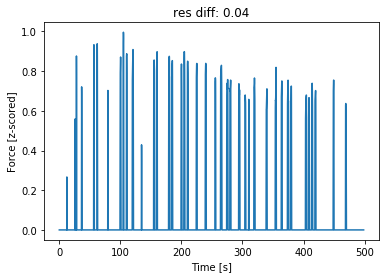

0.0


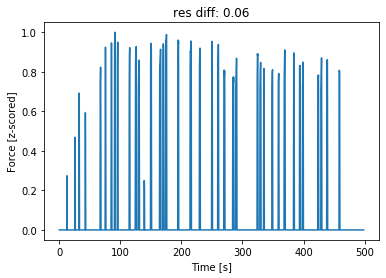

0.06162599999999999


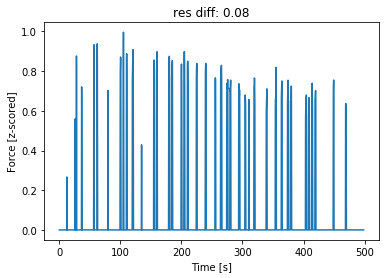

0.0029846666666666667


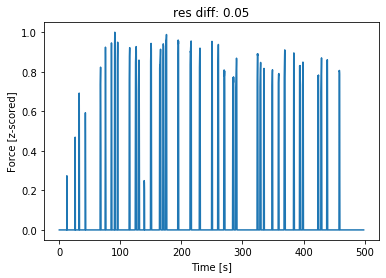

0.11334499999999999


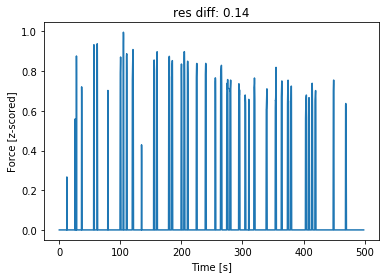

0.03392033333333334


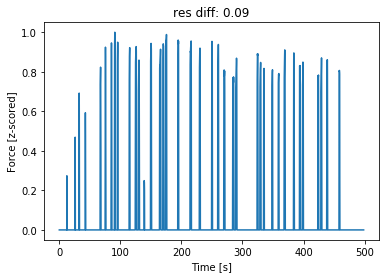

0.15432333333333334


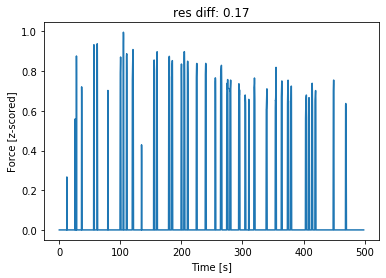

0.027627333333333334


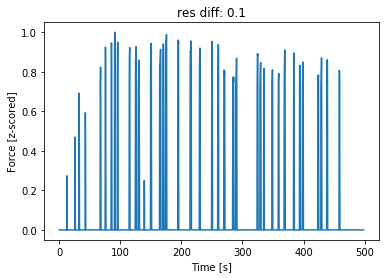

0.251987


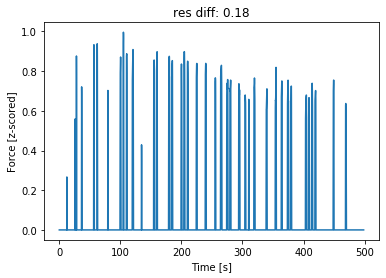

0.038336


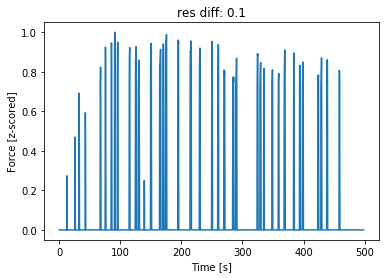

0.2785676666666666


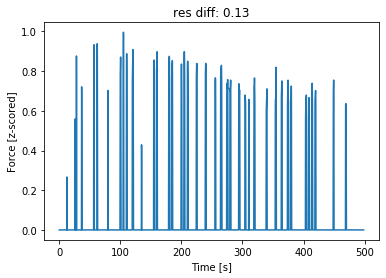

0.04102733333333334


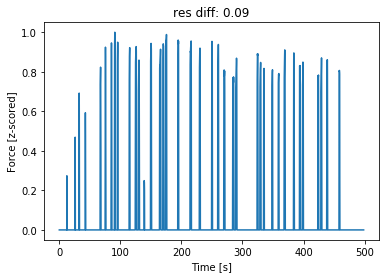

0.06941366666666667


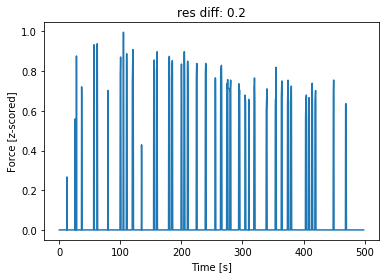

0.022579333333333337


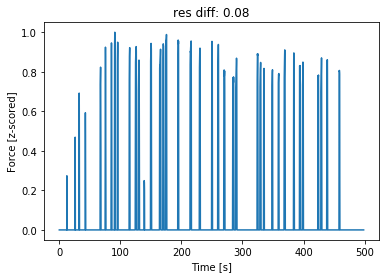

0.143858


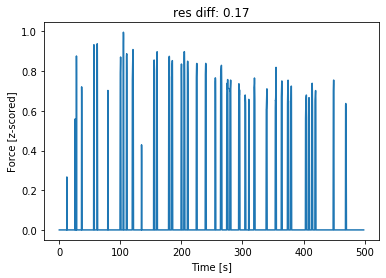

0.11753733333333333


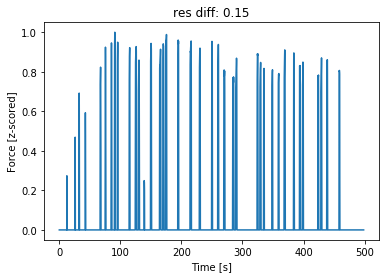

0.11664533333333332


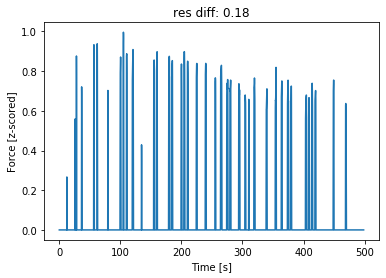

0.08224533333333334


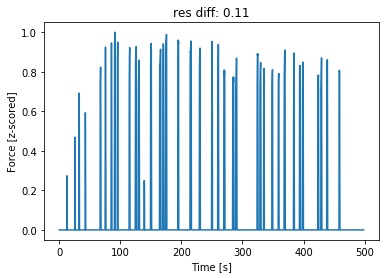

0.134732


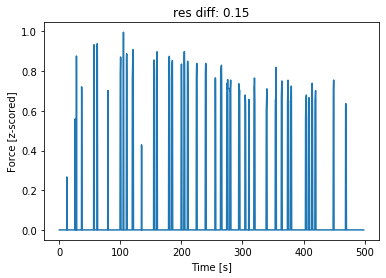

0.030727333333333332


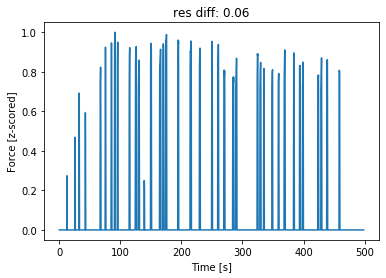

0.154949


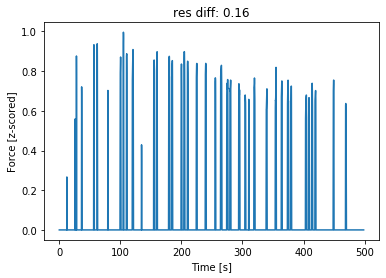

0.0


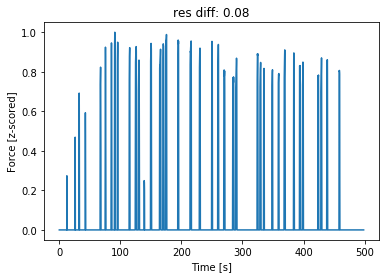

0.06308333333333334


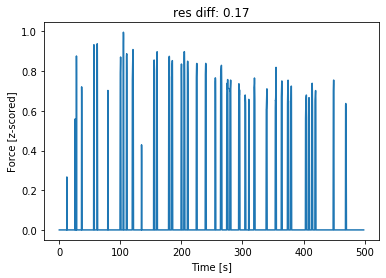

0.008419666666666667


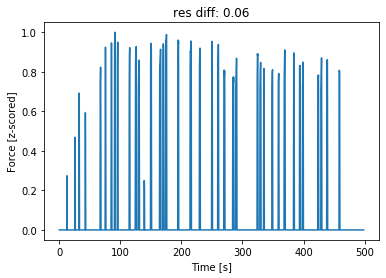

006
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'ECOG_LEFT_6', 'ECOG_LEFT_7', 'ECOG_LEFT_8', 'ECOG_LEFT_9', 'ECOG_LEFT_10', 'ECOG_LEFT_11', 'ECOG_LEFT_12', 'ECOG_LEFT_13', 'ECOG_LEFT_14', 'ECOG_LEFT_15', 'ECOG_LEFT_16', 'ECOG_LEFT_17', 'ECOG_LEFT_18', 'ECOG_LEFT_19', 'ECOG_LEFT_20', 'ECOG_LEFT_21', 'ECOG_LEFT_22', 'ECOG_LEFT_23', 'ECOG_LEFT_24', 'ECOG_LEFT_25', 'ECOG_LEFT_26', 'ECOG_LEFT_27', 'ECOG_LEFT_28', 'ECOG_LEFT_29', 'ECOG_LEFT_30', 'ECOG_LEFT_31', 'ECOG_LEFT_32', 'ECOG_LEFT_33', 'ECOG_LEFT_34', 'ECOG_LEFT_35', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


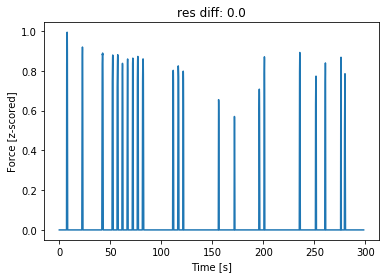

0.0


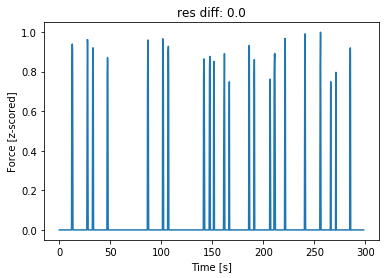

0.0


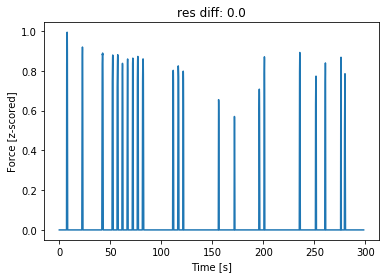

0.0


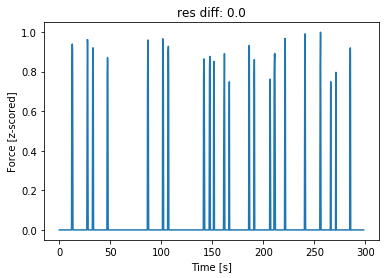

0.0


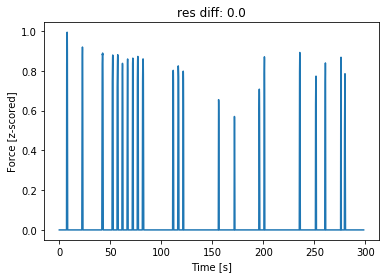

0.0


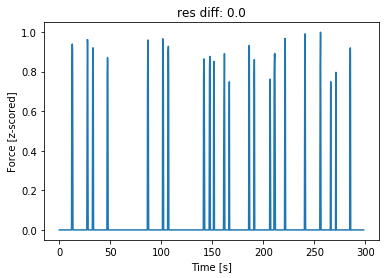

0.0


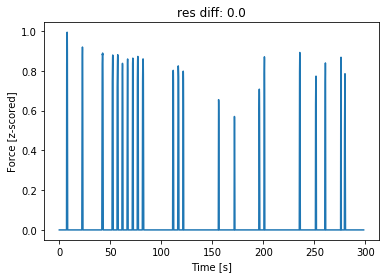

0.0


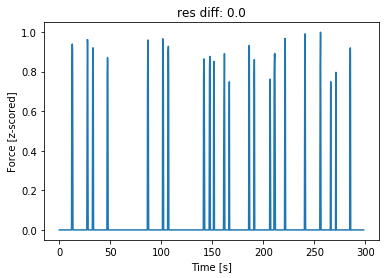

0.0


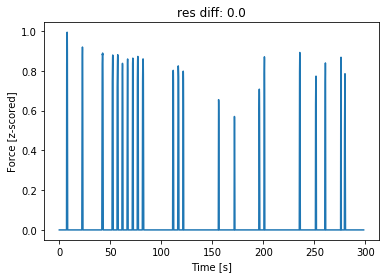

0.0


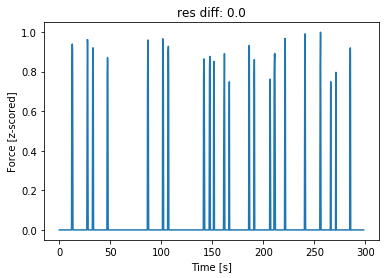

0.0


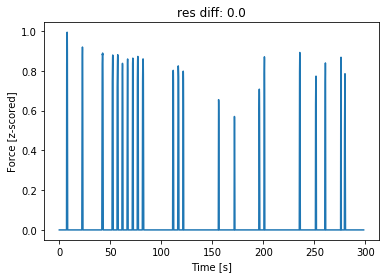

0.0


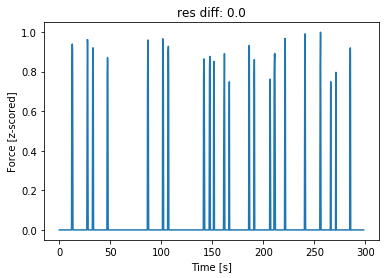

0.0


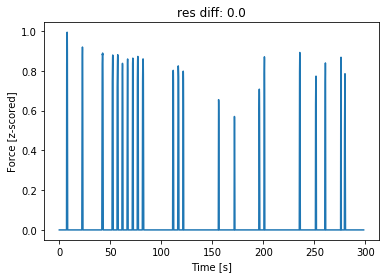

0.0


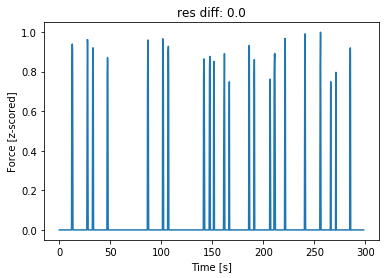

0.0


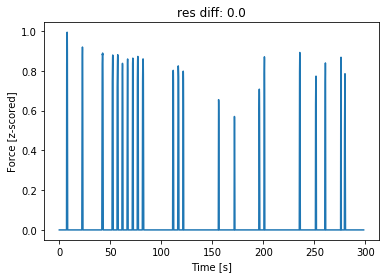

0.0


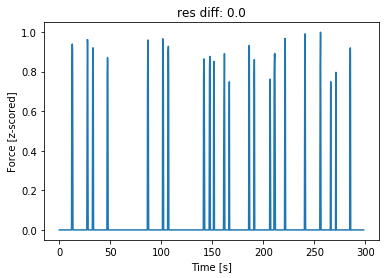

0.0


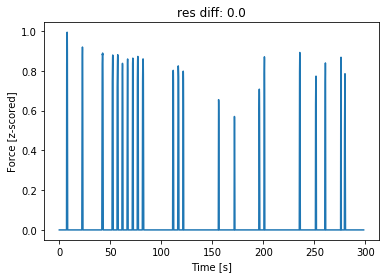

0.0


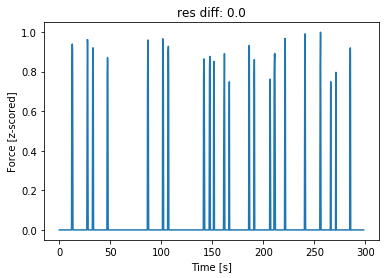

0.0


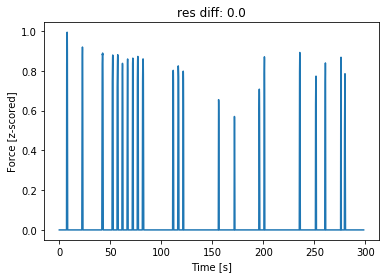

0.0


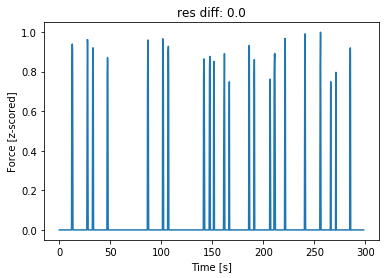

0.0


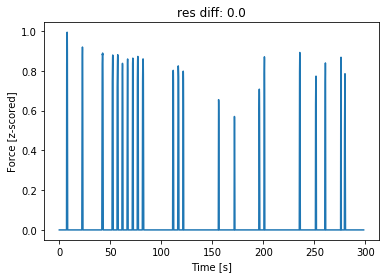

0.0


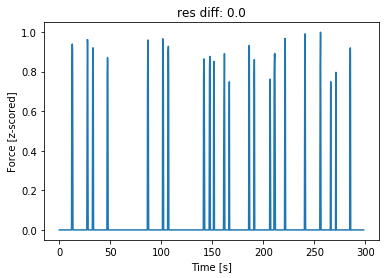

0.07329033333333333


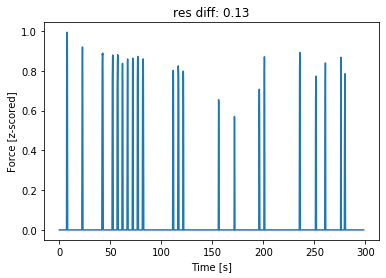

0.026009333333333332


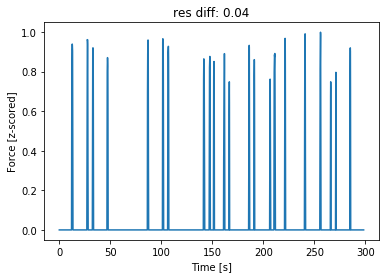

0.08967133333333333


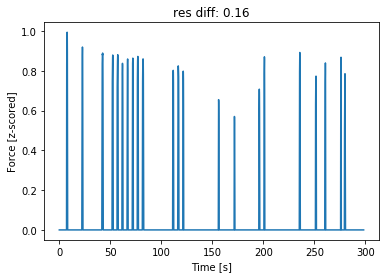

0.0


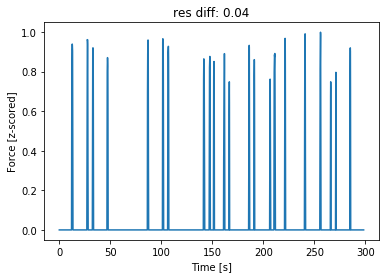

0.06235833333333333


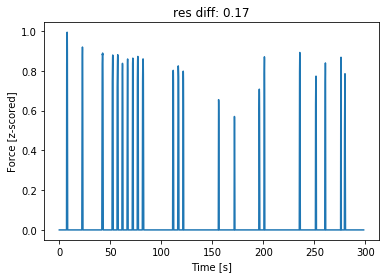

0.0


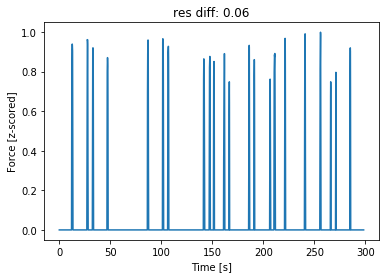

0.09380133333333333


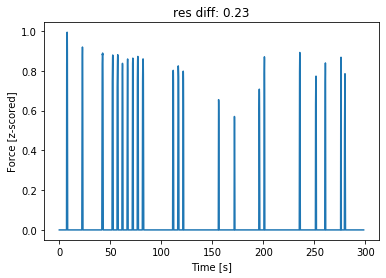

0.0


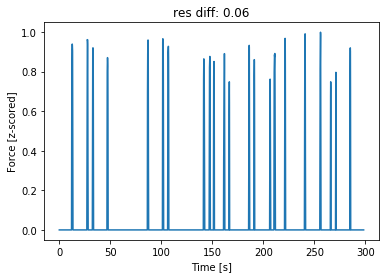

0.11005533333333334


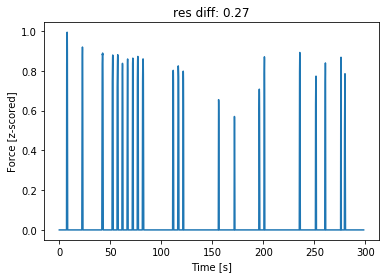

0.0012613333333333333


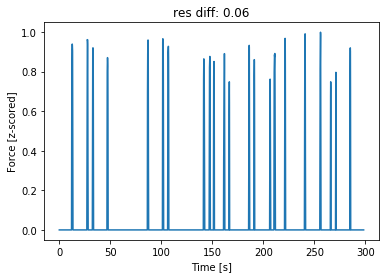

0.12257533333333333


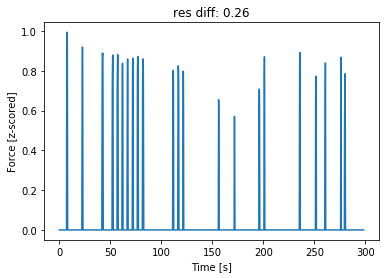

0.023146


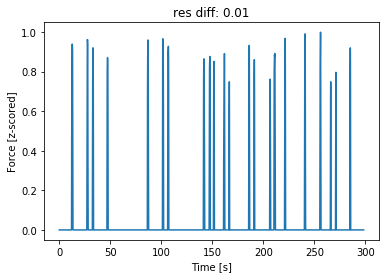

0.1950896666666667


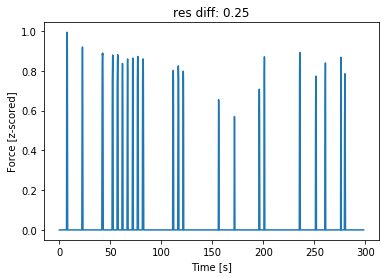

0.002857


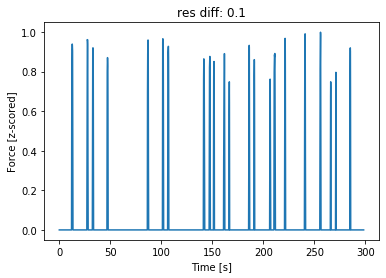

0.16633133333333336


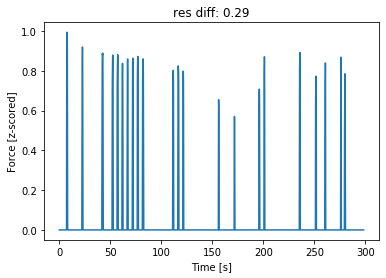

0.0


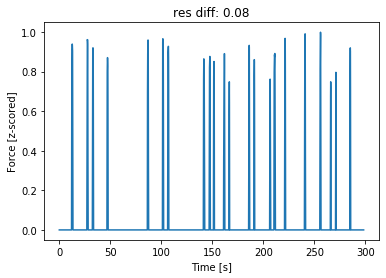

0.19562733333333335


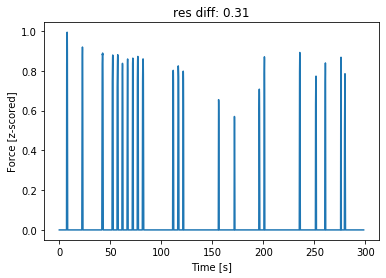

0.009860333333333334


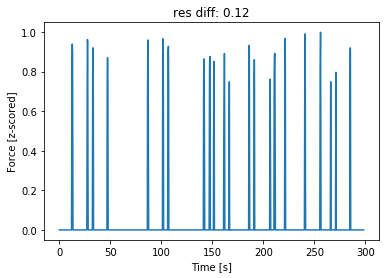

0.27705033333333334


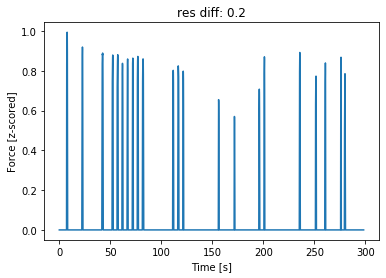

0.0


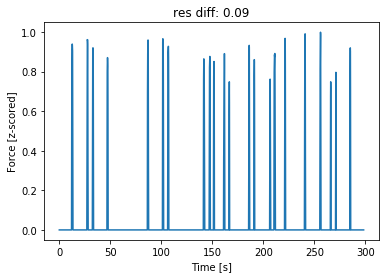

0.1532106666666667


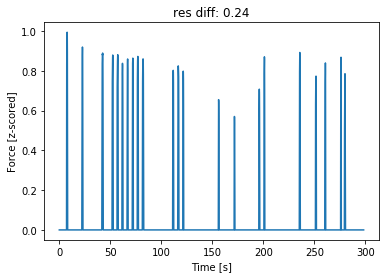

0.011299666666666666


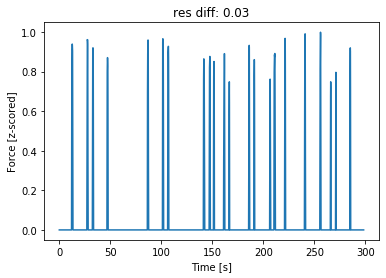

0.11290333333333334


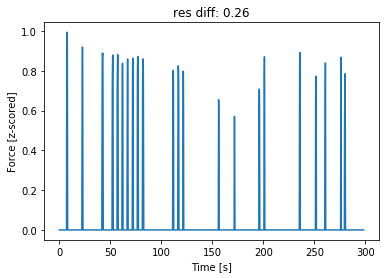

0.013231333333333333


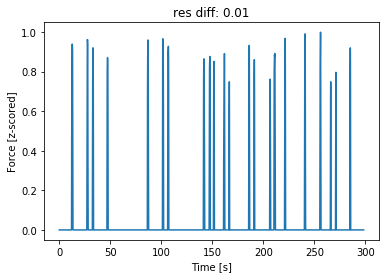

0.07231266666666668


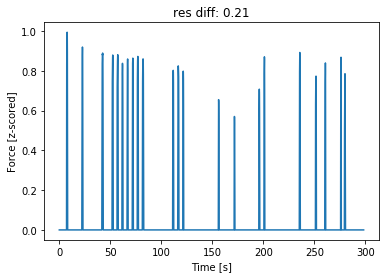

0.0


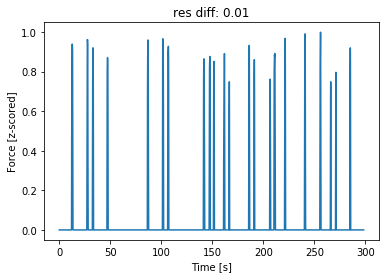

0.028876333333333334


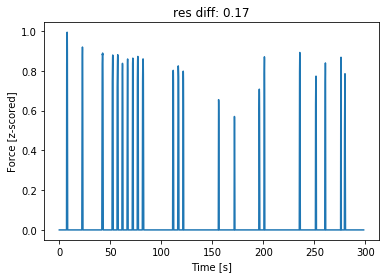

0.0


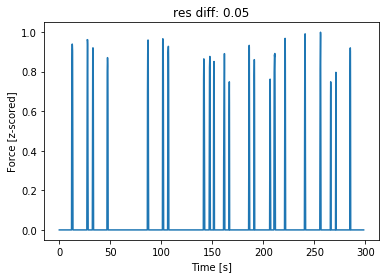

0.025066333333333333


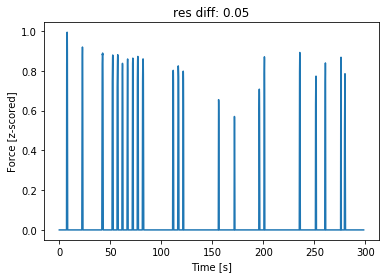

0.0009299999999999999


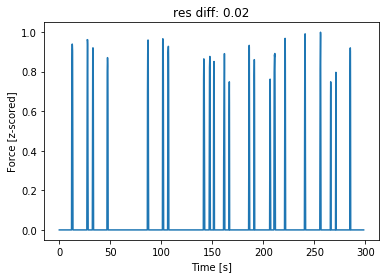

0.015952


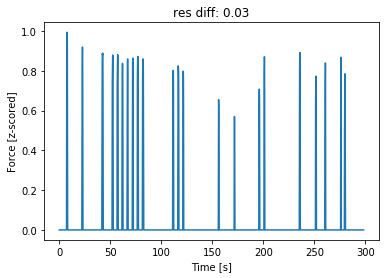

0.0039429999999999995


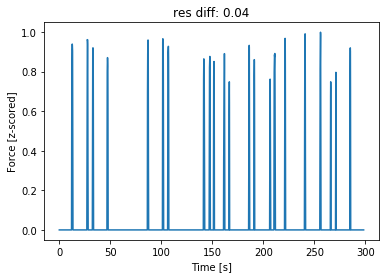

0.07304966666666667


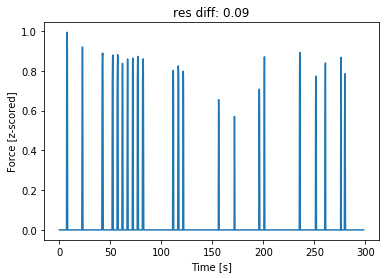

0.0


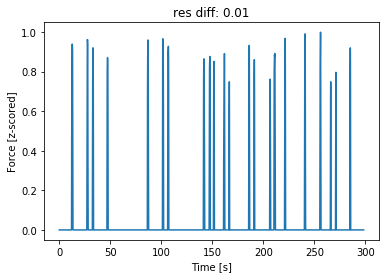

0.11428933333333334


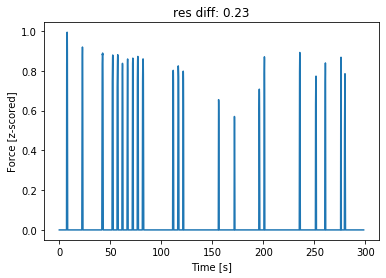

0.015369


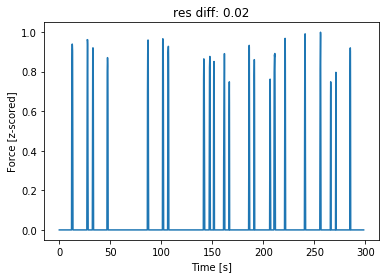

0.12380866666666668


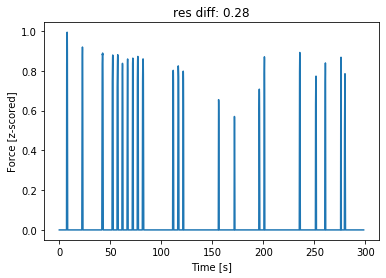

0.006401666666666667


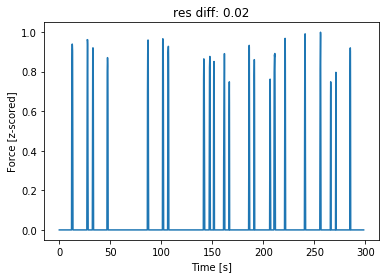

0.099395


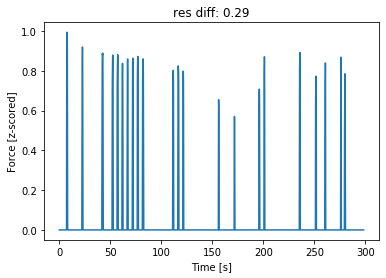

0.0


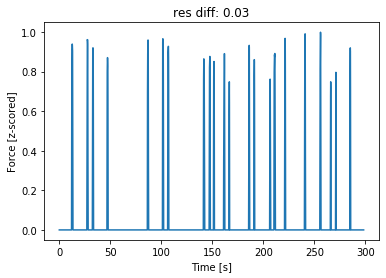

0.19320799999999996


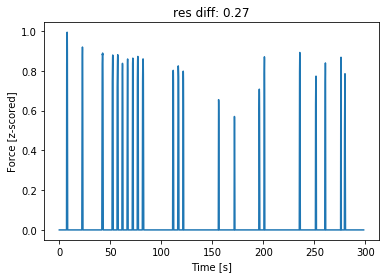

0.0


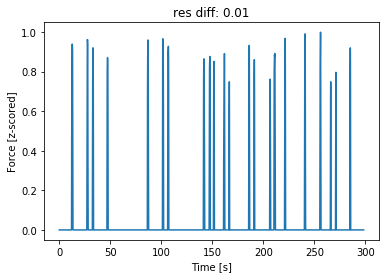

0.22130333333333332


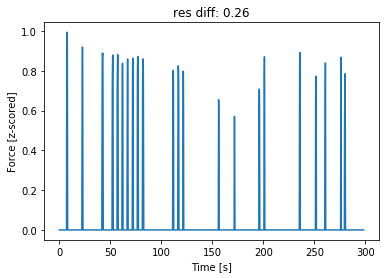

0.0


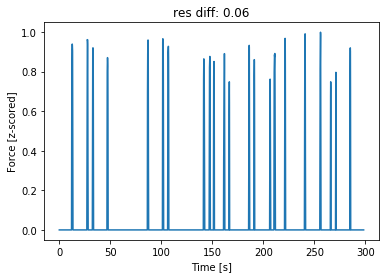

0.215023


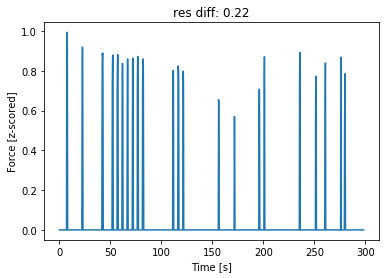

0.0


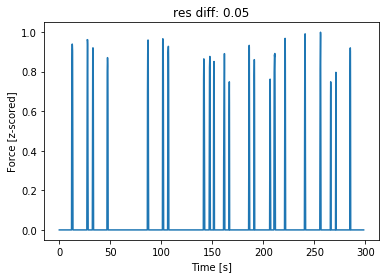

0.29967066666666664


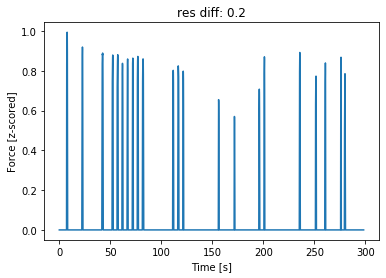

0.03427333333333333


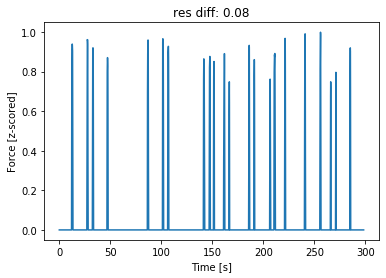

0.21390233333333333


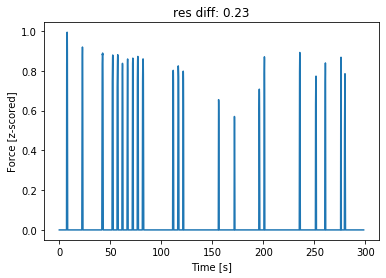

0.0


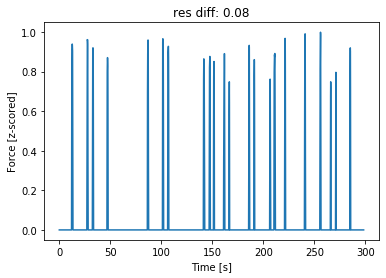

0.19463366666666668


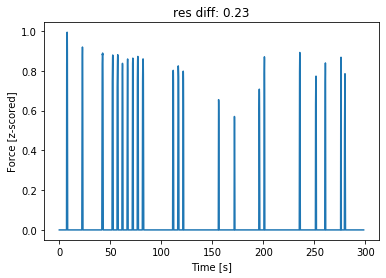

0.0


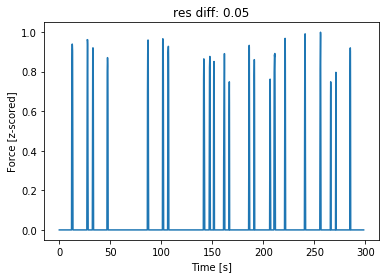

0.173214


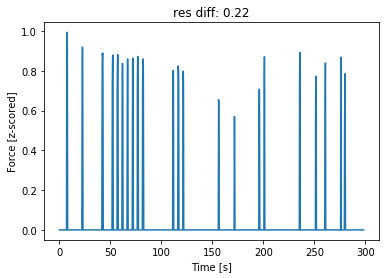

0.010948666666666667


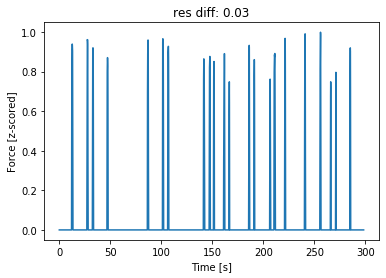

0.12473699999999999


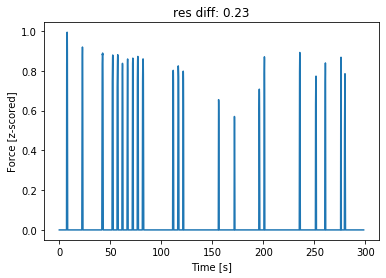

0.0


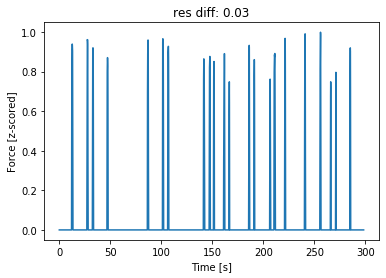

006
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
006
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
006
['ST

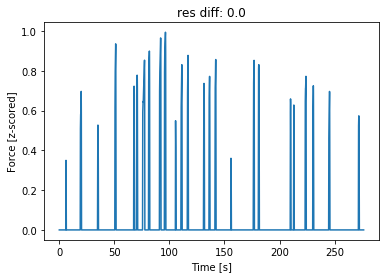

0.0


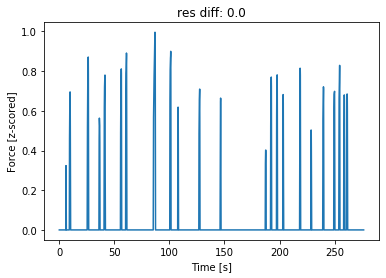

0.02729266666666667


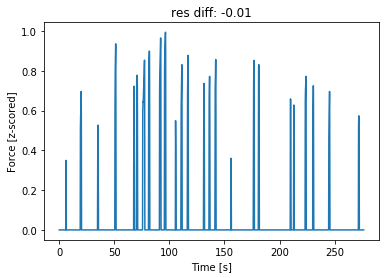

0.08120333333333334


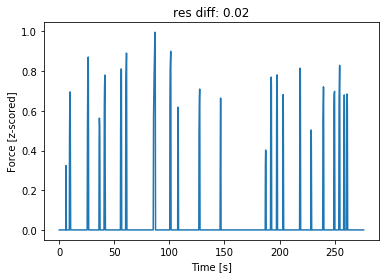

0.0


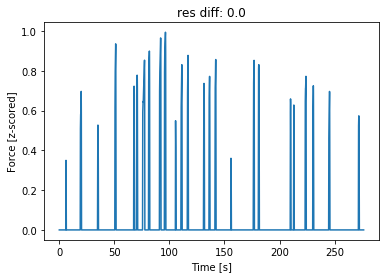

0.0


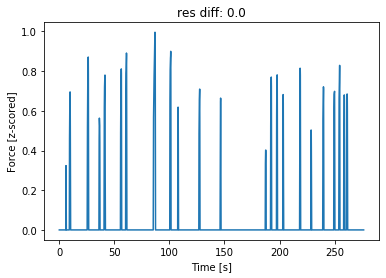

0.0


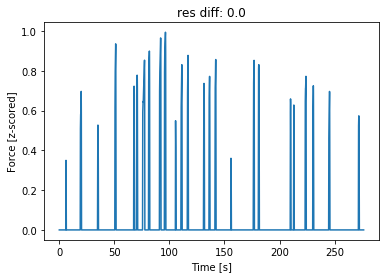

0.0


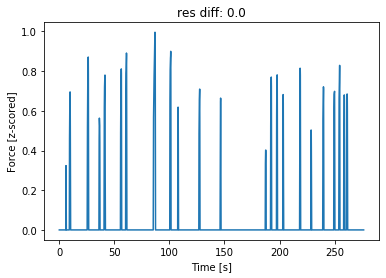

0.0


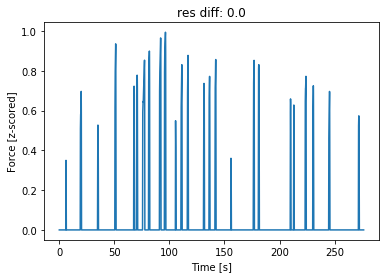

0.0


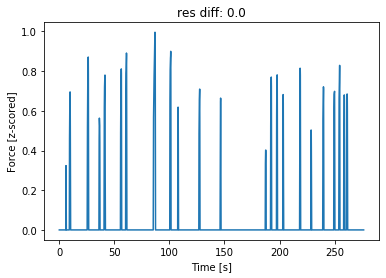

0.0


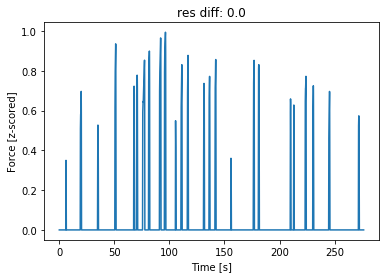

0.0


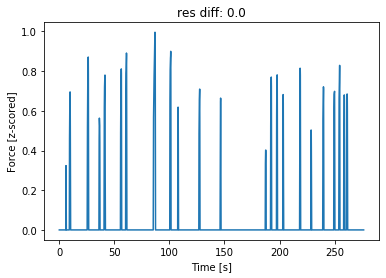

0.0


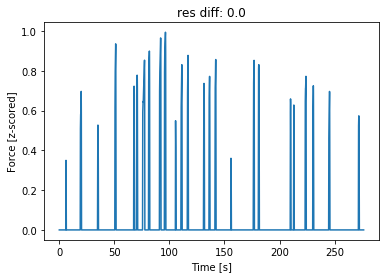

0.0


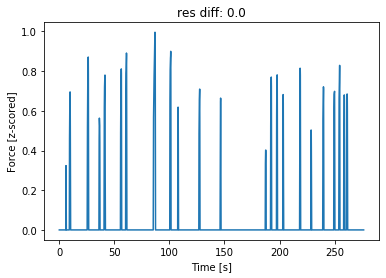

0.0


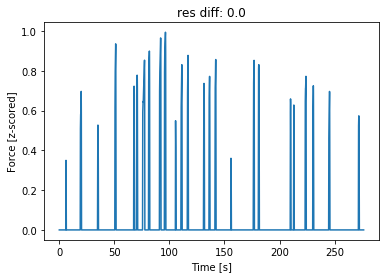

0.0


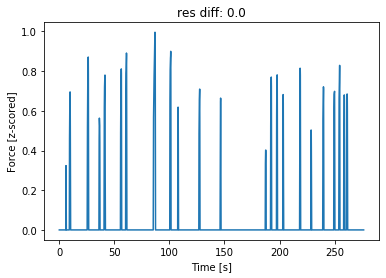

0.0


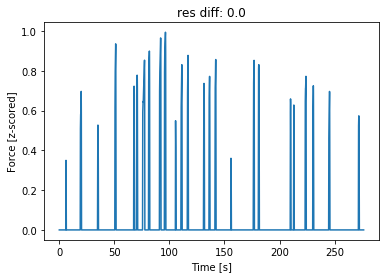

0.0


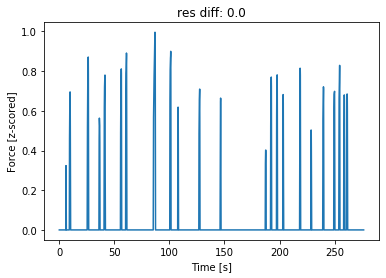

0.0


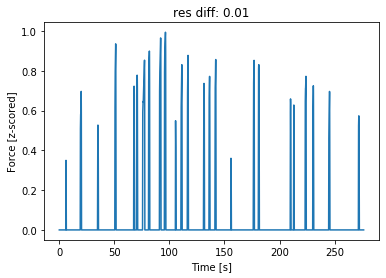

0.0


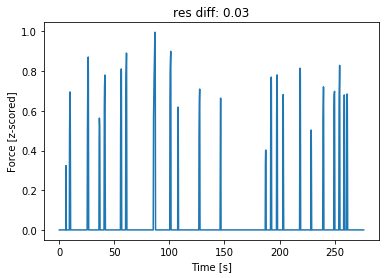

0.0


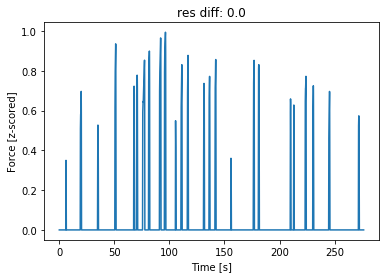

0.0


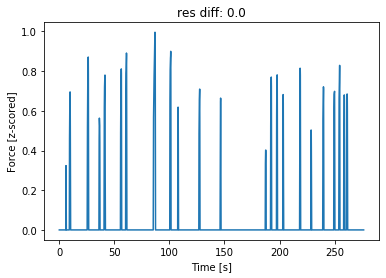

0.003035333333333333


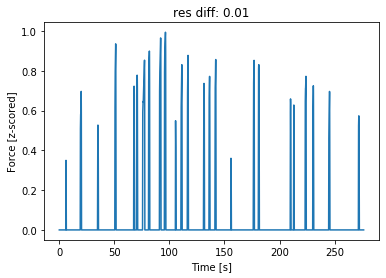

0.13077933333333333


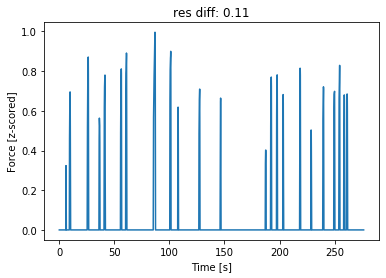

0.0


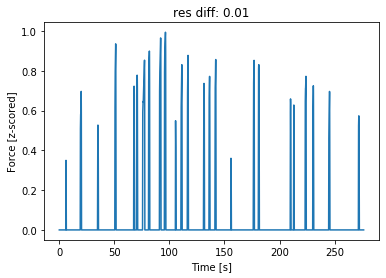

0.15956


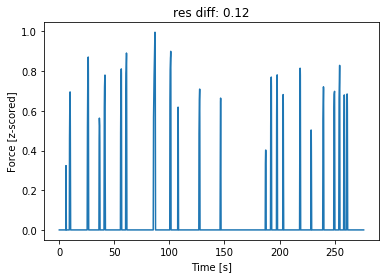

0.010810333333333333


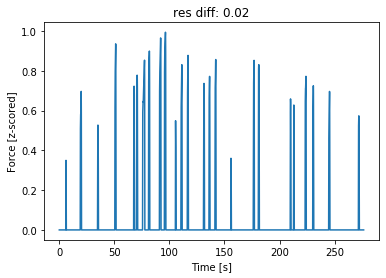

0.03719366666666667


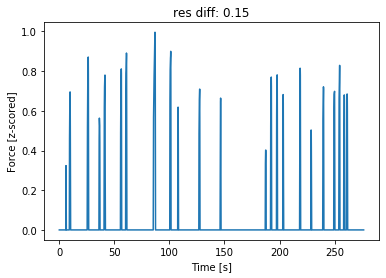

0.0


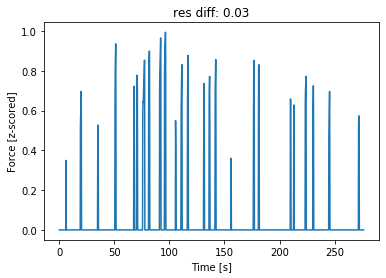

0.004909333333333333


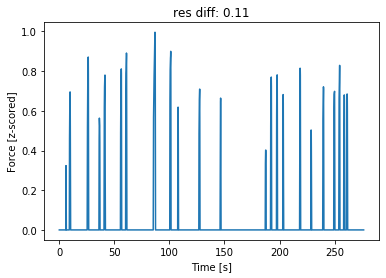

0.0030519999999999996


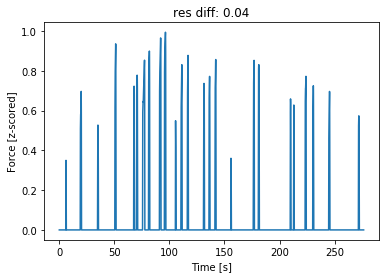

0.02043033333333333


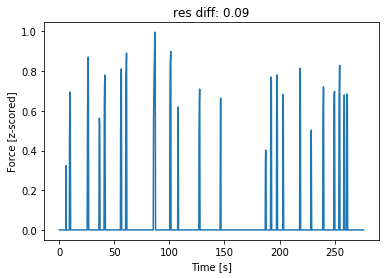

0.0


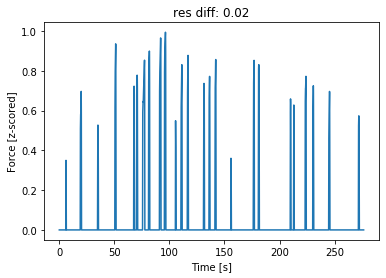

0.018809666666666666


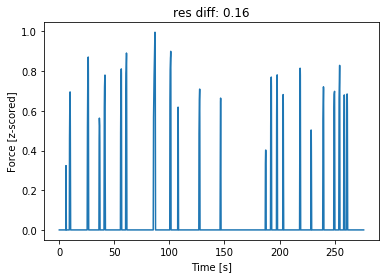

0.0


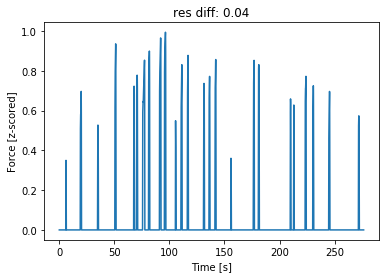

0.05445633333333333


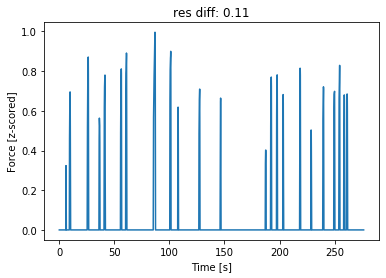

0.002555


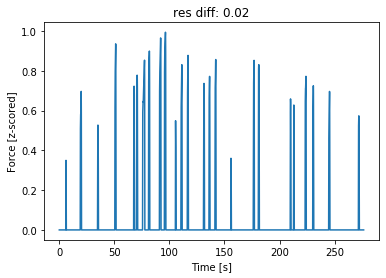

0.0


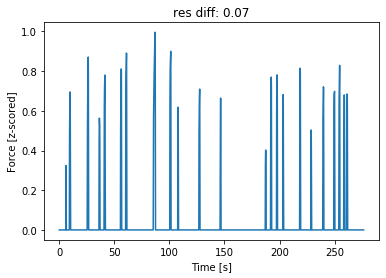

0.004277666666666667


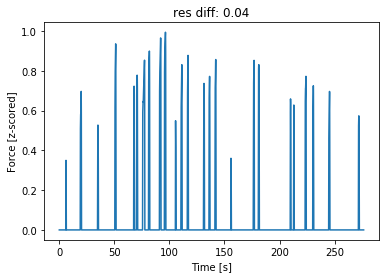

0.0


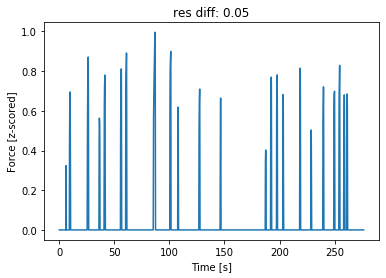

0.021152


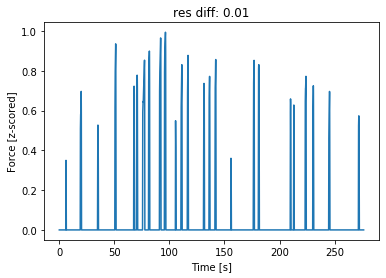

0.0


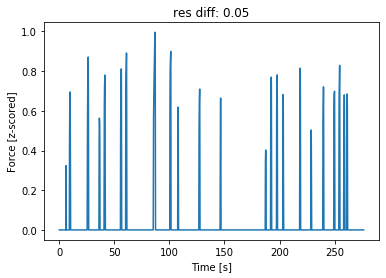

0.0


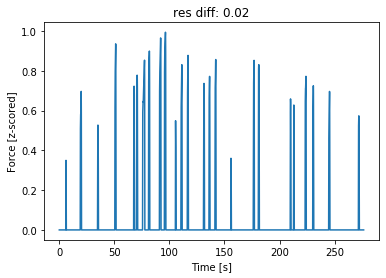

0.018179333333333332


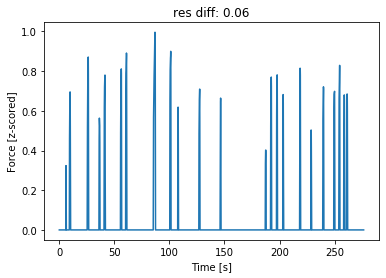

0.0


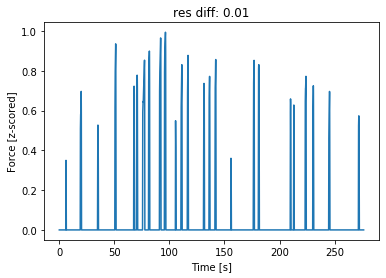

0.07561266666666666


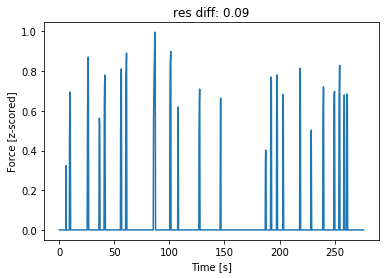

0.006866000000000001


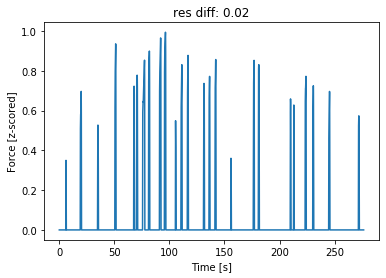

0.08258666666666667


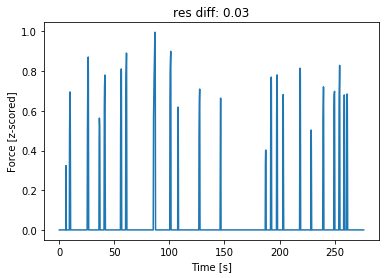

0.0


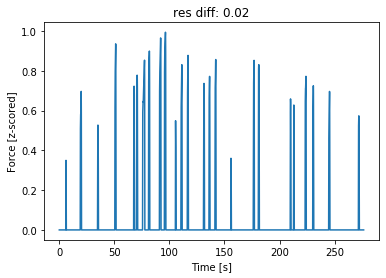

0.024158000000000002


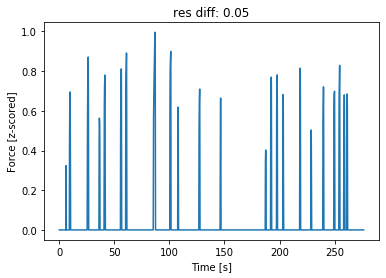

0.011408666666666666


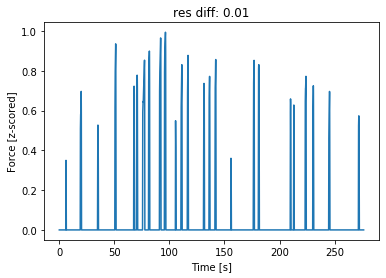

0.04820866666666667


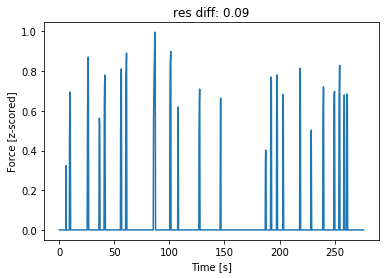

0.004847


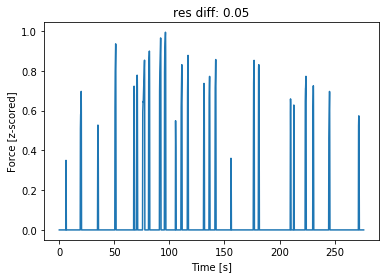

0.043655


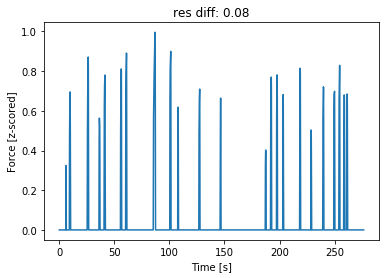

0.014298333333333335


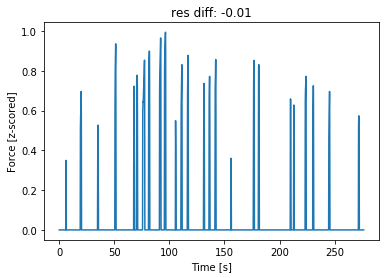

0.05513266666666666


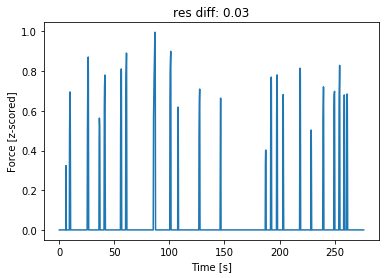

0.0


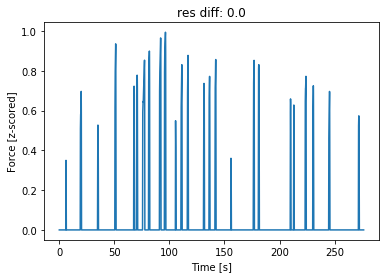

0.14788233333333334


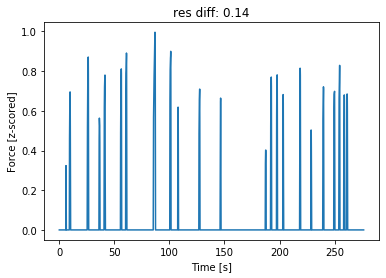

0.0024709999999999997


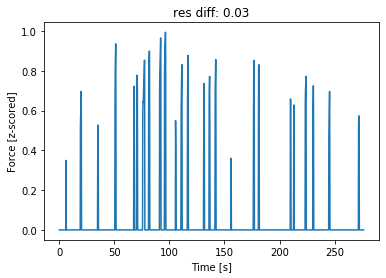

0.3695843333333333


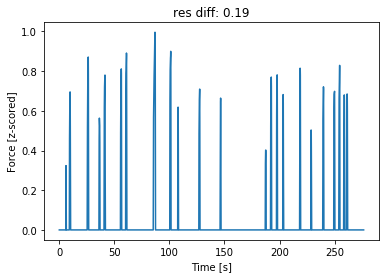

0.0


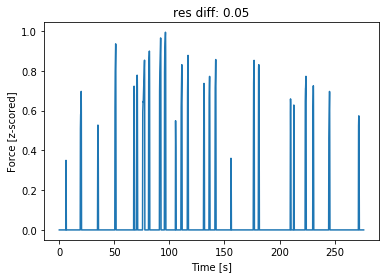

0.3207163333333333


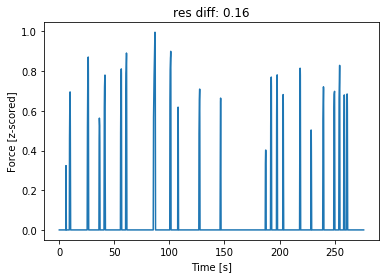

0.043581666666666664


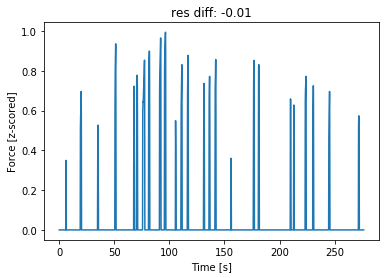

0.092849


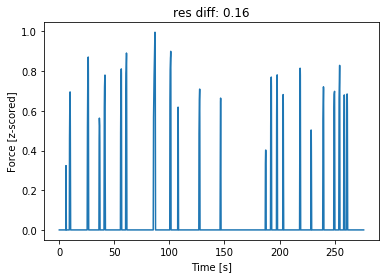

0.023947666666666662


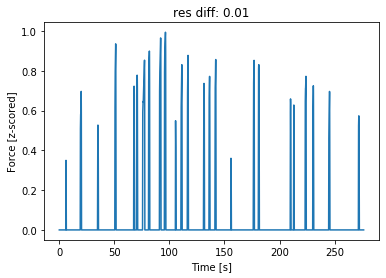

0.012584


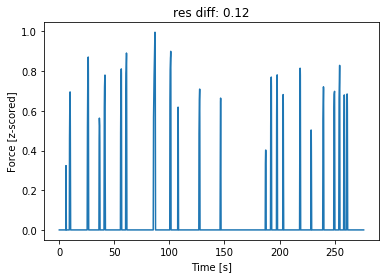

0.006282


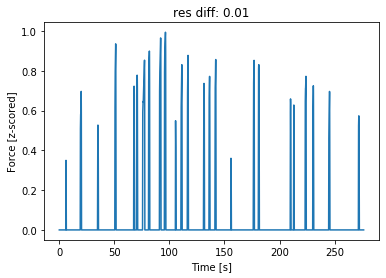

0.0


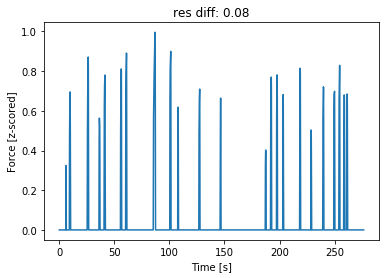

0.0


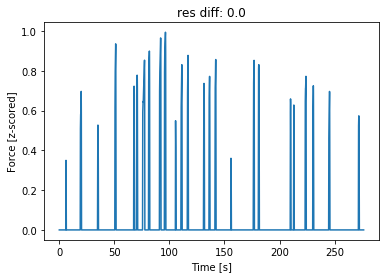

0.0


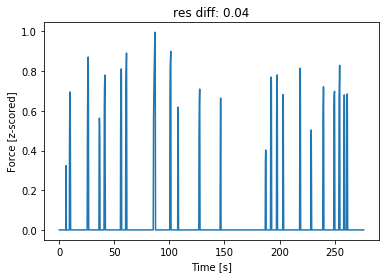

0.005030333333333334


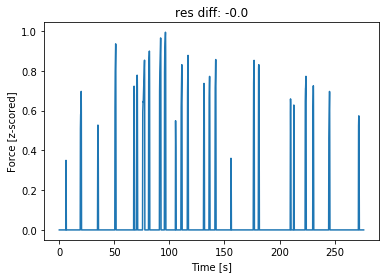

0.03266533333333333


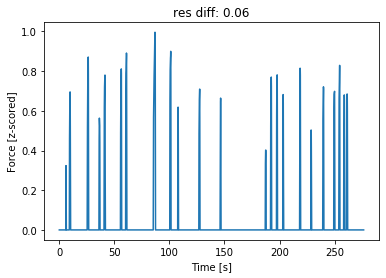

0.0


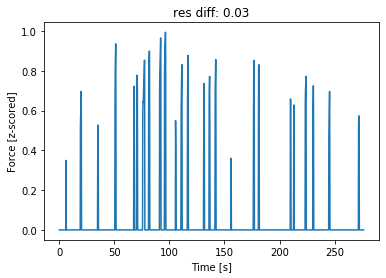

0.08469866666666666


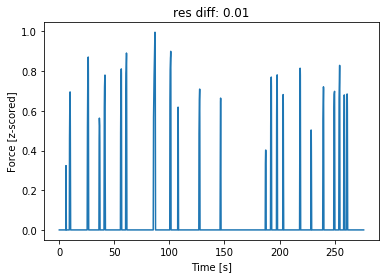

0.0


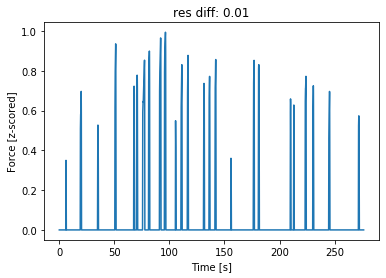

0.02335633333333333


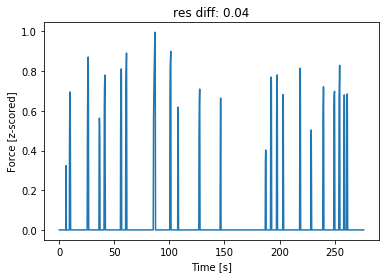

0.000205


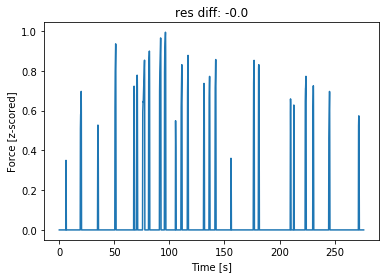

0.028947666666666667


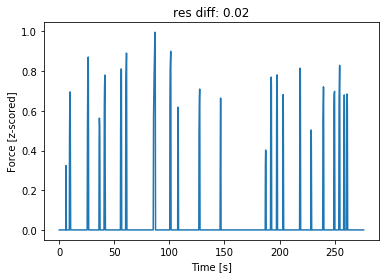

006
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'ECOG_RIGHT_6', 'ECOG_RIGHT_7', 'ECOG_RIGHT_8', 'ECOG_RIGHT_9', 'ECOG_RIGHT_10', 'ECOG_RIGHT_11', 'ECOG_RIGHT_12', 'ECOG_RIGHT_13', 'ECOG_RIGHT_14', 'ECOG_RIGHT_15', 'ECOG_RIGHT_16', 'ECOG_RIGHT_17', 'ECOG_RIGHT_18', 'ECOG_RIGHT_19', 'ECOG_RIGHT_20', 'ECOG_RIGHT_21', 'ECOG_RIGHT_22', 'ECOG_RIGHT_23', 'ECOG_RIGHT_24', 'ECOG_RIGHT_25', 'ECOG_RIGHT_26', 'ECOG_RIGHT_27', 'MOV_RIGHT', 'MOV_LEFT']
007
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


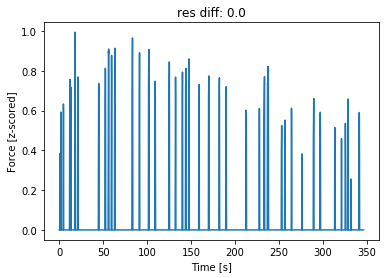

0.010280333333333334


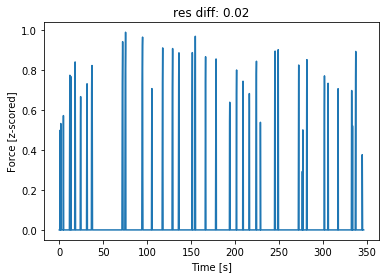

0.0


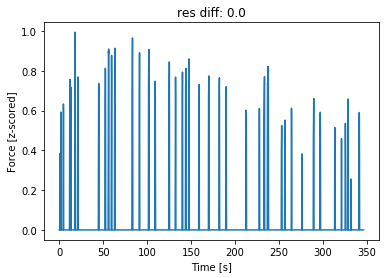

0.0


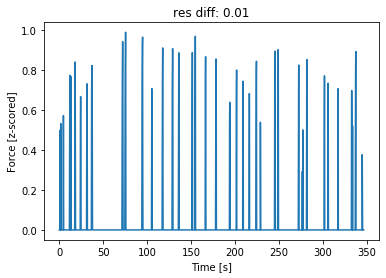

0.0


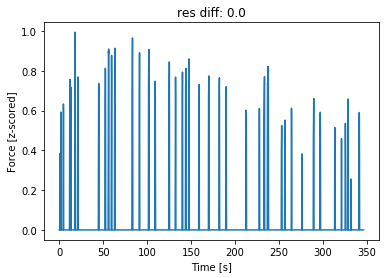

0.0


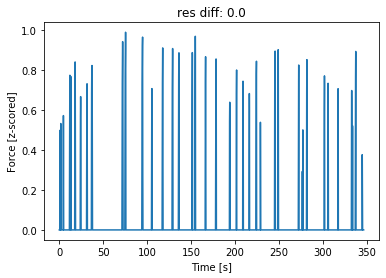

0.044706666666666665


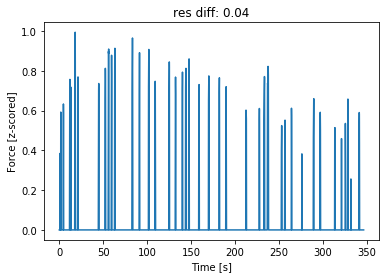

0.0


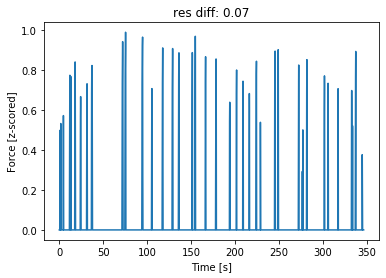

0.033239


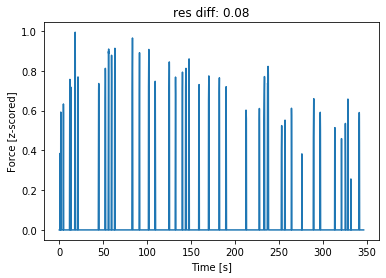

0.016326666666666666


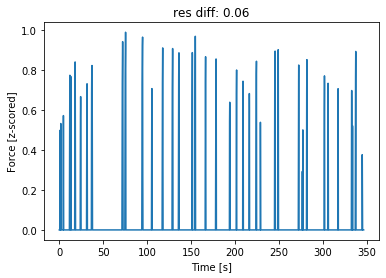

0.0


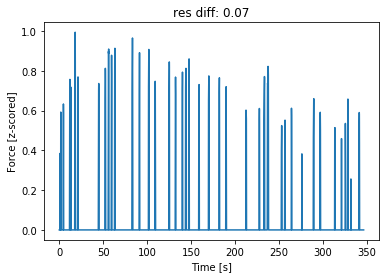

0.023520333333333334


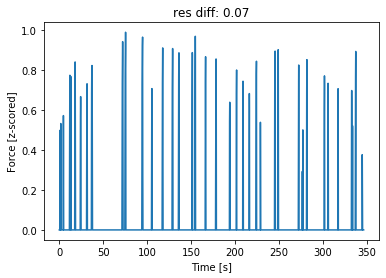

0.010437


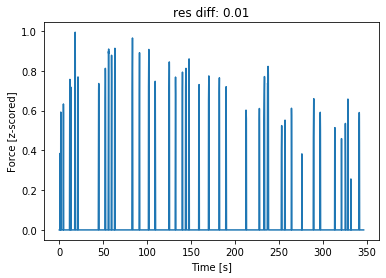

0.008839333333333333


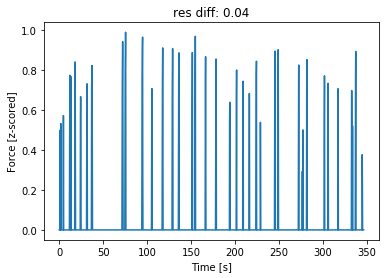

0.0


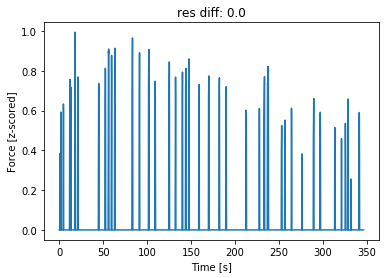

0.0


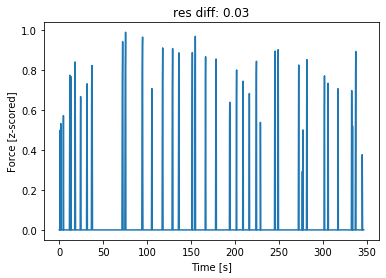

0.0


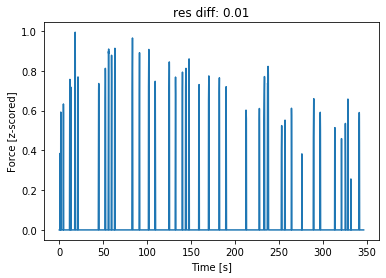

0.0


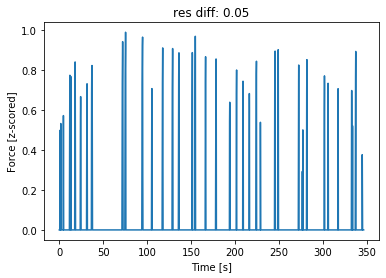

008
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


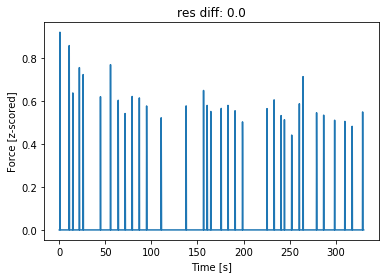

0.0


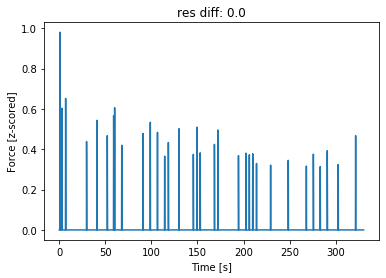

0.0


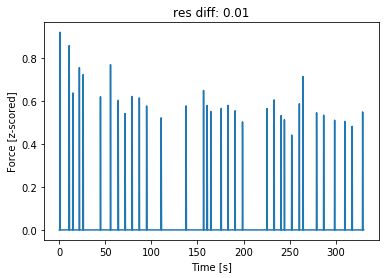

0.0


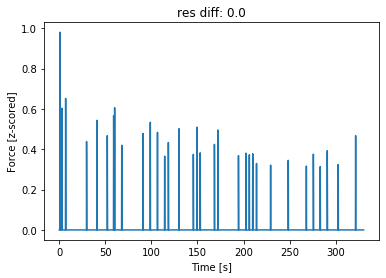

0.0


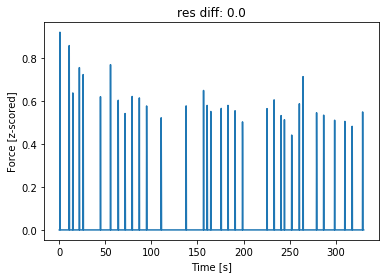

0.0


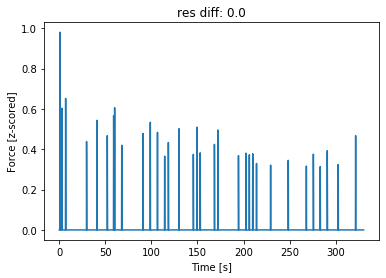

0.11597299999999999


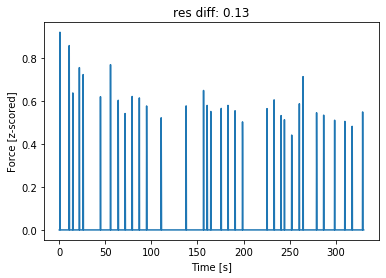

0.0


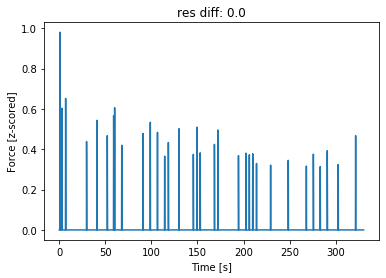

0.3185306666666667


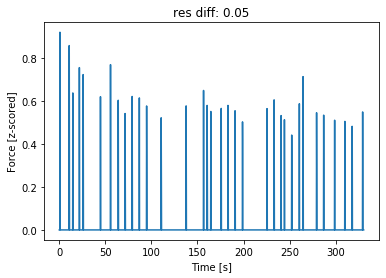

0.0


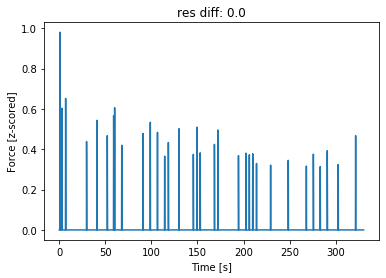

0.3980646666666667


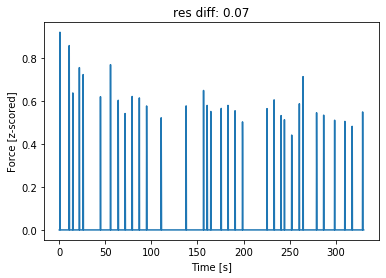

0.0


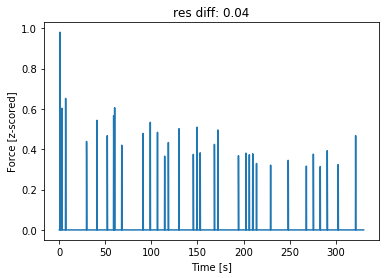

0.070948


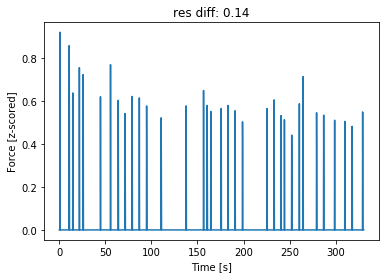

0.0


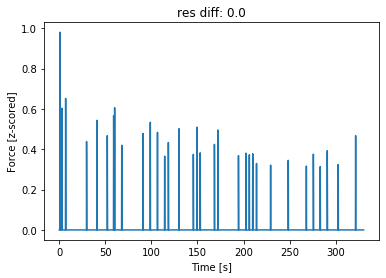

0.027612333333333332


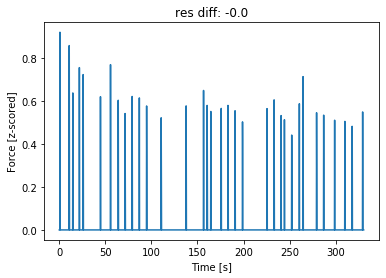

0.0


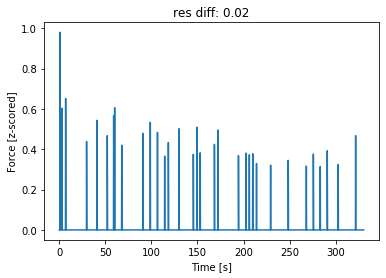

0.0


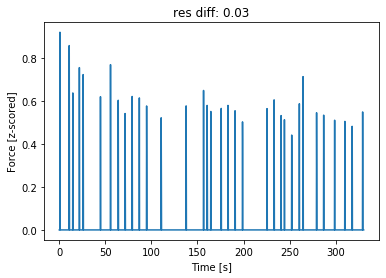

0.0


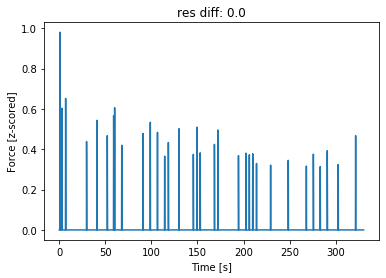

008
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
009
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


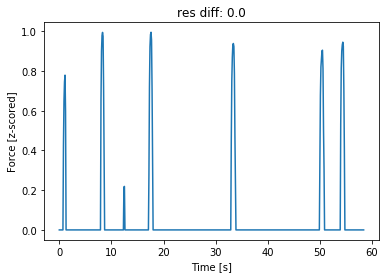

0.0


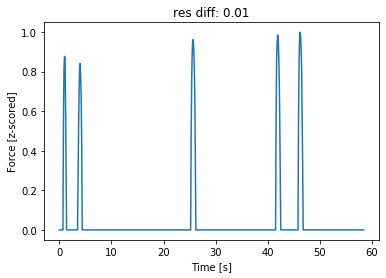

0.0


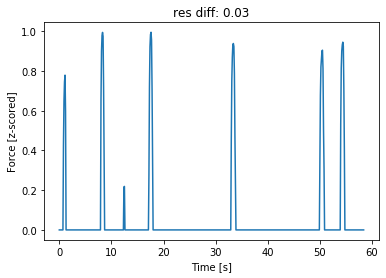

0.0


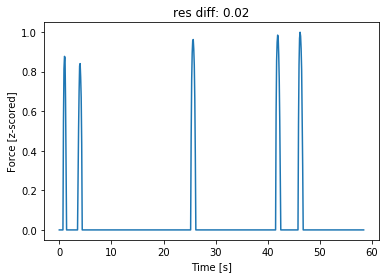

0.0


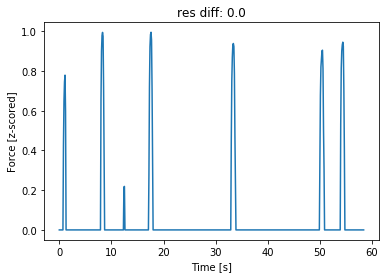

0.0


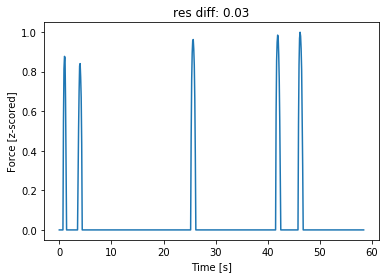

0.048086666666666666


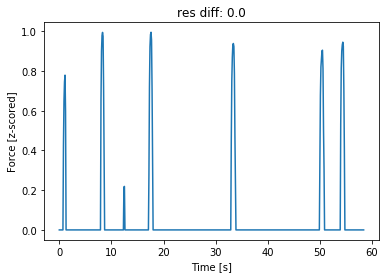

0.09328866666666667


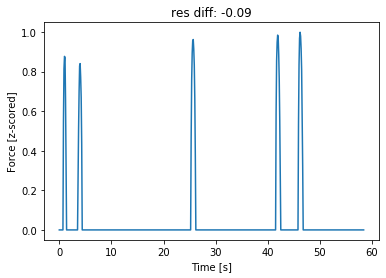

0.0


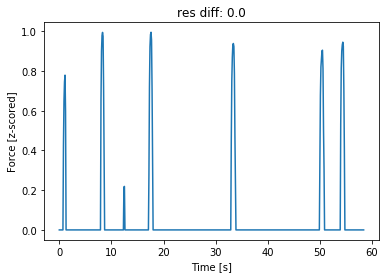

0.0


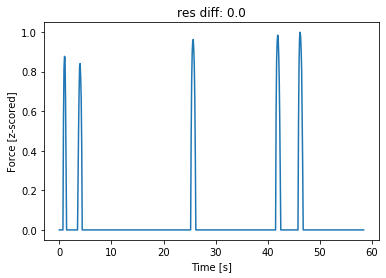

0.0


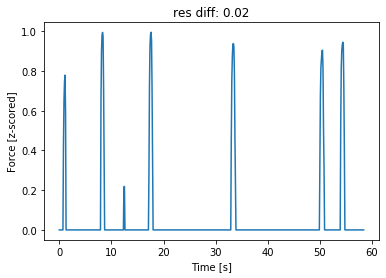

0.02629366666666667


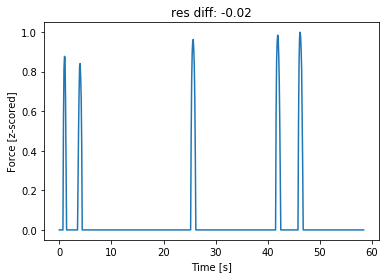

0.0


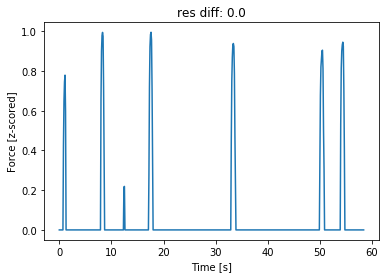

0.0


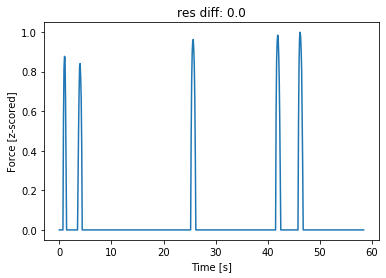

0.0


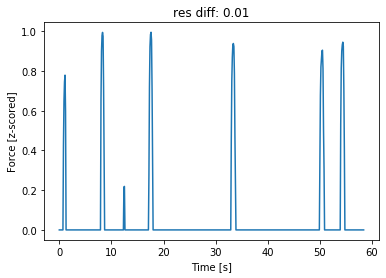

0.0


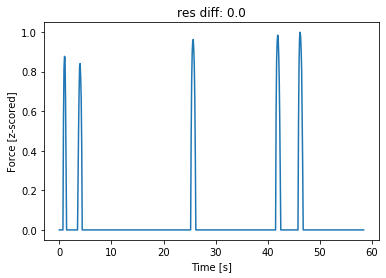

0.0


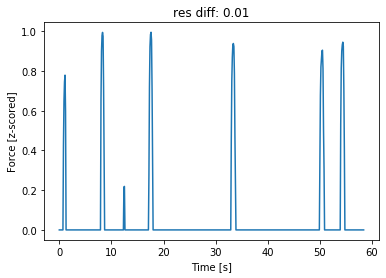

0.0


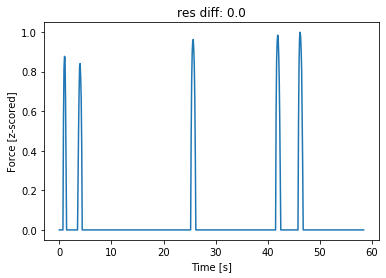

009
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
009
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
009
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
009
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.013540333333333333


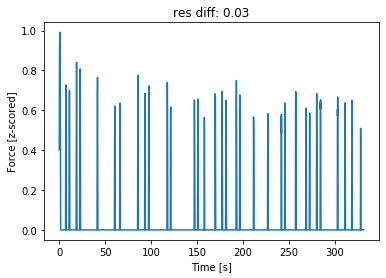

0.0


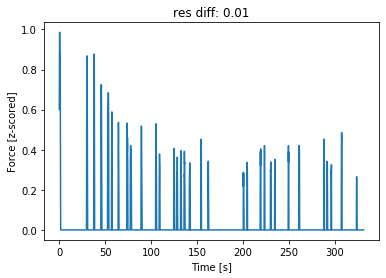

0.013817000000000001


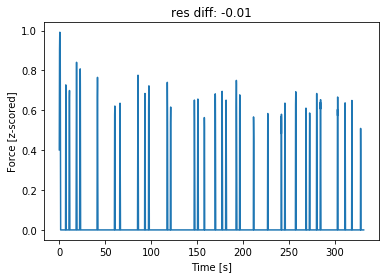

0.0


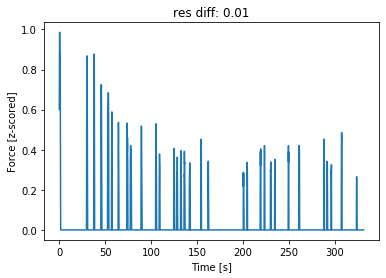

0.0


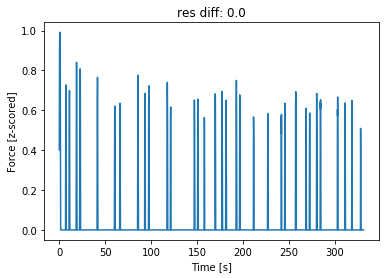

0.0


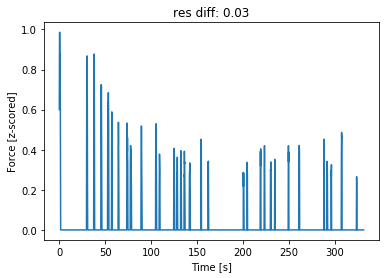

0.21584866666666666


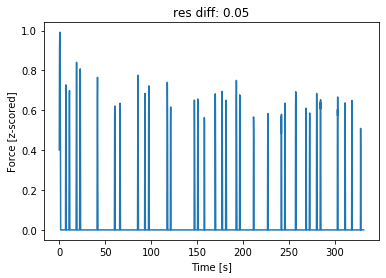

0.024291666666666666


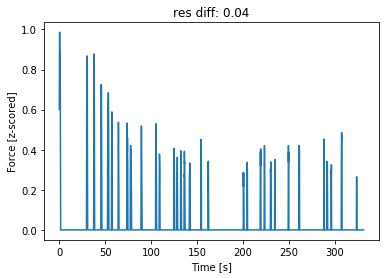

0.1684996666666667


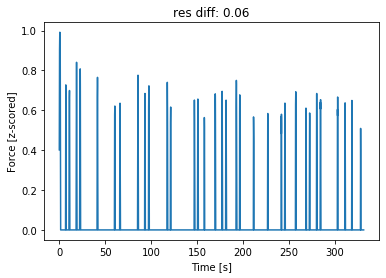

0.0


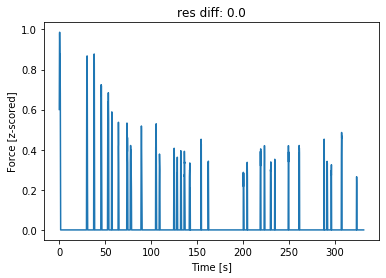

0.0


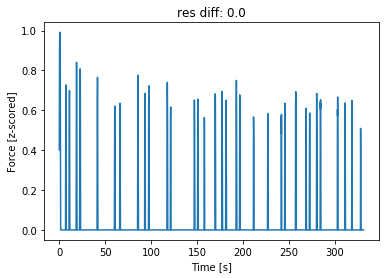

0.0


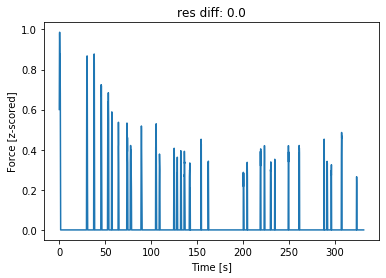

0.0


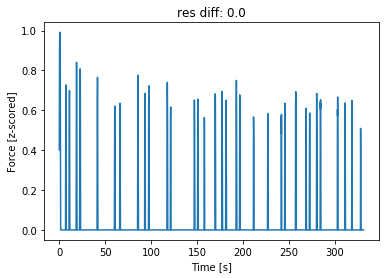

0.0


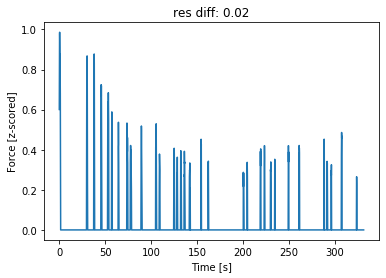

0.0


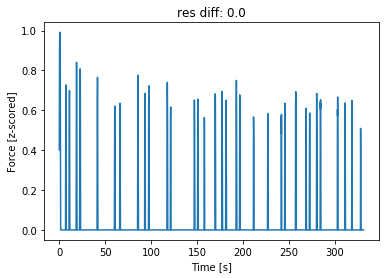

0.0


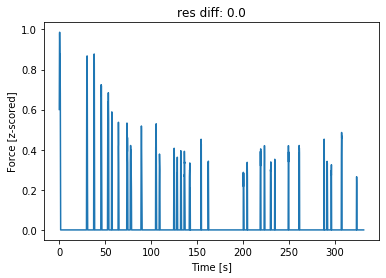

0.0


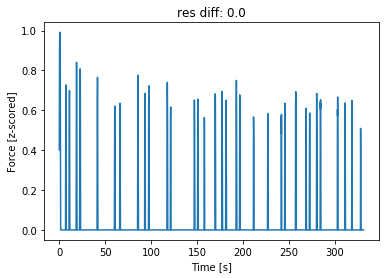

0.0


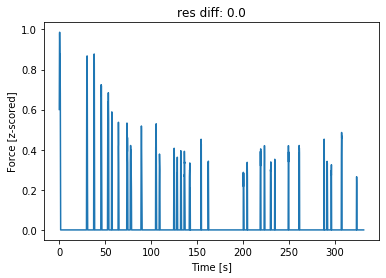

010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
010
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


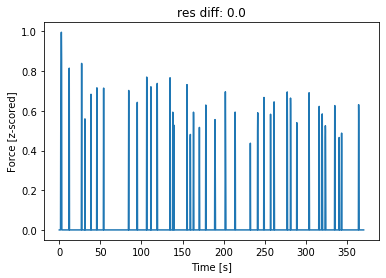

0.0


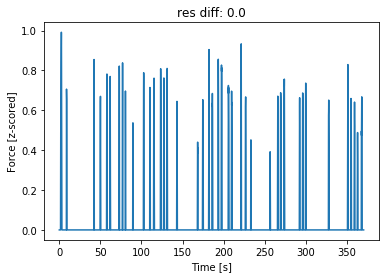

0.0


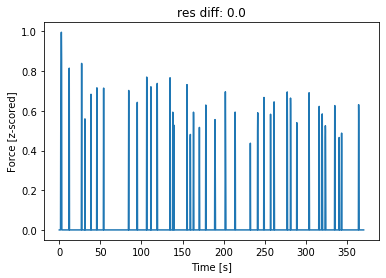

0.0


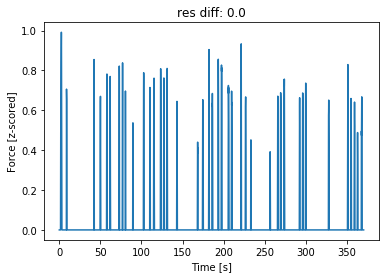

0.0


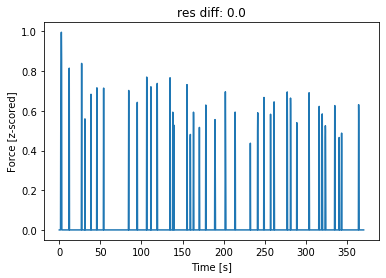

0.0020523333333333335


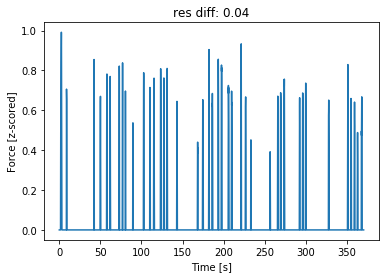

0.0


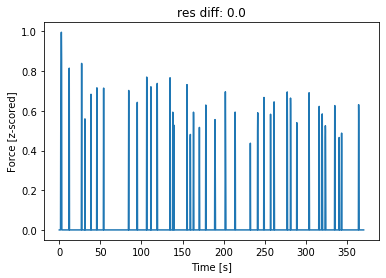

0.09797933333333335


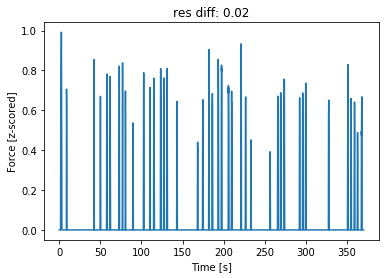

0.0


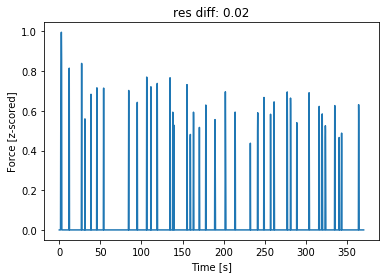

0.0


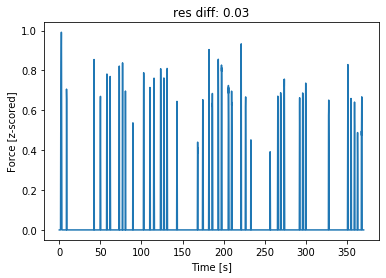

0.0


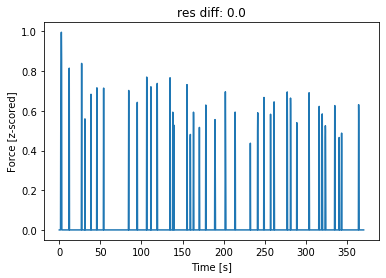

0.0


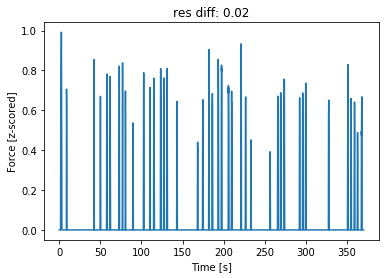

0.0


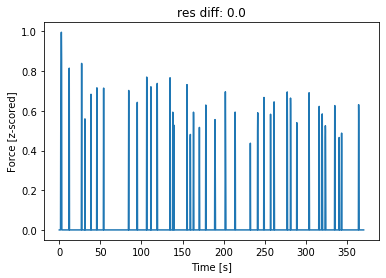

0.0


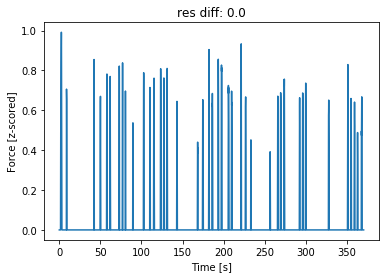

0.0


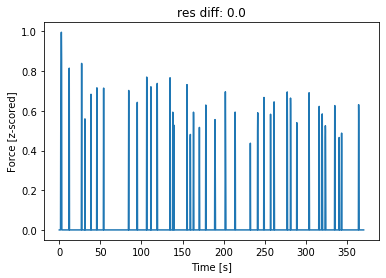

0.0


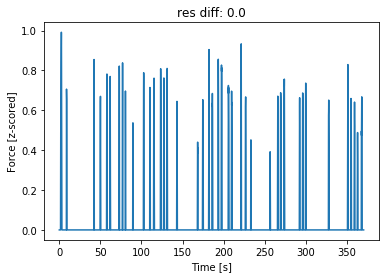

0.0


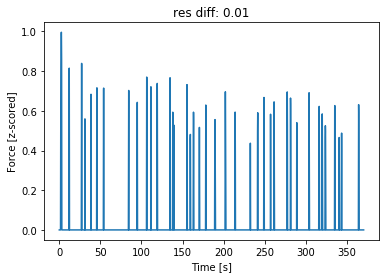

0.0


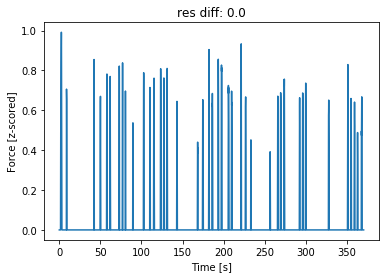

013
['STN_LEFT_0', 'STN_LEFT_1', 'STN_LEFT_2', 'ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


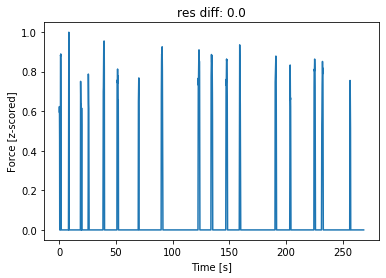

0.0


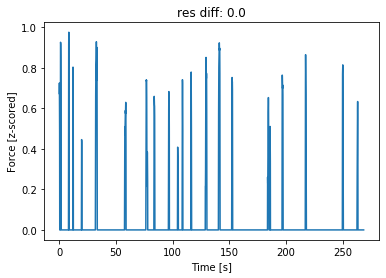

0.0


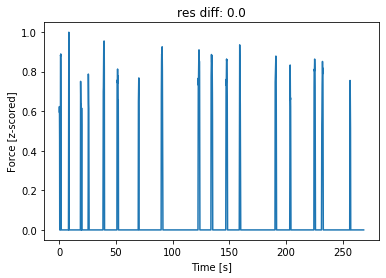

0.0


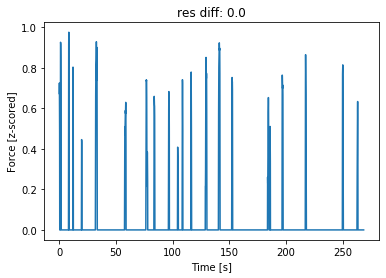

0.0


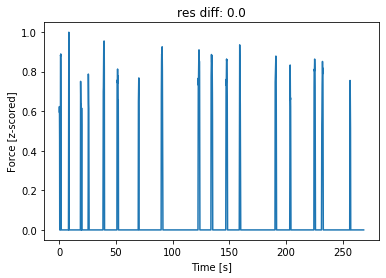

0.0


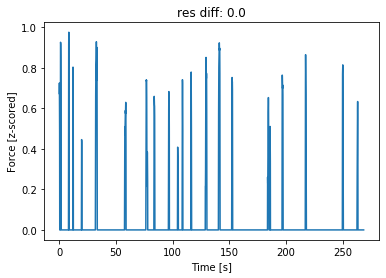

0.06960266666666666


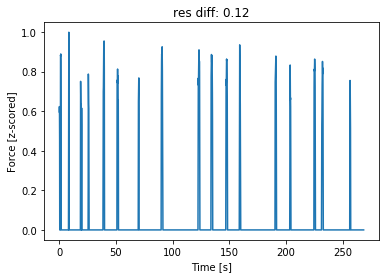

0.0


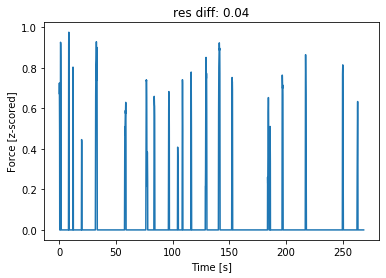

0.044267


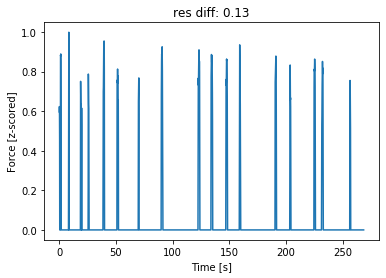

0.0


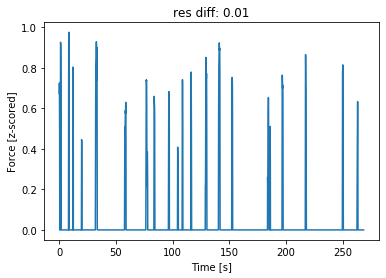

0.08848433333333333


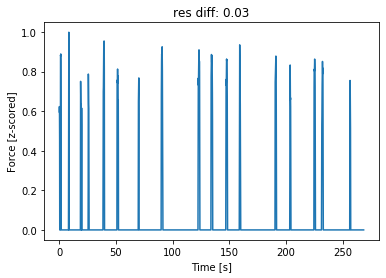

0.0


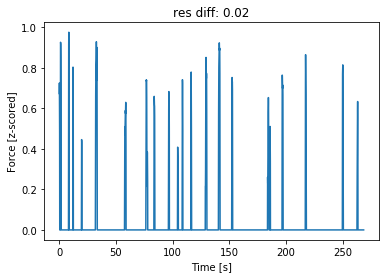

0.14214766666666667


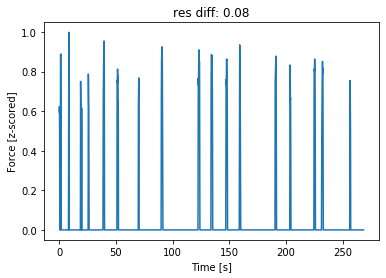

0.0


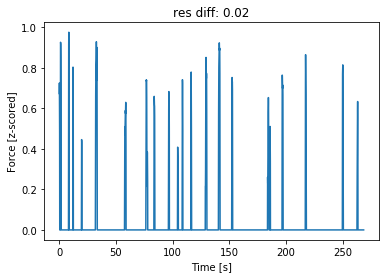

0.10312166666666667


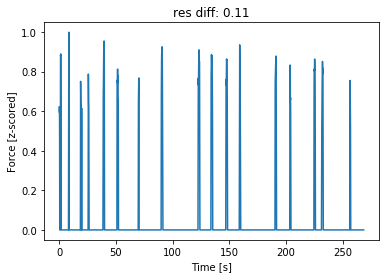

0.0


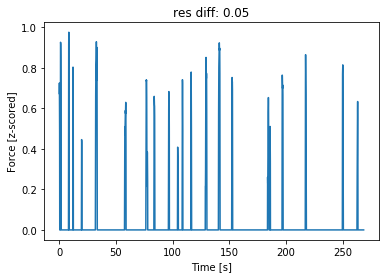

0.03588366666666667


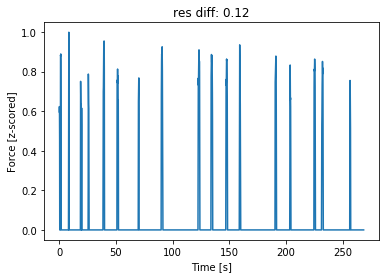

0.0


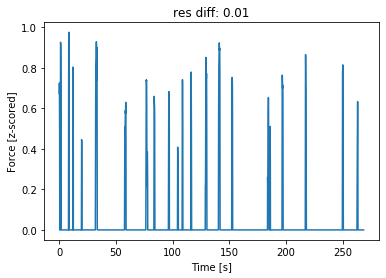

013
['ECOG_LEFT_0', 'ECOG_LEFT_1', 'ECOG_LEFT_2', 'ECOG_LEFT_3', 'ECOG_LEFT_4', 'ECOG_LEFT_5', 'MOV_RIGHT', 'MOV_LEFT']
014
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
014
['ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
014
['STN_RIGHT_0', 'STN_RIGHT_1', 'STN_RIGHT_2', 'ECOG_RIGHT_0', 'ECOG_RIGHT_1', 'ECOG_RIGHT_2', 'ECOG_RIGHT_3', 'ECOG_RIGHT_4', 'ECOG_RIGHT_5', 'MOV_RIGHT', 'MOV_LEFT']
PROCESS
0.0


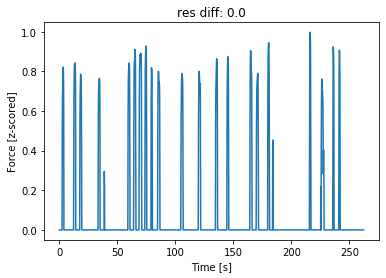

0.0


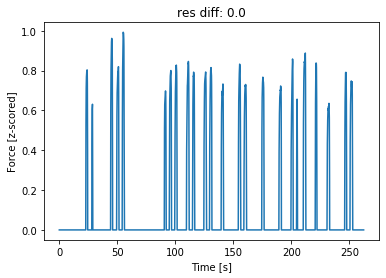

0.0


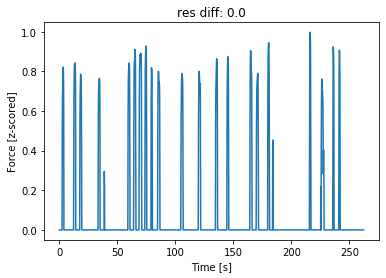

0.0


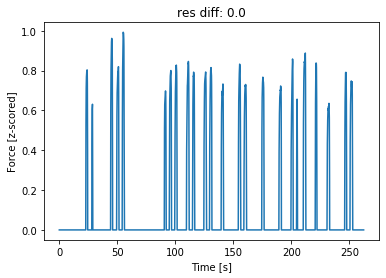

0.0


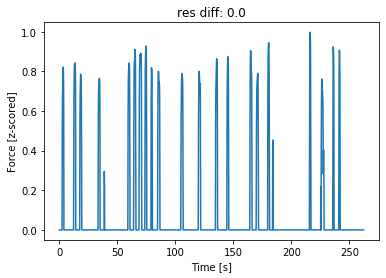

0.0


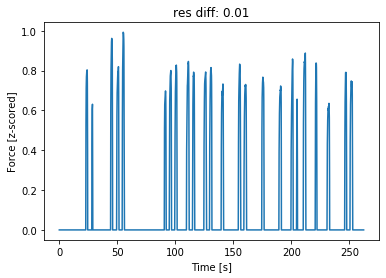

0.0029996666666666665


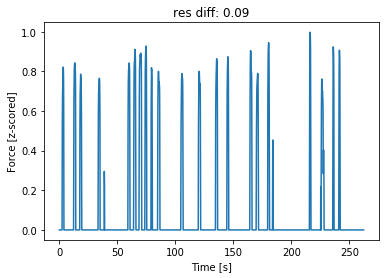

0.07937833333333333


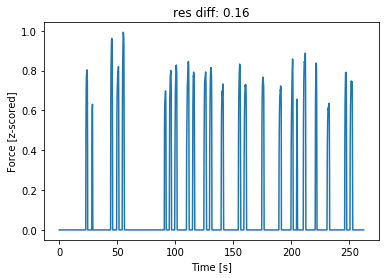

0.0


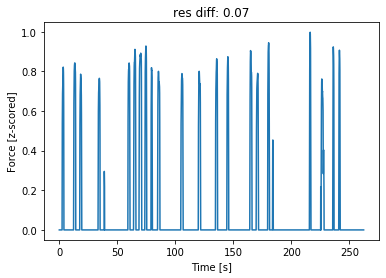

0.05167766666666667


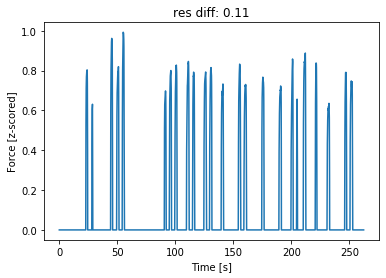

0.0


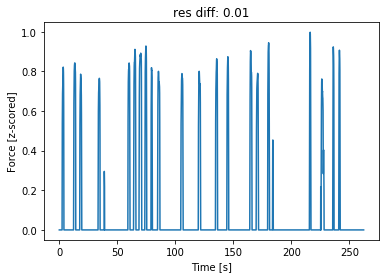

0.028178666666666668


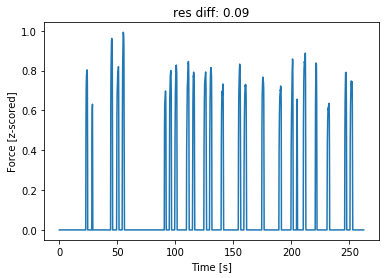

0.0


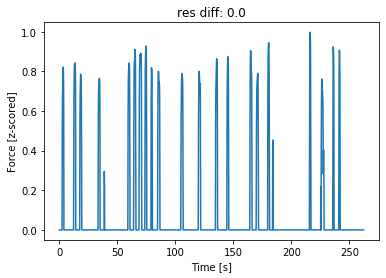

0.039115333333333335


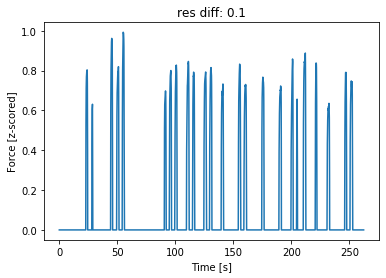

0.0


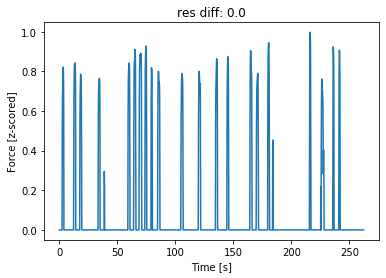

0.017318999999999998


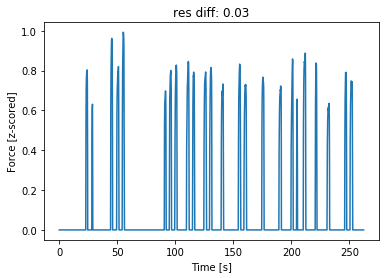

0.0


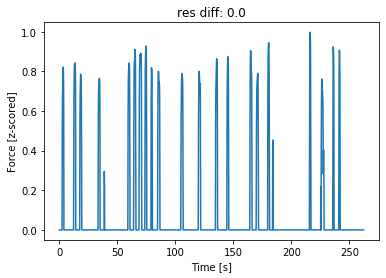

0.0


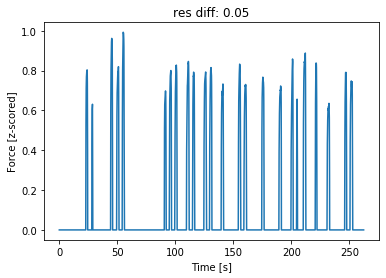

In [122]:
model = xgb.XGBRegressor()
df = pd.DataFrame()
for f in range(len(os.listdir(PATH_))):
    sub_ = os.listdir(PATH_)[f][4:7]
    if sub_ not in ['000', '001', '004', '005', '006', '007', '008', '009', '010', '013', '014']:
        continue
    print(sub_)
    with open(PATH_+ '\\'+ os.listdir(PATH_)[f], 'rb') as handle:
        run_ = pickle.load(handle)
        print(run_["ch_names"])
        if len([ch for ch in run_["ch_names"] if "STN" in ch]) == 0:
            continue
        print("PROCESS")
        for ch_idx, ch_ in enumerate([ch for ch in run_["ch_names"] if "MOV" not in ch]):
            if "ECOG" in ch_:
                loc = "ECOG"
            else:
                loc = "STN"
            for label_idx, label in enumerate(run_["label_baseline_corrected"]):
                if run_["label_con_true"][label_idx] is True:
                    lat = "CON"
                else:
                    lat = "IPS"
                X, y = append_time_dim(run_["rf_data_median"][:,ch_idx,:], label, time_stamps=5)
                #res_ = np.mean(cross_val_score(model, X, y, cv=3, scoring="r2", n_jobs=59))
                res_ = xgb.cv(xgb.XGBRegressor().get_params(), dtrain=xgb.DMatrix(X, label=y), 
                              feval=evalerror, nfold=3, shuffle=False, stratified=False).iloc[-1]["test-r2-mean"]
                res_shuffled = xgb.cv(xgb.XGBRegressor().get_params(), dtrain=xgb.DMatrix(X, label=y), 
                              feval=evalerror, nfold=3, shuffle=True, stratified=False).iloc[-1]["test-r2-mean"]
                print(res_)
                if "LEFT" in ch_:
                    hem = "LEFT"
                else:
                    hem = "RIGHT"
                df = df.append({
                    "r2": res_,
                    "res_non_shuffled" : res_shuffled,
                    "res_diff" : res_shuffled - res_,
                    "ch_": ch_,
                    "sub": sub_,
                    "loc": loc,
                    "lat": lat,
                    "hem" : hem, 
                    "y_var" : np.std(y),
                    "y" :y, 
                    "y_var_mov" : y[np.nonzero(y)[0]].std(), 
                    "y_var_mov_peaks" : y[signal.find_peaks(y)[0]].std()
                }, ignore_index=True)
                plt.plot(np.arange(0, y.shape[0],1)*0.1, y)
                plt.xlabel("Time [s]")
                plt.ylabel("Force [z-scored]")
                plt.title("res diff: "+str(np.round(res_shuffled - res_,2)))
                plt.show()

In [114]:
df.shape

(666, 12)

In [102]:
from scipy import signal

In [104]:
y[signal.find_peaks(y)[0]]

array([0.59080615, 0.89018239, 0.66711442, 0.91148453, 0.90164116,
       0.87480015, 0.9001386 , 0.88533267, 0.97367281, 0.94203756,
       1.        , 0.97364289, 0.90777866, 0.89823866, 0.9126352 ,
       0.90774153, 0.87613038, 0.86233425, 0.87646201, 0.78977304,
       0.82097377, 0.88009203, 0.86547984, 0.8844534 , 0.94086501,
       0.87909052, 0.89796821, 0.8568112 , 0.81722848, 0.82881051,
       0.87681533, 0.88974518])

### Performance non shuffled

Text(0, 0.5, 'Force [z-scored]')

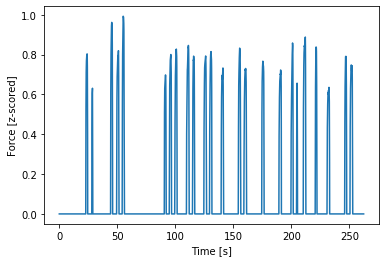

In [86]:
plt.plot(np.arange(0, y.shape[0],1)*0.1, y)
plt.xlabel("Time [s]")
plt.ylabel("Force [z-scored]")

In [71]:
res_ = xgb.cv(xgb.XGBRegressor().get_params(), dtrain=xgb.DMatrix(X, label=y), 
                              feval=evalerror, nfold=3, shuffle=False).iloc[-1]["test-r2-mean"]

In [72]:
res_

0.04435366666666667

In [73]:
res_ = xgb.cv(xgb.XGBRegressor().get_params(), dtrain=xgb.DMatrix(X, label=y), 
                              feval=evalerror, nfold=3, shuffle=True).iloc[-1]["test-r2-mean"]

In [74]:
res_

0.13595233333333334

### plot density estimations

(0, 150)

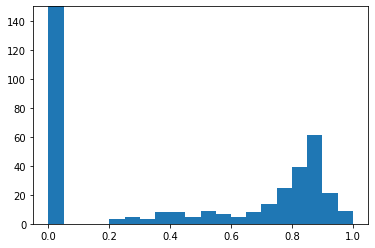

In [63]:
sub = "000"
plt.hist(df[(df["sub"] == sub) & (df["lat"] == "CON")]["y"].iloc[0], bins=20)
plt.ylim(0, 150)

In [121]:
df["y_var_mov"]

0      0.177855
1      0.177855
2      0.177855
3      0.177855
4      0.177855
         ...   
661    0.177855
662    0.177855
663    0.177855
664    0.177855
665    0.177855
Name: y_var_mov, Length: 666, dtype: float64

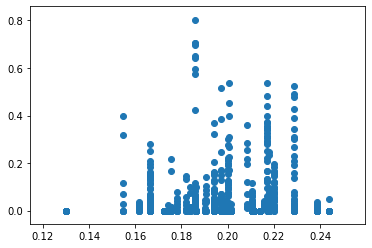

In [123]:
plt.scatter(df["y_var_mov"], df["r2"])

In [127]:
df.keys()

Index(['ch_', 'hem', 'lat', 'loc', 'r2', 'res_diff', 'res_non_shuffled', 'sub',
       'y', 'y_var', 'y_var_mov', 'y_var_mov_peaks'],
      dtype='object')

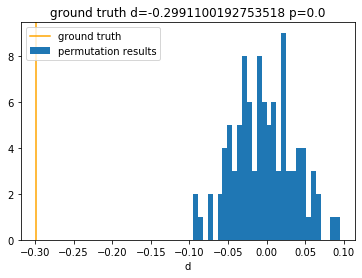

(-0.2991100192753518, 0.0)

In [134]:
icn_permutation_test.permutationTestSpearmansRho(df["y_var_mov_peaks"], 
                                                df["res_non_shuffled"],True, "d", 100)

In [133]:
icn_permutation_test.permutationTestSpearmansRho?

Text(0.5, 1.0, 'correlation std movement to performance non shuffled p=0')

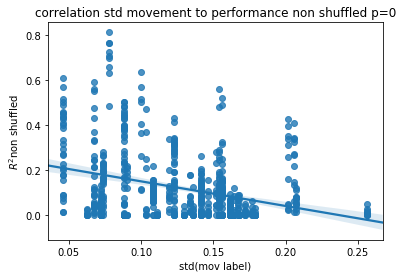

In [135]:
sb.regplot(x="y_var_mov_peaks", y="res_non_shuffled", data=df)
plt.ylabel(r"$R^2$"+ "non shuffled")
plt.xlabel("std(mov label)")
plt.title("correlation std movement to performance non shuffled p=0")

In [93]:
std_ = []
for index, row in df.iterrows():
    std_.append(row["y"][np.nonzero(row["y"])[0]].std())
    #std_.append(row["y"][np.nonzero(row["y"])[0]].std())

In [95]:
df["std_mov"] = std_

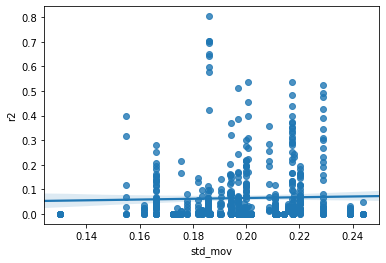

In [97]:
sb.regplot(x="std_mov", y="r2", data=df)